In [ ]:
!pip install pandas
!pip install pillow
!pip install scipy
!pip install seaborn
!pip install scikit-learn
!pip install matplotlib
!pip install ipywidgets
!pip install scikit-learn
!pip install tdqm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 6.7 MB/s  0:00:01m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pandas]2m2/3 [pandas]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 1.4 MB/s  0:00:07 eta 0:00:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [scikit-learn] [scikit-learn]


In [4]:
import ipywidgets as widgets
widgets.IntSlider()

IntSlider(value=0)

In [1]:
!pip install scikit-learn

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from scipy import stats
import ipywidgets as widgetsPext
from IPython.display import display
import io

In [11]:
#path = "dataset/Normal/4.png"
path = 'dataset/Osteopenia/OP4.JPEG'

In [6]:
img_main = Image.open(path)
img_array = np.asarray(img_main)
image_height = len(img_array)
image_width = len(img_array[0])
print("Image Dimension")
print(image_height, "X" ,image_width)

Image Dimension
1024 X 482


In [17]:
import numpy as np
from PIL import Image

def remove_white_to_black(img, threshold=240):
    """
    Convert white pixels (intensity > threshold) to black in grayscale image.
    Keeps the same size, no cropping.
    """
    arr = np.array(img)

    # Replace white pixels with black
    arr[arr > threshold] = 0

    return Image.fromarray(arr)

def pad_numpy_square_gray(img):
    """
    Pad grayscale image with black to make it square.
    """
    arr = np.array(img)
    h, w = arr.shape
    size = max(h, w)

    new_arr = np.zeros((size, size), dtype=np.uint8)  # black background

    y_offset = (size - h) // 2
    x_offset = (size - w) // 2

    new_arr[y_offset:y_offset+h, x_offset:x_offset+w] = arr

    return Image.fromarray(new_arr)

# Example usage
img = Image.open(path).convert("L")

# Step 1: change white pixels to black
no_white = remove_white_to_black(img, threshold=240)

# Step 2: pad to square
square_img = pad_numpy_square_gray(no_white)

# Save result
square_img.save("final_square.jpg")

In [18]:
imgsq = Image.open("final_square.jpg").convert("L")
img_array = np.asarray(imgsq)
image_height = len(img_array)
image_width = len(img_array[0])
print("Image Dimension")
print(image_height, "X" ,image_width)

Image Dimension
1024 X 1024


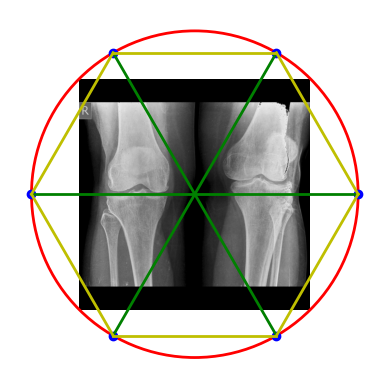

In [19]:
# Load squared grayscale image
img = Image.open("final_square.jpg").convert("L")
arr = np.array(img)

h, w = arr.shape
assert h == w, "Image must be square!"

# Center of image
cx, cy = w // 2, h // 2

# Radius = half of diagonal
radius = int(np.sqrt(2) * w / 2)

# Plot image
fig, ax = plt.subplots()
ax.imshow(arr, cmap="gray")

# Draw circle with exact radius
circle = plt.Circle((cx, cy), radius, color="red", fill=False, linewidth=2)
ax.add_patch(circle)

# Angles for 6 points (radians)
angles = np.linspace(0, 2*np.pi, 6, endpoint=False)

# Compute coordinates of the 6 points
points = [(cx + radius*np.cos(a), cy + radius*np.sin(a)) for a in angles]


# Plot the 6 points
for (x, y) in points:
    ax.plot(x, y, 'bo', markersize=6)   # blue dots

# Draw lines from center to each point
for (x, y) in points:
    ax.plot([cx, x], [cy, y], 'g-', linewidth=2)


for i in range(len(points)):
    x1, y1 = points[i]
    x2, y2 = points[(i+1) % len(points)]  # wrap around to connect last→first
    ax.plot([x1, x2], [y1, y2], 'y-', linewidth=2)  # yellow hexagon edges


# Expand axis limits so circle is visible
ax.set_xlim(0 - w*0.3, w + w*0.3)
ax.set_ylim(h + h*0.3, 0 - h*0.3)  # inverted y for image display

ax.set_aspect('equal')
plt.axis("off")
plt.show()

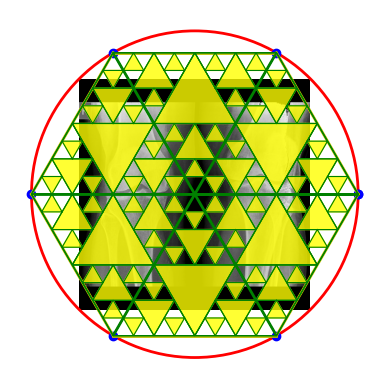

In [20]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# --- Sierpinski Plotting Functions (Corrected) ---
def get_midpoint(p1, p2):
    """Calculates the midpoint of a line segment."""
    return ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)

def plot_sierpinski(v1, v2, v3, ax, level):
    """Recursively plots Sierpinski triangles."""
    if level == 0:
        return

    # Draw the triangle for the current level # meaning
    ax.plot([v1[0], v2[0], v3[0], v1[0]], [v1[1], v2[1], v3[1], v1[1]], color='green', linewidth=0.8)

    # Calculate midpoints
    m1 = get_midpoint(v1, v2)
    m2 = get_midpoint(v2, v3)
    m3 = get_midpoint(v1, v3)

    # Fill the central, "necessary" triangle at every level > 0
    # This is the key correction.
    ax.fill([m1[0], m2[0], m3[0],m1[0]], [m1[1], m2[1], m3[1],m1[1]], color='yellow', alpha=0.8)
    ax.plot([m1[0], m2[0], m3[0], m1[0]], [m1[1], m2[1], m3[1], m1[1]], color='green', linewidth=0.8)
    # Recursively call for the 3 outer triangles
    plot_sierpinski(v1, m1, m3, ax, level - 1)
    plot_sierpinski(m1, v2, m2, ax, level - 1)
    plot_sierpinski(m3, m2, v3, ax, level - 1)


# --- Your Original Code (Slightly modified) ---
# Load squared grayscale image
img = Image.open("final_square.jpg").convert("L")
arr = np.array(img)

h, w = arr.shape
assert h == w, "Image must be square!"

# Center of image
cx, cy = w // 2, h // 2

# Radius = half of diagonal
radius = int(np.sqrt(2) * w / 2)

# Plot image
fig, ax = plt.subplots()
ax.imshow(arr, cmap="gray")

# Draw circle with exact radius
circle = plt.Circle((cx, cy), radius, color="red", fill=False, linewidth=2)
ax.add_patch(circle)

# Angles for 6 points (radians)
angles = np.linspace(0, 2*np.pi, 7)

# Compute coordinates of the 6 points #check this code 
points = [(cx + radius*np.cos(a), cy + radius*np.sin(a)) for a in angles]


# Plot the 6 points
for (x, y) in points:
    ax.plot(x, y, 'bo', markersize=6)   # blue dots

# Draw lines from center to each point
for (x, y) in points:
    ax.plot([cx, x], [cy, y], 'g-', linewidth=2)


for i in range(len(points) - 1):
    x1, y1 = points[i]
    x2, y2 = points[(i+1) % len(points)]  # wrap around to connect last→first
    ax.plot([x1, x2], [y1, y2], 'y-', linewidth=2)  #  hexagon edges


# Expand axis limits so circle is visible
ax.set_xlim(0 - w*0.3, w + w*0.3)
ax.set_ylim(h + h*0.3, 0 - h*0.3)  # inverted y for image display

ax.set_aspect('equal')
plt.axis("off")


# --- New Loop to Plot the Sierpinski Triangles (Add this) ---
center_point = (cx, cy)
recursion_level = 3 # You can change this level to get more or fewer triangles

for i in range(len(points)):
    p1 = points[i]
    p2 = points[(i + 1) % len(points)]  

    # Call the recursive plotting function for each of the 6 main triangles
    plot_sierpinski(center_point, p1, p2, ax, recursion_level)

# Show the final plot
plt.show()

In [16]:
from PIL import Image

Sierspinski trinagle CSV

In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
from scipy import stats
from functools import lru_cache
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm import tqdm # ADDED: For a helpful progress bar


def safe_moments(arr):
    if len(arr) < 2 or np.std(arr) < 1e-8:  # Too few values or almost constant
        return {"skewness": 0.0, "kurtosis": 0.0}
    return {
        "skewness": float(stats.skew(arr)),
        "kurtosis": float(stats.kurtosis(arr))
    }

# --- Configuration ---
RESIZE_DIM = (512, 512) # ADDED: Define a standard size for all images

# --- Helper Functions ---

def remove_white_to_black(img, threshold=240):
    """Replace white (>=threshold) with black in grayscale image."""
    arr = np.array(img)
    arr[arr >= threshold] = 0
    return Image.fromarray(arr)

def pad_numpy_square_gray(img):
    """Pad grayscale image with black to make it square."""
    arr = np.array(img)
    h, w = arr.shape
    size = max(h, w)
    new_arr = np.zeros((size, size), dtype=np.uint8)
    y_offset = (size - h) // 2
    x_offset = (size - w) // 2
    new_arr[y_offset:y_offset+h, x_offset:x_offset+w] = arr
    return Image.fromarray(new_arr)

def get_midpoint(p1, p2):
    """Calculates the midpoint between two points."""
    return ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)

def generate_sierpinski_triangles(v1, v2, v3, level):
    """
    Recursively generates the vertices of the 'hole' triangles.
    This function is a generator that yields the coordinates.
    """
    if level <= 0:
        return

    m1 = get_midpoint(v1, v2)
    m2 = get_midpoint(v2, v3)
    m3 = get_midpoint(v1, v3)

    yield (m1, m2, m3)

    yield from generate_sierpinski_triangles(v1, m1, m3, level - 1)
    yield from generate_sierpinski_triangles(m1, v2, m2, level - 1)
    yield from generate_sierpinski_triangles(m3, m2, v3, level - 1)


# --- Caching and Processing Functions ---
def extract_features(sub_triangle_pixels):
    """Compute stats from pixels."""
    nonzero_pixels = sub_triangle_pixels[sub_triangle_pixels > 0]
    if nonzero_pixels.size < 2:
        return {
            "mean": 0,
            "median": 0,
            "std_dev": 0,
            "skewness": np.nan,
            "kurtosis": np.nan
        }

    nonzero_pixels = nonzero_pixels.astype(np.float64)

    # Use safe moments
    moments = safe_moments(nonzero_pixels)

    return {
        "mean": float(np.mean(nonzero_pixels)),
        "median": float(np.median(nonzero_pixels)),
        "std_dev": float(np.std(nonzero_pixels)),
        "skewness": moments["skewness"],
        "kurtosis": moments["kurtosis"]
    }


@lru_cache(maxsize=5)
def get_triangle_masks(w, h, recursion_level=3):
    """Precompute masks for the 'hole' triangles for a given size."""
    cx, cy = w // 2, h // 2
    # Adjust radius slightly to ensure vertices are within the image bounds
    radius = min(w, h) // 2 * 0.95
    
    # Vertices of a regular hexagon
    main_points = [
        (cx + radius * np.cos(angle), cy + radius * np.sin(angle))
        for angle in np.linspace(0, 2 * np.pi, 7)
    ]
    center_point = (cx, cy)

    all_masks = []
    for i in range(6):
        p1, p2 = main_points[i], main_points[i + 1]
        
        sierpinski_verts = list(generate_sierpinski_triangles(center_point, p1, p2, level=recursion_level))
        
        mask_set = []
        for vertices in sierpinski_verts:
            mask = Image.new("L", (w, h), 0)
            draw = ImageDraw.Draw(mask)
            # CHANGED: Simplified polygon drawing call. PIL can handle a list of tuples.
            draw.polygon(vertices, fill=1)
            mask_set.append(np.array(mask, dtype=bool))
        all_masks.append(mask_set)
    return all_masks

def process_single_image(args):
    img_path, class_label, label_map = args
    try:
        img = Image.open(img_path).convert("L")
        no_white = remove_white_to_black(img, threshold=240)
        square_img = pad_numpy_square_gray(no_white)
        
        # ADDED: Standardize image size. This is the key fix.#check this what it does
        resized_img = square_img.resize(RESIZE_DIM, Image.Resampling.LANCZOS)
        
        arr = np.array(resized_img)
        h, w = arr.shape

        # Now, w and h will be constant (e.g., 512), so the cache will be hit every time.
        masks = get_triangle_masks(w, h, recursion_level=3)
        row_features = {}

        triangle_count = 0
        for mask_set in masks:
            for mask_arr in mask_set:
                sub_triangle_pixels = arr[mask_arr]
                features = extract_features(sub_triangle_pixels)
                for fname, val in features.items():
                    if np.isnan(val) or np.isinf(val):
                        row_features[f"triangle_{triangle_count + 1}_{fname}"] = 0
                    else:
                        row_features[f"triangle_{triangle_count + 1}_{fname}"] = val
                triangle_count += 1
        
        row_features["label"] = label_map.get(class_label, -1)
        return row_features
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None # Return None on error

# --- Main Dataset Processing ---
def process_dataset_wide(root_folder, output_csv, num_workers=4):
    label_map = {"Normal": 0, "Osteoporosis": 1, "Osteopenia": 2}
    
    tasks = []
    for class_label in os.listdir(root_folder):
        class_folder = os.path.join(root_folder, class_label)
        if os.path.isdir(class_folder) and class_label in label_map:
            for img_name in os.listdir(class_folder):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_folder, img_name)
                    tasks.append((img_path, class_label, label_map))

    all_rows = []
    # Use ProcessPoolExecutor within a 'with' statement for proper cleanup
    with ProcessPoolExecutor(max_workers=num_workers) as executor:
        # ADDED: Use tqdm to show a progress bar
        futures = [executor.submit(process_single_image, task) for task in tasks]
        for f in tqdm(as_completed(futures), total=len(tasks), desc="Processing Images"):
            result = f.result()
            if result: # Check if the result is not None
                all_rows.append(result)

    if not all_rows:
        print("No features were extracted. Check dataset path and image files.")
        return

    df = pd.DataFrame(all_rows)
    df.to_csv(output_csv, index=False)
    print(f"\nWide-format features saved to {output_csv}")

# --- Execution ---
# ADDED: Essential guard for multiprocessing
if __name__ == "__main__":
    root_folder = "dataset"
    output_csv = "triangle_features_78_stable_final_file.csv"
    # It's good practice to use os.cpu_count() or a slightly lower number
    workers = max(1, os.cpu_count() - 1 if os.cpu_count() else 1)
    process_dataset_wide(root_folder, output_csv, num_workers=workers)

Processing Images: 100%|██████████| 616/616 [00:28<00:00, 21.59it/s]



✅ Wide-format features saved to triangle_features_78_stable_final_file.csv


In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer

In [4]:
data = pd.read_csv('triangle_features_78_stable_final_file.csv')
data.head()

,triangle_1_mean,triangle_1_median,triangle_1_std_dev,triangle_1_skewness,triangle_1_kurtosis,triangle_2_mean,triangle_2_median,triangle_2_std_dev,triangle_2_skewness,triangle_2_kurtosis,...,triangle_77_median,triangle_77_std_dev,triangle_77_skewness,triangle_77_kurtosis,triangle_78_mean,triangle_78_median,triangle_78_std_dev,triangle_78_skewness,triangle_78_kurtosis,label
0,140.207851,135.0,40.265839,0.059978,0.451244,82.389688,92.0,30.105577,-0.647993,-0.590148,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,2
1,4.000000,4.0,0.000000,0.000000,0.000000,3.956235,4.0,0.204572,-4.460390,17.895083,...,4.0,0.000000,0.000000,0.000000,4.000000,4.0,0.000000,0.000000,0.00000,2
2,7.469568,7.0,2.860494,6.859441,48.713306,32.089928,25.0,26.289006,0.894554,0.087310,...,7.0,0.000000,0.000000,0.000000,7.000000,7.0,0.000000,0.000000,0.00000,2
3,13.095253,13.0,4.404259,13.635992,213.636531,43.859375,11.0,55.155980,1.273222,0.126807,...,13.0,0.000000,0.000000,0.000000,13.000000,13.0,0.000000,0.000000,0.00000,2
4,134.926202,136.0,43.221892,-0.060247,-1.166228,57.594125,51.0,19.967423,0.511852,0.006208,...,46.0,28.526613,-0.191506,-1.596096,5.980263,7.0,2.626961,-0.703637,-0.64356,2


In [4]:
data[0:5]

,triangle_1_mean,triangle_1_median,triangle_1_std_dev,triangle_1_skewness,triangle_1_kurtosis,triangle_2_mean,triangle_2_median,triangle_2_std_dev,triangle_2_skewness,triangle_2_kurtosis,...,triangle_77_median,triangle_77_std_dev,triangle_77_skewness,triangle_77_kurtosis,triangle_78_mean,triangle_78_median,triangle_78_std_dev,triangle_78_skewness,triangle_78_kurtosis,label
0,140.207851,135.0,40.265839,0.059978,0.451244,82.389688,92.0,30.105577,-0.647993,-0.590148,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,2
1,4.000000,4.0,0.000000,0.000000,0.000000,3.956235,4.0,0.204572,-4.460390,17.895083,...,4.0,0.000000,0.000000,0.000000,4.000000,4.0,0.000000,0.000000,0.00000,2
2,7.469568,7.0,2.860494,6.859441,48.713306,32.089928,25.0,26.289006,0.894554,0.087310,...,7.0,0.000000,0.000000,0.000000,7.000000,7.0,0.000000,0.000000,0.00000,2
3,13.095253,13.0,4.404259,13.635992,213.636531,43.859375,11.0,55.155980,1.273222,0.126807,...,13.0,0.000000,0.000000,0.000000,13.000000,13.0,0.000000,0.000000,0.00000,2
4,134.926202,136.0,43.221892,-0.060247,-1.166228,57.594125,51.0,19.967423,0.511852,0.006208,...,46.0,28.526613,-0.191506,-1.596096,5.980263,7.0,2.626961,-0.703637,-0.64356,2


In [5]:
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y= df["label"].values
df.shape

(616, 391)

In [6]:
import numpy as np

print("Any NaN in X? ", np.isnan(X).any())
print("How many NaNs? ", np.isnan(X).sum())

Any NaN in X?  False
How many NaNs?  0


## Machine Learning 80/20

In [9]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [11]:
from sklearn.preprocessing import StandardScaler

# Create the scaler object
scaler = StandardScaler()

# Fit only on training data, then transform it
X_train = scaler.fit_transform(X_train)

# Use the same scaler (already fitted) to transform test data
X_test = scaler.transform(X_test)


## SVM - kernel = linear 80

In [ ]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["linear"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("Best Parameters:", grid.best_params_)
print("Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits


[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=linear;, score=0.564 total time=   0.2s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=linear;, score=0.659 total time=   0.1s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=linear;, score=0.624 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=linear;, score=0.573 total time=   0.3s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=linear;, score=0.573 total time=   0.3s
[CV 5/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=linear;, score=0.669 total time=   0.1s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ov

In [12]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="linear", C=0.001, gamma=0.001, decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,0.001
,kernel,'linear'
,degree,3
,gamma,0.001
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


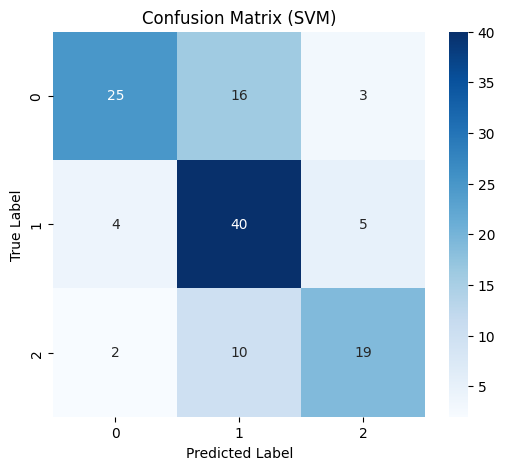


Classification Report:

              precision    recall  f1-score   support

           0       0.81      0.57      0.67        44
           1       0.61      0.82      0.70        49
           2       0.70      0.61      0.66        31

    accuracy                           0.68       124
   macro avg       0.71      0.67      0.67       124
weighted avg       0.70      0.68      0.68       124

Training Accuracy: 0.6686991869918699
Test Accuracy: 0.6774193548387096


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
10 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sayan/miniconda3/envs/pytor

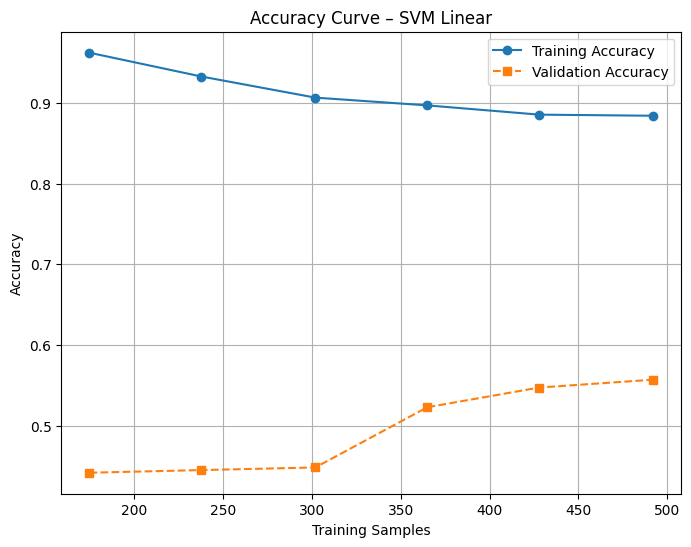

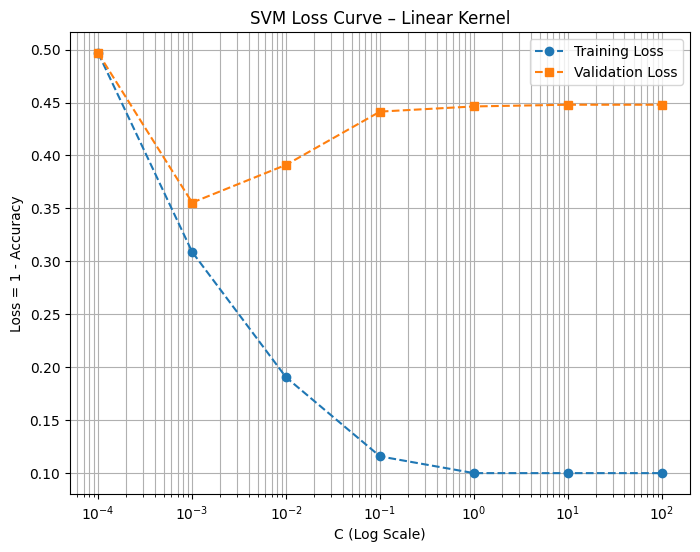

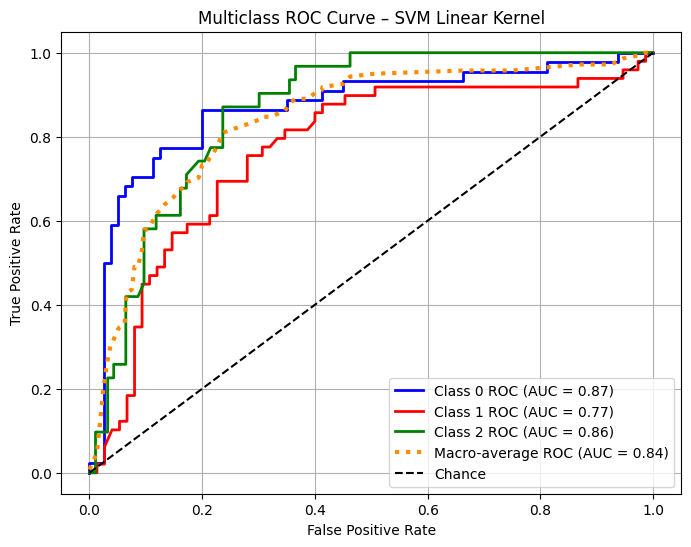

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.1):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = SVC(
        kernel="linear",
        C=C,
        probability=True
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])
    
    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})", lw=3)

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – SVM Linear Kernel")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.01)


## SVM - kernal = sigmoid 80

In [14]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with sigmoid
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["sigmoid"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.185 total time=   0.2s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=sigmoid;, score=0.185 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.190 total time=   0.2s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.185 total time=   0.2s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.190 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.190 total time=   0.2s
[CV 4/5] END s

In [15]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="sigmoid", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,1
,kernel,'sigmoid'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


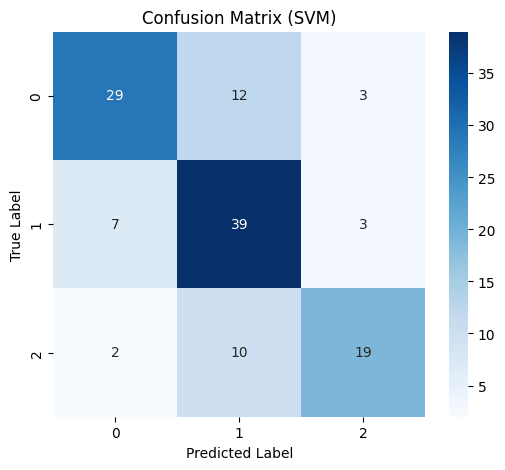


Classification Report:

              precision    recall  f1-score   support

           0       0.76      0.66      0.71        44
           1       0.64      0.80      0.71        49
           2       0.76      0.61      0.68        31

    accuracy                           0.70       124
   macro avg       0.72      0.69      0.70       124
weighted avg       0.71      0.70      0.70       124

Training Accuracy: 0.6869918699186992
Test Accuracy: 0.7016129032258065


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


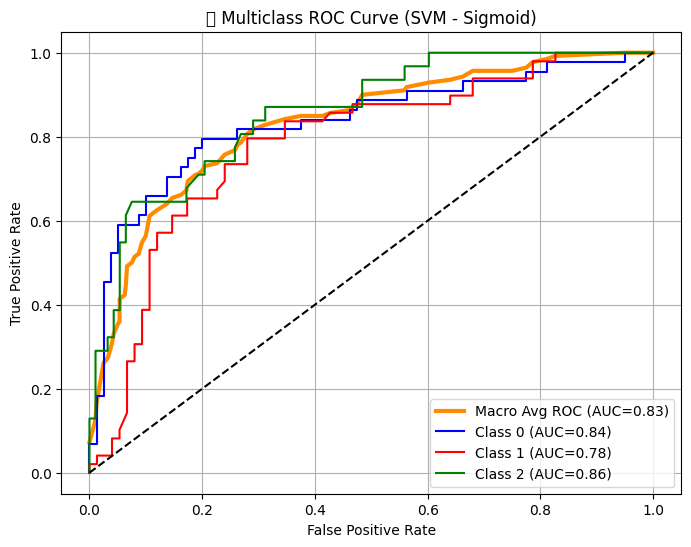

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


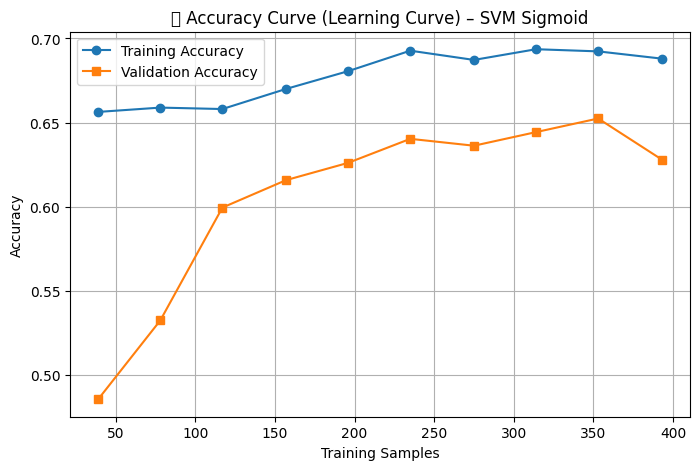

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


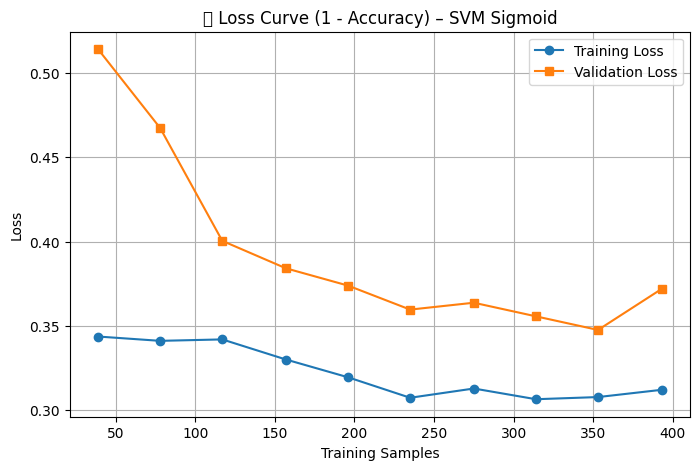

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# -----------------------------------------
# 1️⃣  MULTICLASS ROC CURVE  (ONE-VS-REST)
# -----------------------------------------

# SVM must be refitted with probability=True for ROC
svm_prob = SVC(
    kernel="sigmoid",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for OVR ROC curve
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# -------- Plot ROC -------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         label=f"Macro Avg ROC (AUC={roc_auc['macro']:.2f})", linewidth=3)

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM - Sigmoid)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

## SVM - kernal = polynomial 80

In [159]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["poly"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.581 total time=   0.2s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.393 total time=   0.2s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.525 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.391 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.538 total time=   0.2s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.566 total time=   0.2s
[CV 2/5] END svc__C=0.001, sv

In [10]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="poly", C=0.1, gamma=0.01, decision_function_shape="ovo",random_state = 42,class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,0.1
,kernel,'poly'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


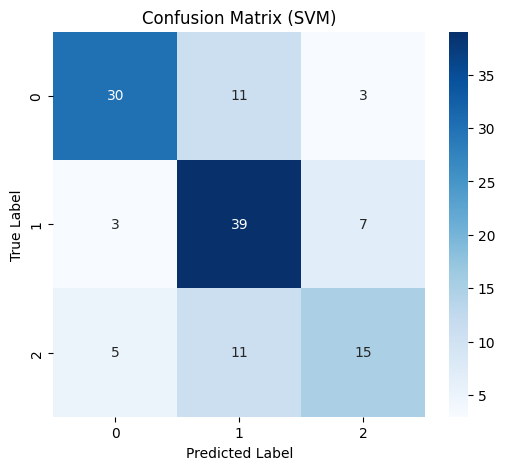


Classification Report:

              precision    recall  f1-score   support

           0       0.79      0.68      0.73        44
           1       0.64      0.80      0.71        49
           2       0.60      0.48      0.54        31

    accuracy                           0.68       124
   macro avg       0.68      0.65      0.66       124
weighted avg       0.68      0.68      0.67       124

Training Accuracy: 0.8658536585365854
Test Accuracy: 0.6774193548387096


In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


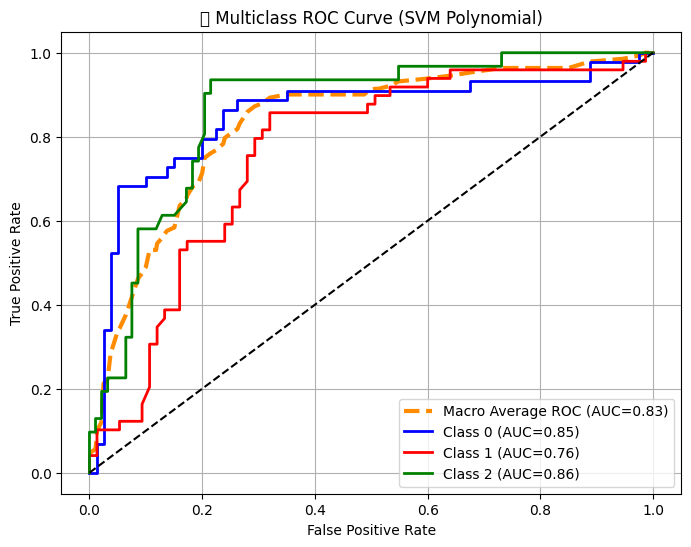

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


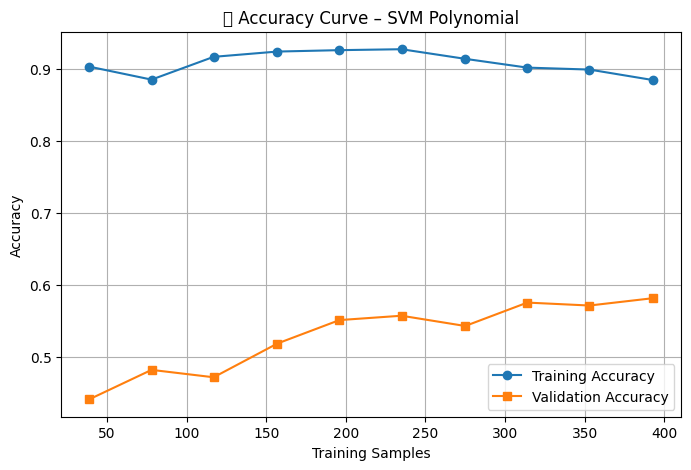

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


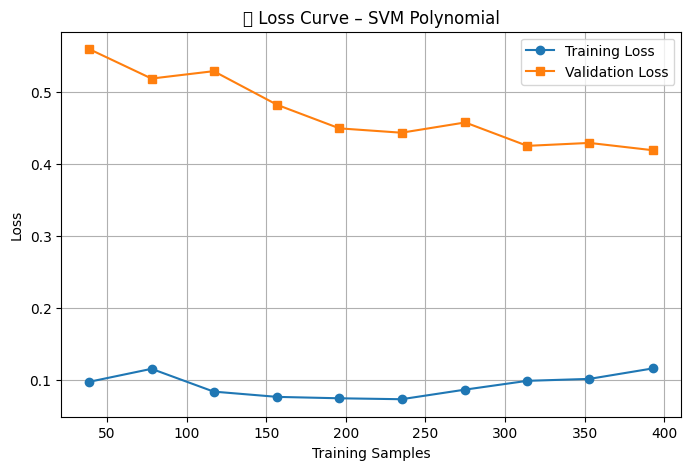

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (ONE-VS-REST)
# ============================================================

# SVM must be trained with probability=True for ROC
svm_prob = SVC(
    kernel="poly",
    C=0.1,
    gamma=0.01,
    decision_function_shape="ovo",
    probability=True,
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize test labels
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

# Store ROC curves
fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# ------------ Plot ROC --------------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         linewidth=3, linestyle='--',
         label=f"Macro Average ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM Polynomial)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()



## SVM - kernal = rbf 80

In [12]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["rbf"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits


[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.185 total time=   0.2s
[CV 5/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.186 total time=   0.2s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.190 total time=   0.2s
[CV 5/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.186 total time=   0.2s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.190 total time=   0.2s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.190 total time=   0.2s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=scale, sv

In [13]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="rbf", probability=True, C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)


,C,1
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,True
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


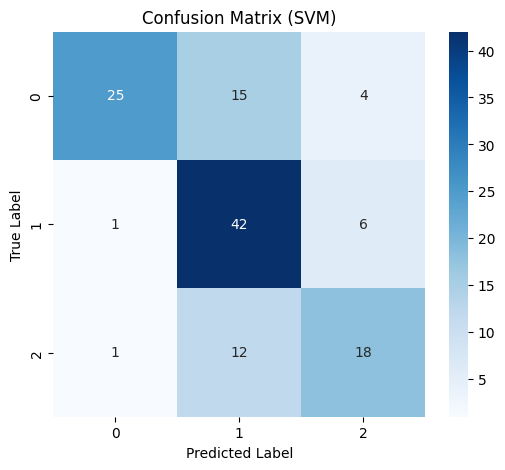


Classification Report:

              precision    recall  f1-score   support

           0       0.93      0.57      0.70        44
           1       0.61      0.86      0.71        49
           2       0.64      0.58      0.61        31

    accuracy                           0.69       124
   macro avg       0.73      0.67      0.68       124
weighted avg       0.73      0.69      0.68       124

Training Accuracy: 0.758130081300813
Test Accuracy: 0.6854838709677419


In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


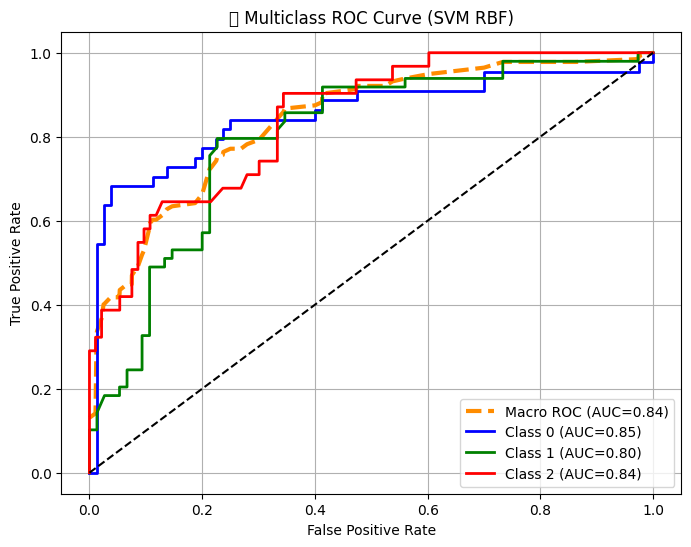

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


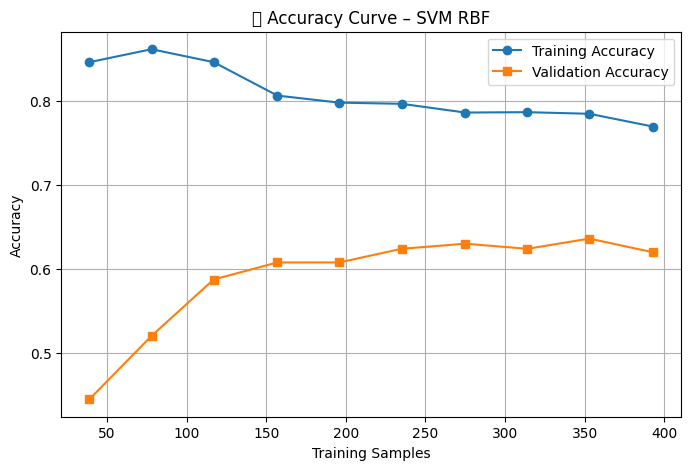

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


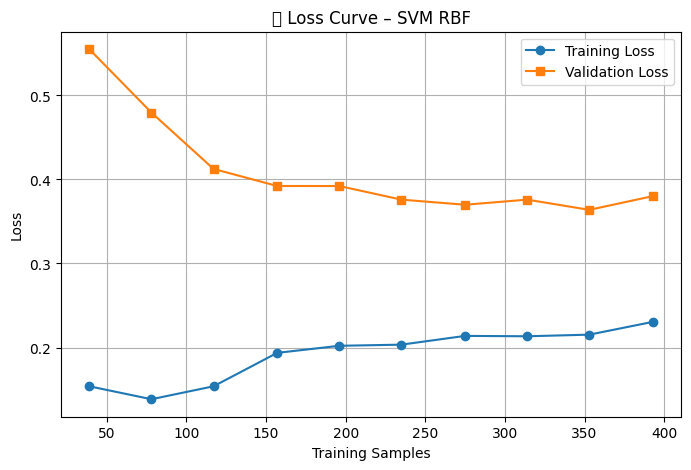

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (SVM must use probability=True)
# ============================================================

svm_prob = SVC(
    kernel="rbf",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,    # Required for ROC Curve
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for One-vs-Rest ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange', linewidth=3,
         linestyle='--', label=f"Macro ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'green', 'red']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("🔵 Multiclass ROC Curve (SVM RBF)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()



## KNeighborsClassifier 80

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [20]:
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y= df["label"].values
X[np.isnan(X)] = 0
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [21]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# --- Load your data ---
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y = df["label"].values

# Replace NaNs
X[np.isnan(X)] = 0

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- Build a pipeline (scaler + KNN) ---
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# --- Define parameter grid ---
param_grid = {
    "knn__n_neighbors": [1, 3, 5, 7, 9, 11, 15],
    "knn__weights": ["uniform", "distance"],
    "knn__p": [1, 2],  # Manhattan vs Euclidean
    "knn__metric": ["minkowski"]
}

# --- Grid Search ---
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(X_train, y_train)

# --- Results ---
print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)

# Evaluate on test
test_accuracy = grid.score(X_test, y_test)
print("Test accuracy:", test_accuracy)


Best parameters: {'knn__metric': 'minkowski', 'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'uniform'}
Best CV accuracy: 0.6017316017316017
Test accuracy: 0.6693548387096774


In [22]:
knn = KNeighborsClassifier(n_neighbors=9, metric="minkowski", p=1,weights="uniform")  # Euclidean distance
knn.fit(X_train, y_train)

,n_neighbors,9
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [23]:
y_pred = knn.predict(X_test)
y_probs = knn.predict_proba(X_test)[:, 1]

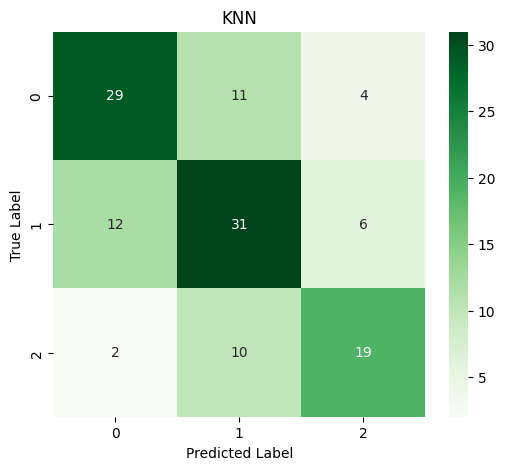


Classification Report:

              precision    recall  f1-score   support

           0       0.67      0.66      0.67        44
           1       0.60      0.63      0.61        49
           2       0.66      0.61      0.63        31

    accuracy                           0.64       124
   macro avg       0.64      0.63      0.64       124
weighted avg       0.64      0.64      0.64       124

Training Accuracy: 0.6463414634146342
Test Accuracy: 0.6370967741935484


In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = knn.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("KNN")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, knn.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))


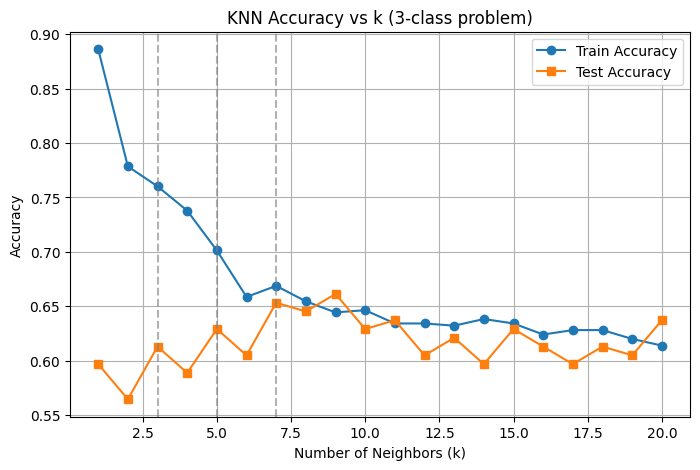

In [25]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_acc = []
test_acc = []
k_values = range(1, 21)  # test k=1 to 20

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_acc.append(accuracy_score(y_train, knn.predict(X_train)))
    test_acc.append(accuracy_score(y_test, knn.predict(X_test)))

# --- Plot ---
plt.figure(figsize=(8,5))
plt.plot(k_values, train_acc, marker='o', label="Train Accuracy")
plt.plot(k_values, test_acc, marker='s', label="Test Accuracy")
plt.axvline(x=3, color="gray", linestyle="--", alpha=0.6)  # mark k=3
plt.axvline(x=5, color="gray", linestyle="--", alpha=0.6)  # mark k=5
plt.axvline(x=7, color="gray", linestyle="--", alpha=0.6)  # mark k=7
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN Accuracy vs k (3-class problem)")
plt.legend()
plt.grid(True)
plt.show()


In [26]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

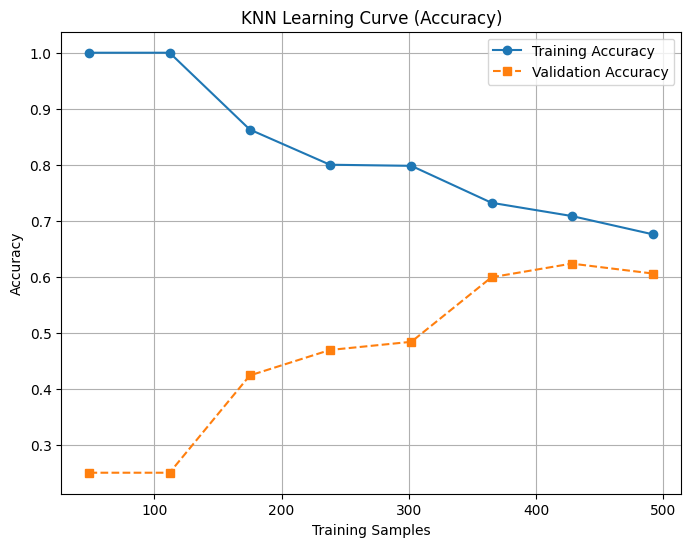

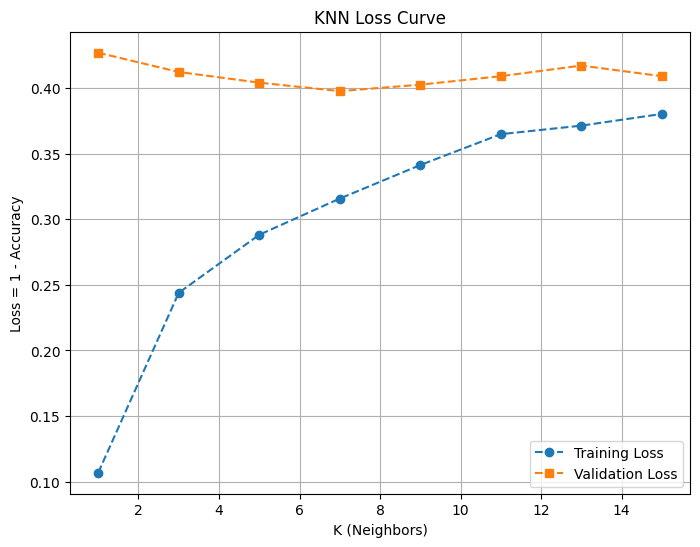

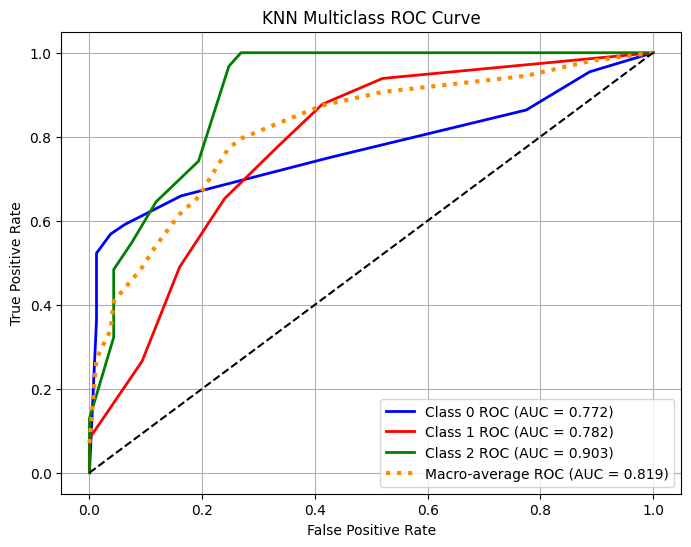

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. KNN MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_knn_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=9,
            weights="uniform",
            metric="minkowski",
            p=1
        ))
    ])

    knn_model.fit(X_train, y_train)
    y_score = knn_model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("KNN Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL KNN PLOTS
# ==========================================================

plot_knn_multiclass_roc(X_train, X_test, y_train, y_test)


## RandomForest 80

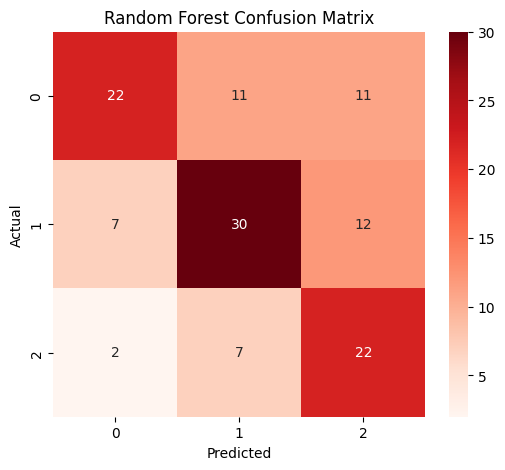


Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.50      0.59        44
           1       0.62      0.61      0.62        49
           2       0.49      0.71      0.58        31

    accuracy                           0.60       124
   macro avg       0.61      0.61      0.59       124
weighted avg       0.62      0.60      0.60       124

Training Accuracy: 0.8963414634146342
Test Accuracy: 0.5967741935483871


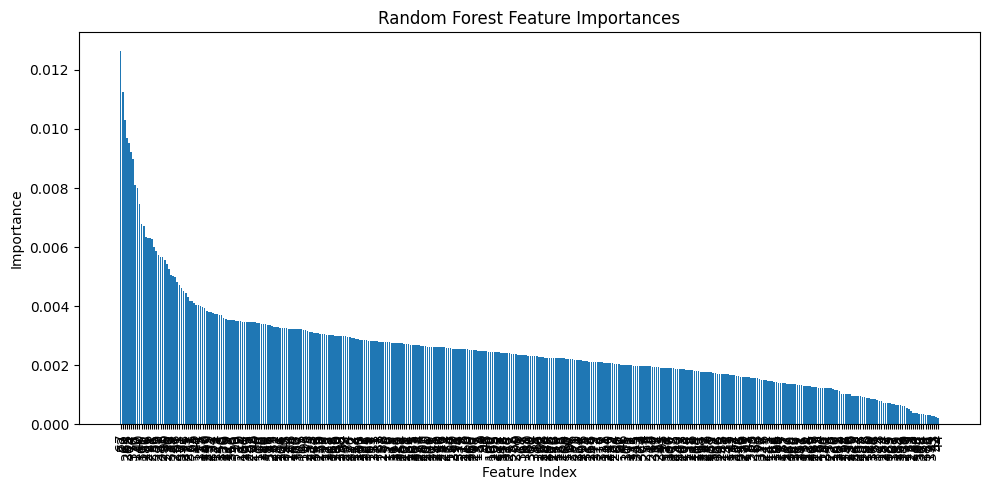

In [44]:
from sklearn.ensemble import RandomForestClassifier

# --- 5. Train Random Forest ---
rf = RandomForestClassifier(
    n_estimators=200,    # number of trees
    max_depth=None,      # let trees expand fully
    random_state=42,
    n_jobs=-1            # use all CPU cores
)
rf.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = rf.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, rf.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))
# --- 9. Feature Importance Plot ---
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10,5))
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), indices, rotation=90)
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

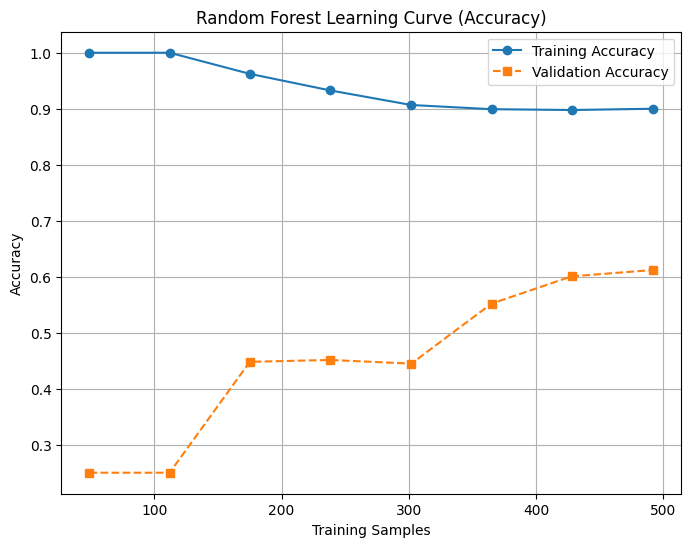

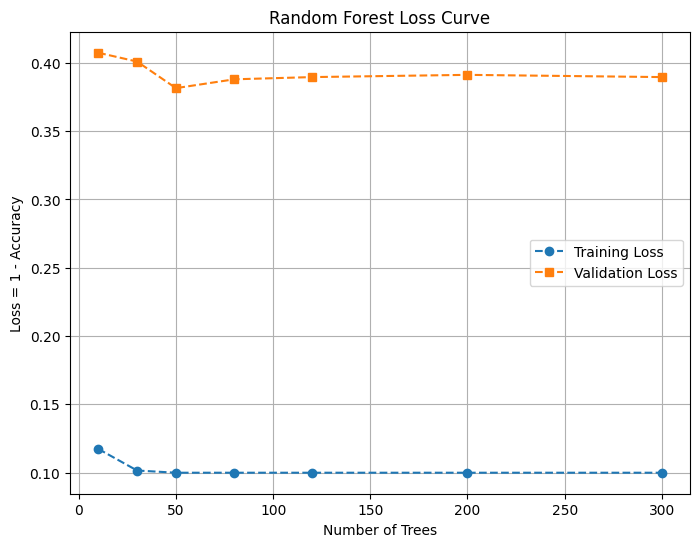

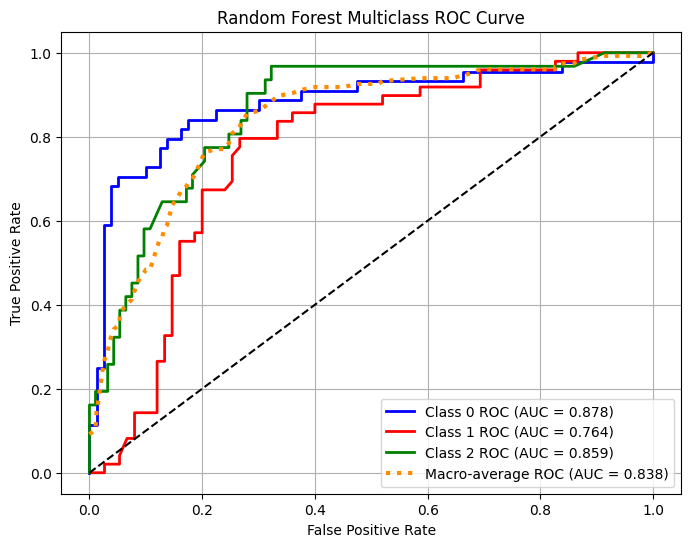

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. RANDOM FOREST MULTICLASS ROC CURVE
# ==========================================================
def plot_rf_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = RandomForestClassifier(
        n_estimators=200,
        random_state=42
    )

    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i]
        )
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot ROC
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":", lw=3,
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Random Forest Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL PLOTS
# ==========================================================
plot_rf_multiclass_roc(X_train, X_test, y_train, y_test)

## Logistic Regression 80

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


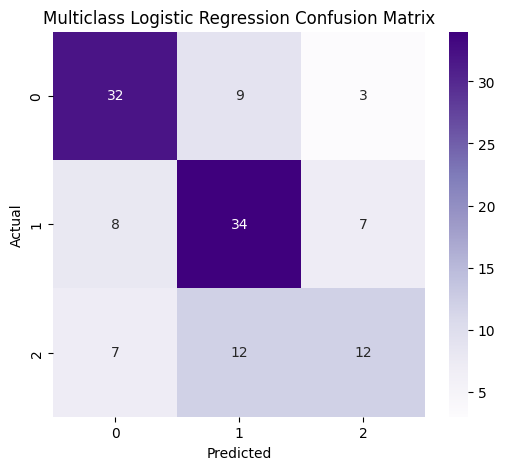


Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.73      0.70        44
           1       0.62      0.69      0.65        49
           2       0.55      0.39      0.45        31

    accuracy                           0.63       124
   macro avg       0.61      0.60      0.60       124
weighted avg       0.62      0.63      0.62       124

Training Accuracy: 0.8882113821138211
Test Accuracy: 0.6290322580645161


In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
logreg = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        max_iter=3000,
        random_state=42
    )
)
# --- 5. Multiclass Logistic Regression ---
#  # use softmax for multiclass     
logreg.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = logreg.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Multiclass Logistic Regression Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, logreg.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1262: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.


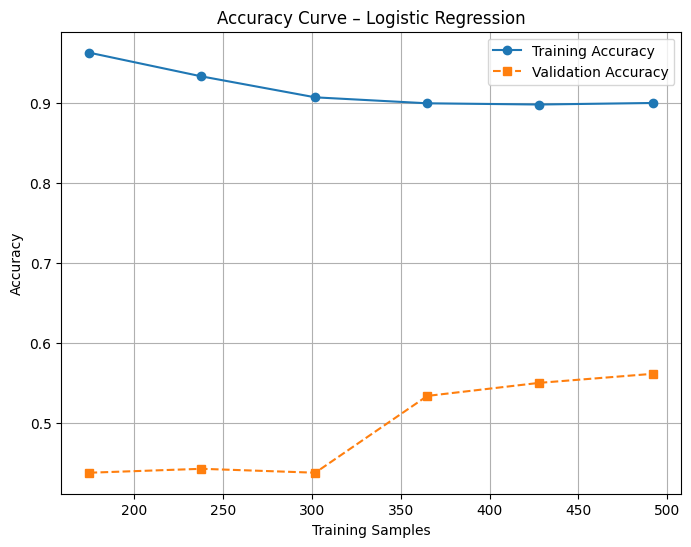

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/sit

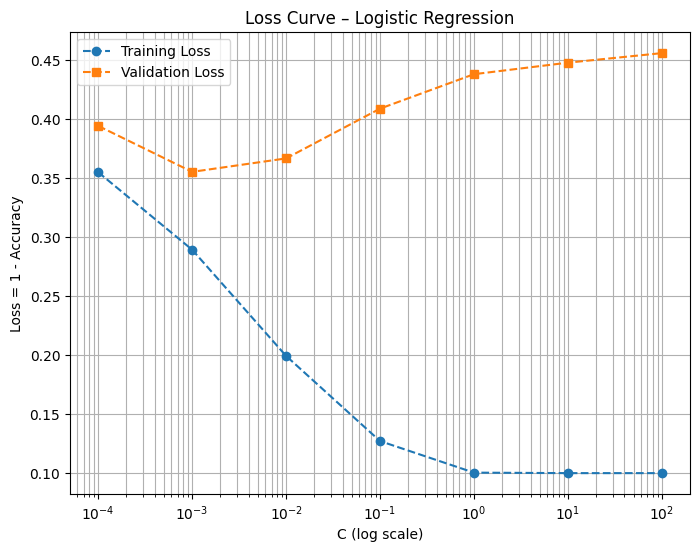

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


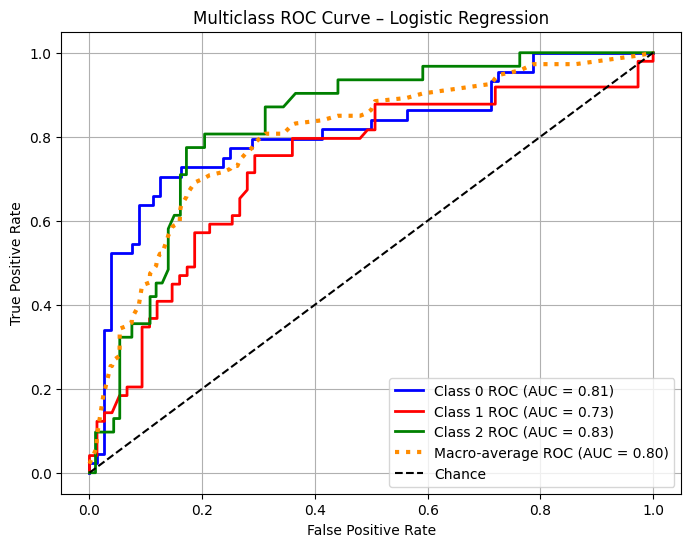

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        C=C,
        max_iter=2000
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-Average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Logistic Regression")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0)


## DecisionTree 80

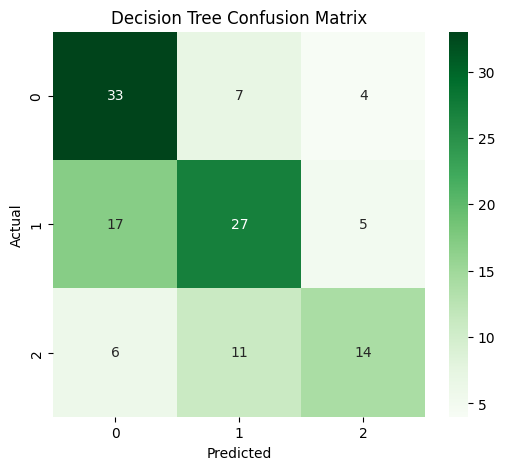


Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.75      0.66        44
           1       0.60      0.55      0.57        49
           2       0.61      0.45      0.52        31

    accuracy                           0.60       124
   macro avg       0.60      0.58      0.58       124
weighted avg       0.60      0.60      0.59       124

Training Accuracy: 0.8882113821138211
Test Accuracy: 0.5967741935483871


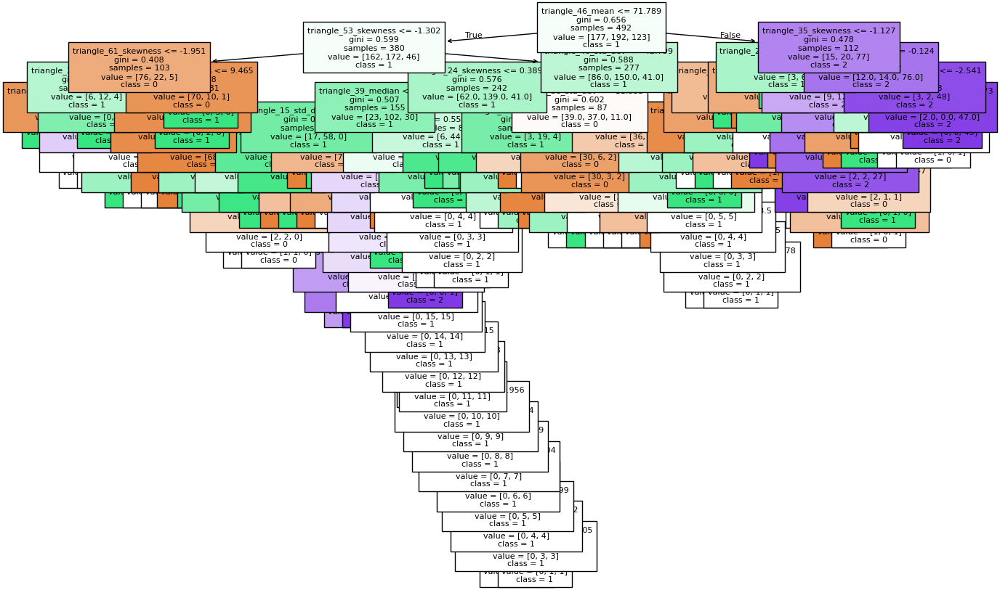

In [47]:

from sklearn.tree import DecisionTreeClassifier, plot_tree



# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
dt = DecisionTreeClassifier(
    criterion="gini",   # or "entropy"
    max_depth=None,     # you can tune this (e.g., 5, 10) to prevent overfitting
    random_state=42
)
dt.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = dt.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Decision Tree Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, dt.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 10. Plot the Tree (small datasets only, large trees may look messy) ---
plt.figure(figsize=(16,10))
plot_tree(dt, filled=True, feature_names=df.drop("label", axis=1).columns,
          class_names=[str(c) for c in np.unique(y)], fontsize=8)
plt.show()

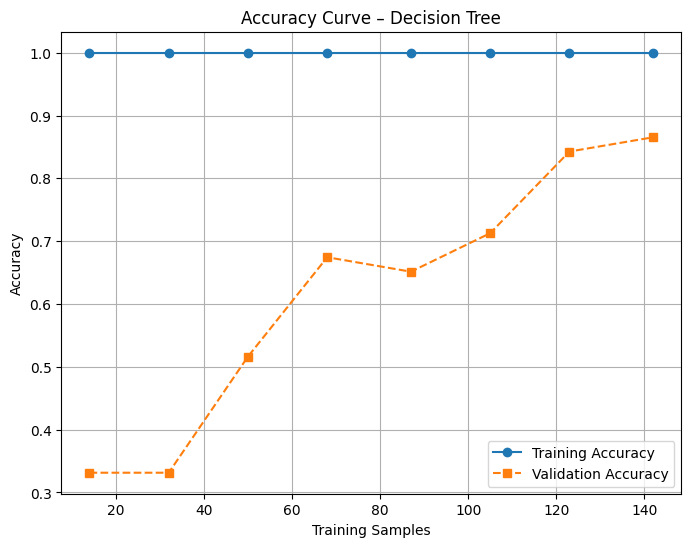

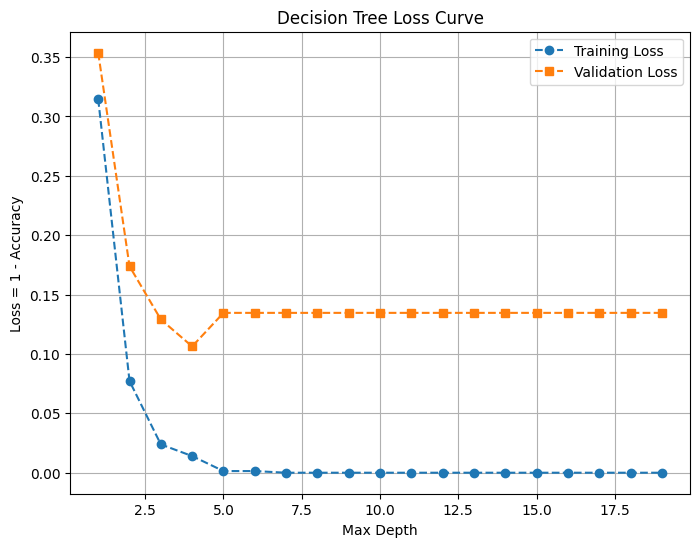

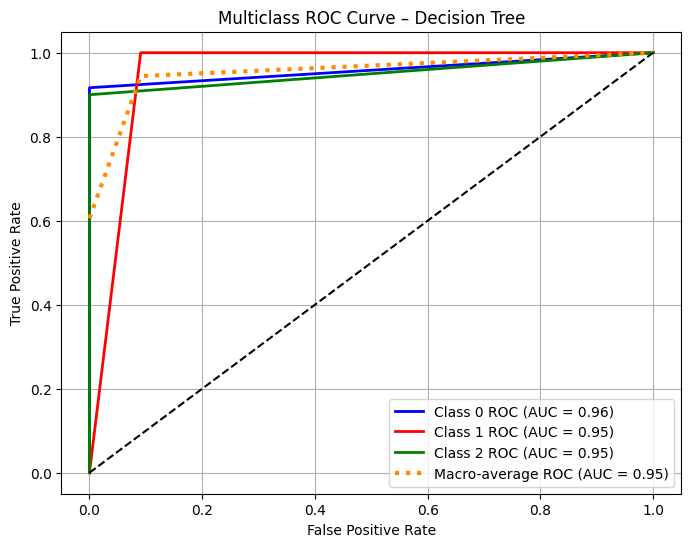

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_dt(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = DecisionTreeClassifier(
        criterion="gini",
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Decision Tree")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_dt(X_train, X_test, y_train, y_test)

## Gradient Boosting 80

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


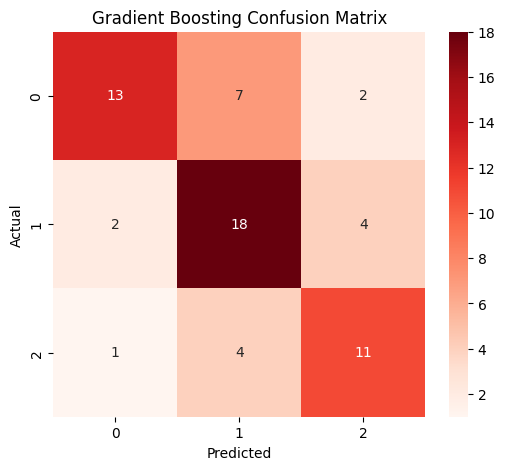


Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.59      0.68        22
           1       0.62      0.75      0.68        24
           2       0.65      0.69      0.67        16

    accuracy                           0.68        62
   macro avg       0.69      0.68      0.68        62
weighted avg       0.70      0.68      0.68        62

Training Accuracy: 0.8483754512635379
Test Accuracy: 0.6774193548387096


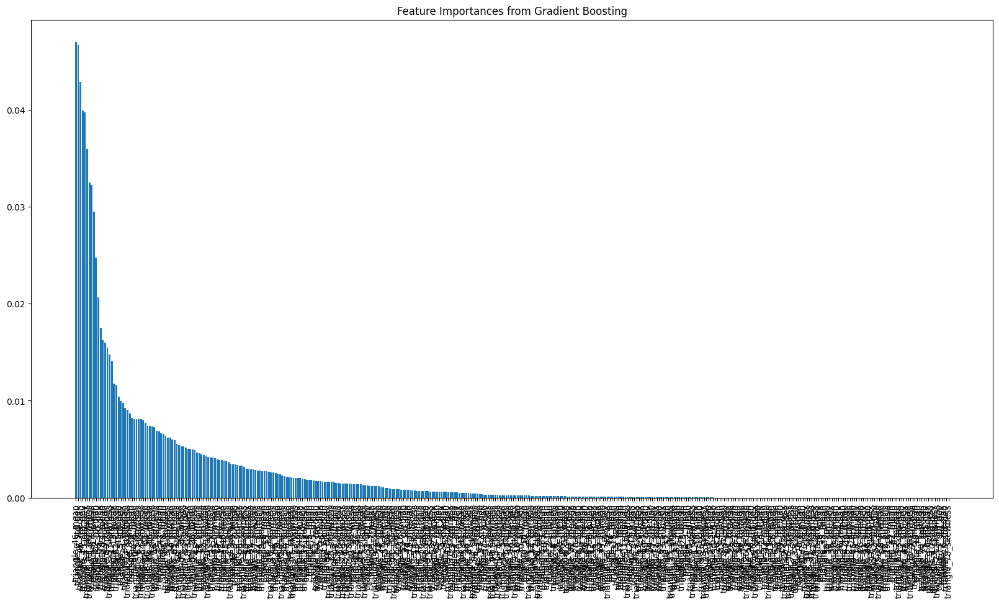

In [ ]:

from sklearn.ensemble import GradientBoostingClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- 4. Gradient Boosting Classifier ---
gb = GradientBoostingClassifier(
    n_estimators=200,     # number of trees
    learning_rate=0.01,    # step size shrinkage
    max_depth=3,          # depth of each tree
    random_state=42
)

gb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 9. Feature Importance ---
plt.figure(figsize=(20,10))
importances = gb.feature_importances_
indices = np.argsort(importances)[::-1]
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), df.drop("label", axis=1).columns[indices], rotation=90)
plt.title("Feature Importances from Gradient Boosting")
plt.show()


/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
10 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sayan/miniconda3/envs/pytor

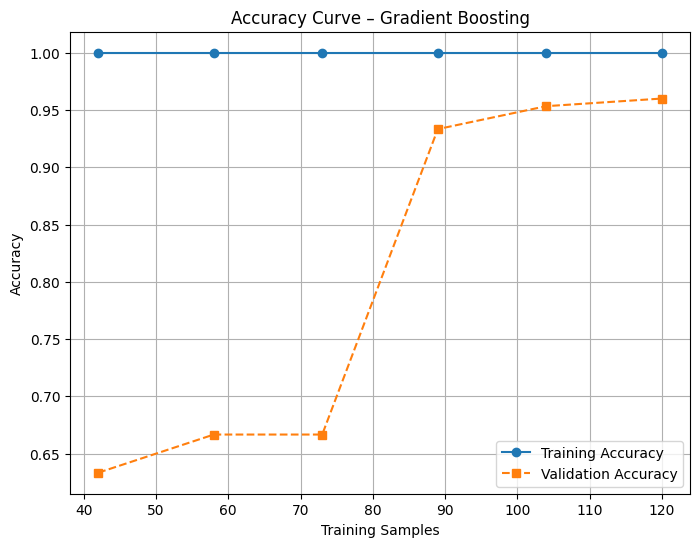

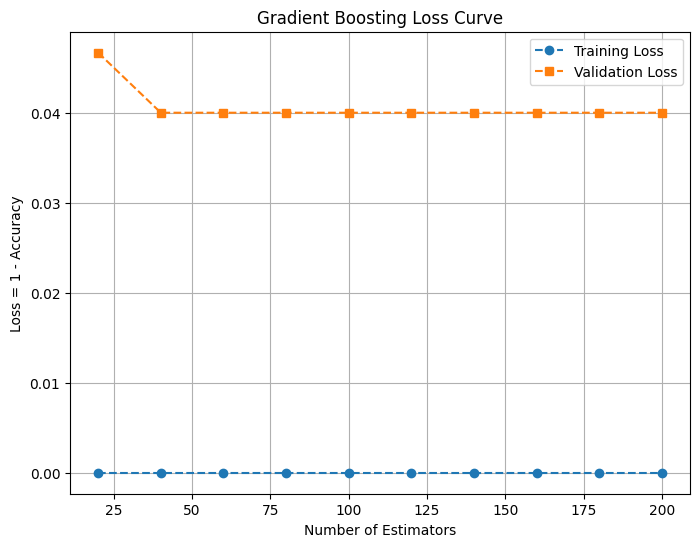

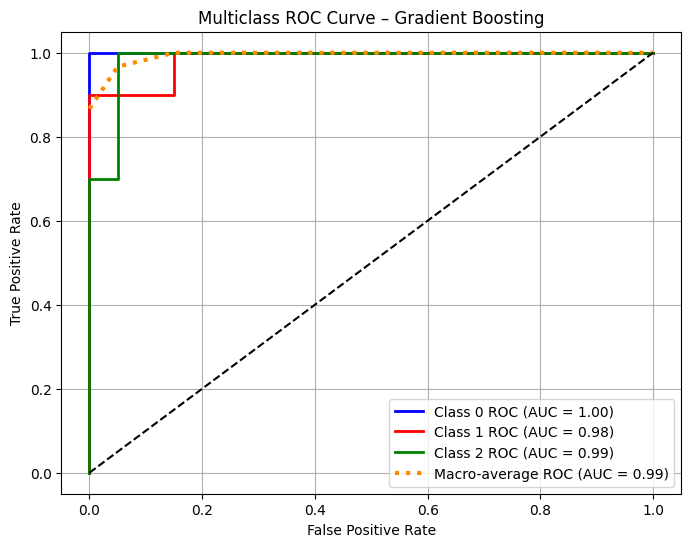

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_gb(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GradientBoostingClassifier(
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gradient Boosting")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_gb(X_train, X_test, y_train, y_test)


## Gausian Naive Bayes 80

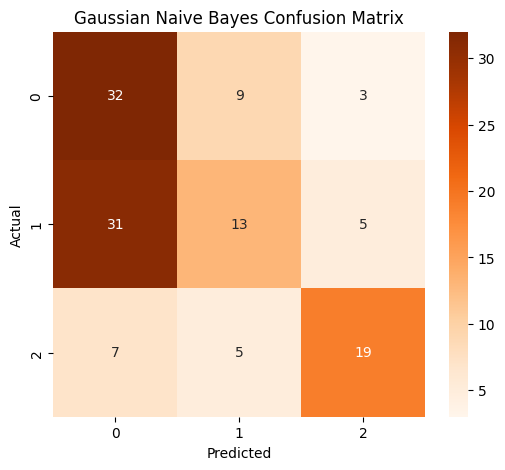


Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.73      0.56        44
           1       0.48      0.27      0.34        49
           2       0.70      0.61      0.66        31

    accuracy                           0.52       124
   macro avg       0.55      0.54      0.52       124
weighted avg       0.53      0.52      0.50       124

Training Accuracy: 0.6260162601626016
Test Accuracy: 0.5161290322580645


In [45]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- 4. Gaussian Naive Bayes Model ---
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gnb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gaussian Naive Bayes Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gnb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))


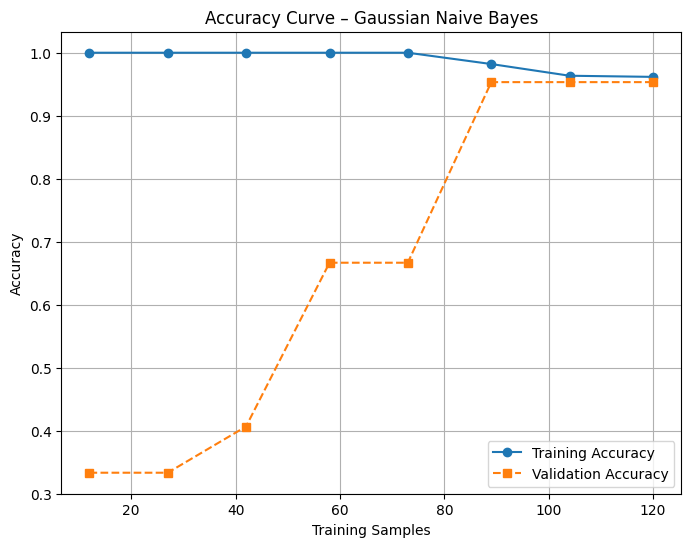

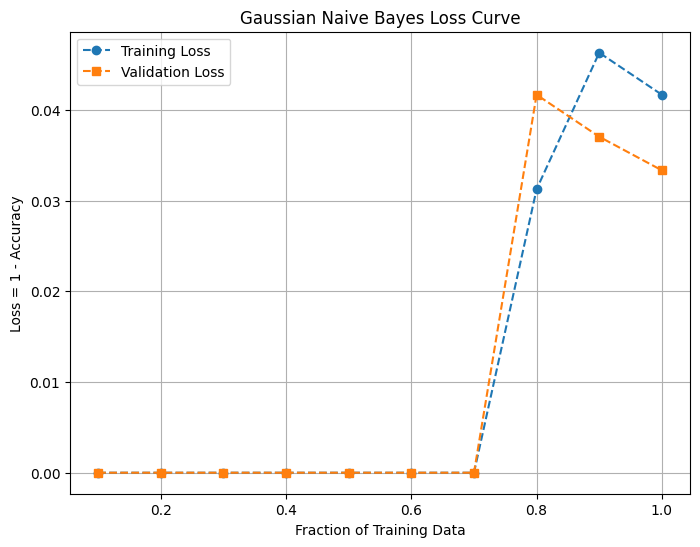

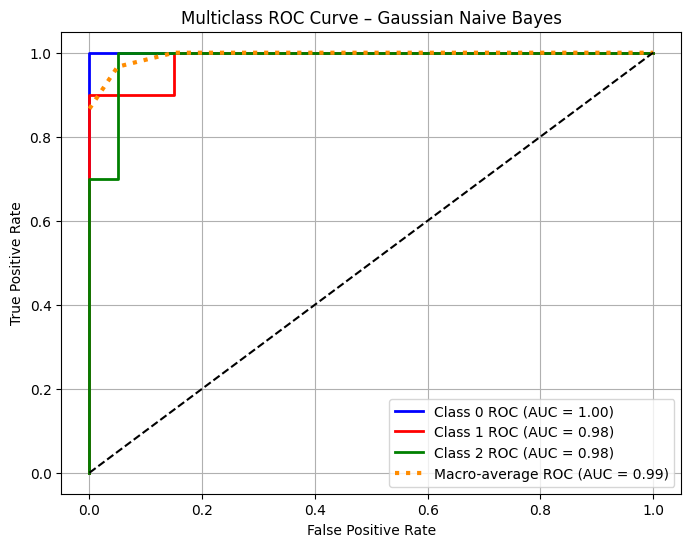

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_nb(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GaussianNB()
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gaussian Naive Bayes")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_nb(X_train, X_test, y_train, y_test)


## Machine Learning 90/10

In [6]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

In [7]:
from sklearn.preprocessing import StandardScaler

# Create the scaler object
scaler = StandardScaler()

# Fit only on training data, then transform it
X_train = scaler.fit_transform(X_train)

# Use the same scaler (already fitted) to transform test data
X_test = scaler.transform(X_test)

## SVM - kernel = linear-90

In [92]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
# Import RandomizedSearchCV and relevant distribution tool
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
# Optional: for continuous distribution sampling
from scipy.stats import loguniform 

# =============================================================
# 🚨 Data Setup (Matching your 615 total samples and 90/10 split)
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 78
TEST_SIZE = 0.10  

# Synthesize data (Replace this with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)

print(f"Data split. Training Size: {len(X_train)}, Test Size: {len(X_test)}")
# =============================================================


# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(random_state=42))
])

# -----------------------------
# 2. Define parameter distribution (for Linear Kernel)
#    We use lists here, but RandomizedSearchCV samples them randomly.
# -----------------------------
param_dist = {
    # Testing a wider range for C
    "svc__C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100], 
    "svc__kernel": ["linear"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run RandomizedSearchCV
# -----------------------------
# n_iter=30 means training 30 combinations * 5 folds = 150 total fits.
# This is much faster than running 120-600 total fits with full GridSearch.

random_search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist, # Use param_distributions                   # 💡 FIX 1: Only check 30 random combinations
    scoring="f1_macro",
    cv=5,
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Use X_train/y_train for fitting
random_search.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("\n" + "="*50)
print("✅ Best Parameters (Randomized Search):", random_search.best_params_)
print(f"✅ Best Macro F1 Score (Validation CV): {random_search.best_score_:.4f}")
print("="*50)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report (Test Set):\n", classification_report(y_test, y_pred, zero_division=0))
print("\nConfusion Matrix (Test Set):\n", confusion_matrix(y_test, y_pred))

Data split. Training Size: 553, Test Size: 62
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.2s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.1s
[CV] END svc__C=0.01, svc__class_weight=None, sv

In [93]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="linear", C=0.1, gamma=0.01, decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,0.1
,kernel,'linear'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


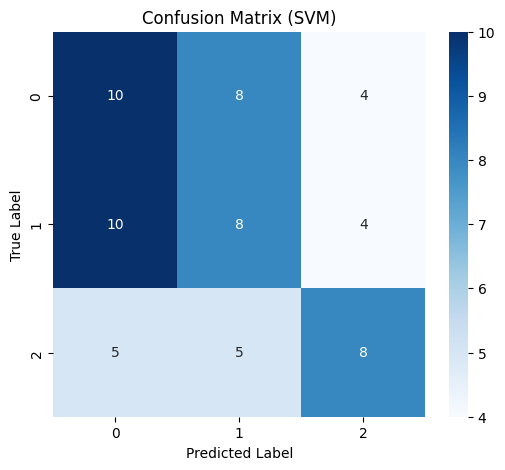


Classification Report:

              precision    recall  f1-score   support

           0       0.40      0.45      0.43        22
           1       0.38      0.36      0.37        22
           2       0.50      0.44      0.47        18

    accuracy                           0.42        62
   macro avg       0.43      0.42      0.42        62
weighted avg       0.42      0.42      0.42        62

Training Accuracy: 0.6039783001808319
Test Accuracy: 0.41935483870967744


In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
10 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sayan/miniconda3/envs/pytor

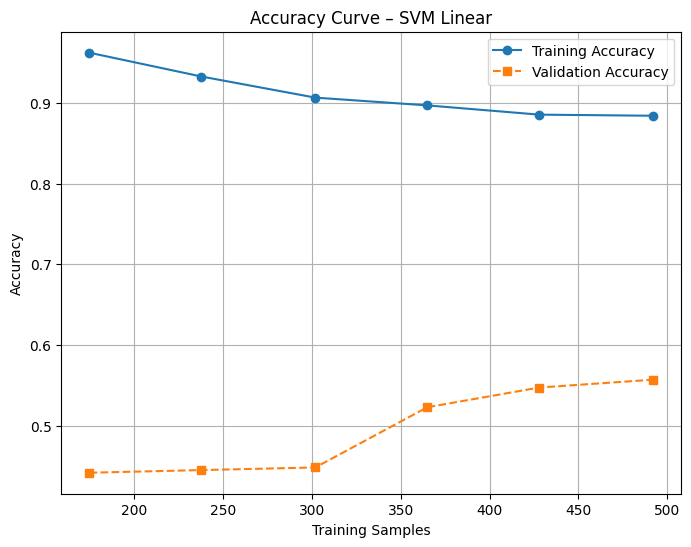

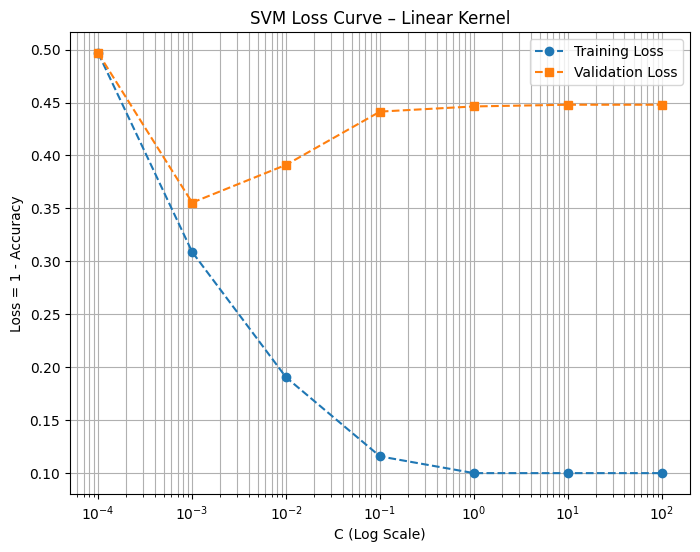

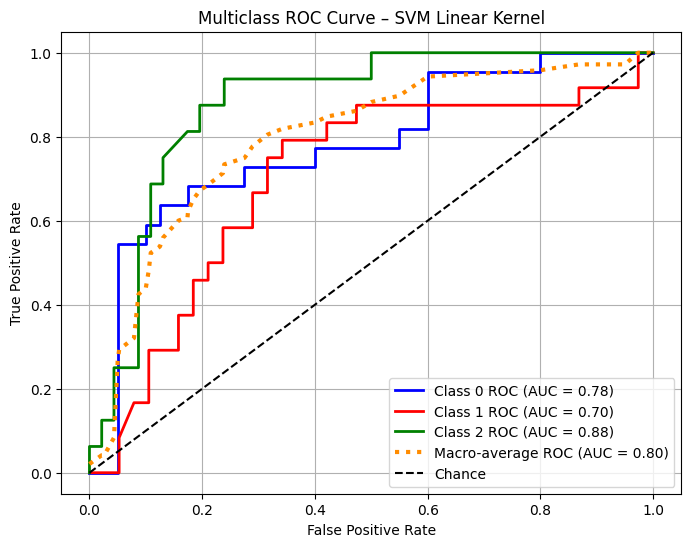

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.1):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = SVC(
        kernel="linear",
        C=C,
        probability=True
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])
    
    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})", lw=3)

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – SVM Linear Kernel")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.01)

## SVM - kernal = sigmoid 90

In [9]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with sigmoid
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["sigmoid"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.189 total time=   0.3s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.189 total time=   0.3s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.186 total time=   0.4s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=sigmoid;, score=0.189 total time=   0.3s
[CV 5/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.187 total time=   0.4s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.186 total time=   0.4s
[CV 5/5] EN

In [10]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="sigmoid", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,1
,kernel,'sigmoid'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


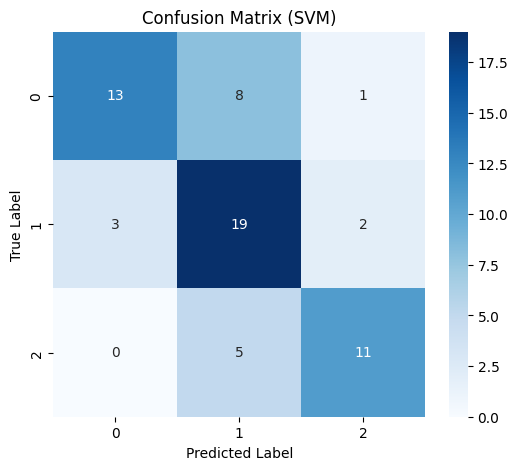


Classification Report:

              precision    recall  f1-score   support

           0       0.81      0.59      0.68        22
           1       0.59      0.79      0.68        24
           2       0.79      0.69      0.73        16

    accuracy                           0.69        62
   macro avg       0.73      0.69      0.70        62
weighted avg       0.72      0.69      0.69        62

Training Accuracy: 0.6985559566787004
Test Accuracy: 0.6935483870967742


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


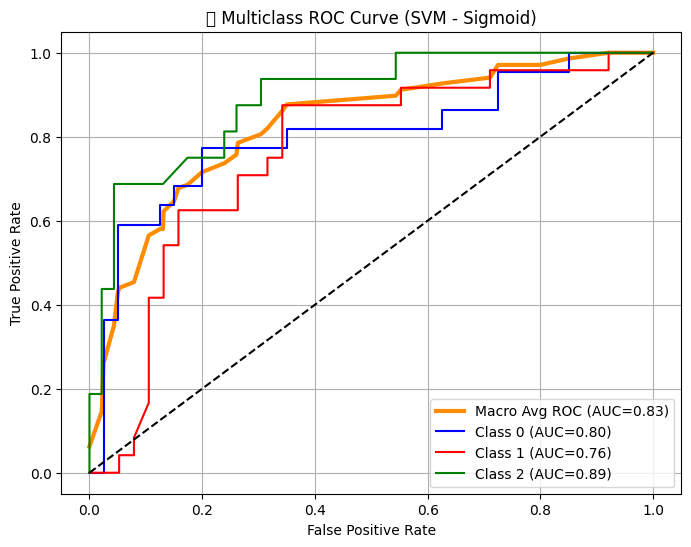

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


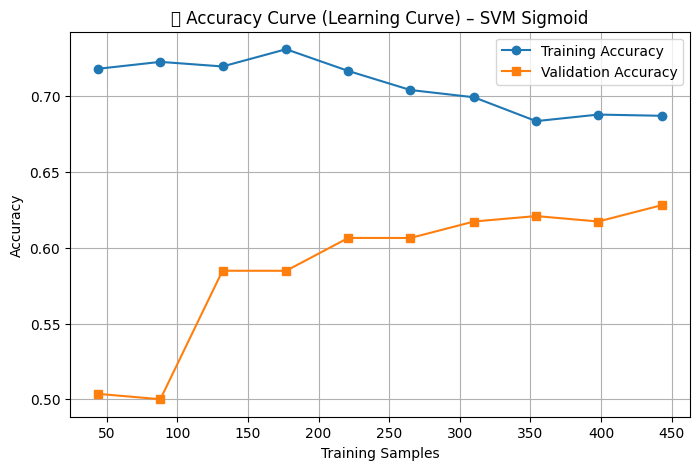

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


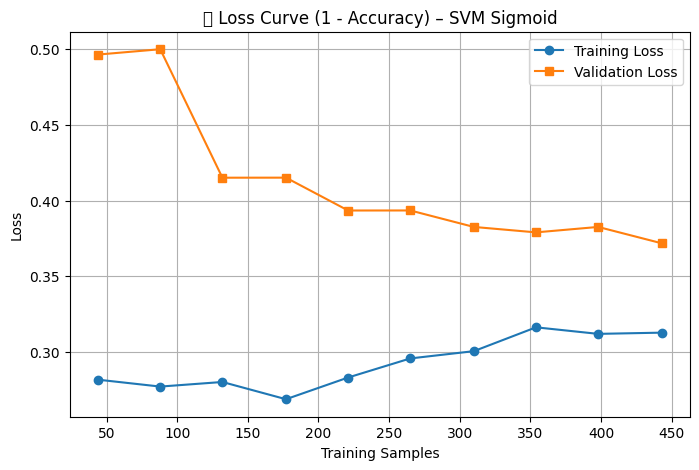

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# -----------------------------------------
# 1️⃣  MULTICLASS ROC CURVE  (ONE-VS-REST)
# -----------------------------------------

# SVM must be refitted with probability=True for ROC
svm_prob = SVC(
    kernel="sigmoid",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for OVR ROC curve
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# -------- Plot ROC -------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         label=f"Macro Avg ROC (AUC={roc_auc['macro']:.2f})", linewidth=3)

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM - Sigmoid)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


## SVM - kernal = polynomial

In [13]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["poly"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.564 total time=   0.2s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.530 total time=   0.2s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.572 total time=   0.2s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.636 total time=   0.2s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=poly;, score=0.568 total time=   0.2s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.568 total time=   0.3s
[CV 2/5] END svc__C=0.01, svc__class_

[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.518 total time=   0.4s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=poly;, score=0.530 total time=   0.2s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=poly;, score=0.511 total time=   0.2s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=scale, svc__kernel=poly;, score=0.189 total time=   0.2s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=scale, svc__kernel=poly;, score=0.215 total time=   0.2s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.508 total time=   0.5s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1

In [14]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="poly", C=0.1, gamma=0.01, decision_function_shape="ovo",random_state = 42,class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,0.1
,kernel,'poly'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


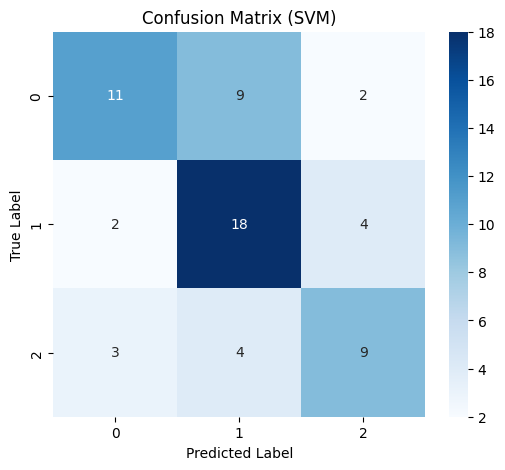


Classification Report:

              precision    recall  f1-score   support

           0       0.69      0.50      0.58        22
           1       0.58      0.75      0.65        24
           2       0.60      0.56      0.58        16

    accuracy                           0.61        62
   macro avg       0.62      0.60      0.60        62
weighted avg       0.62      0.61      0.61        62

Training Accuracy: 0.8610108303249098
Test Accuracy: 0.6129032258064516


In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


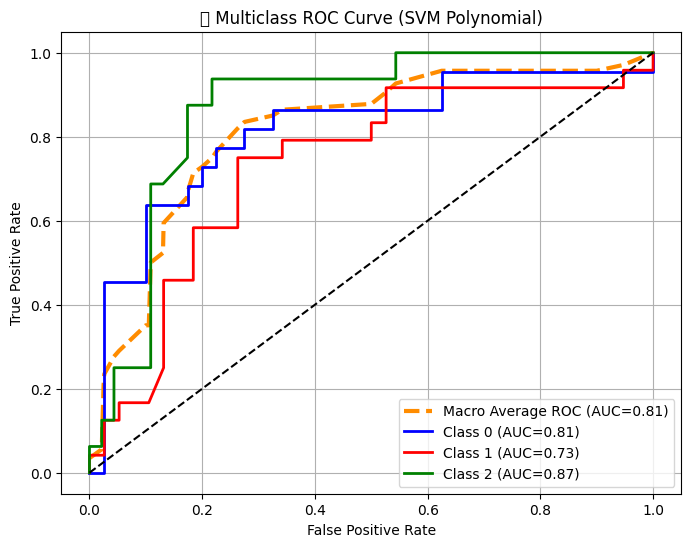

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


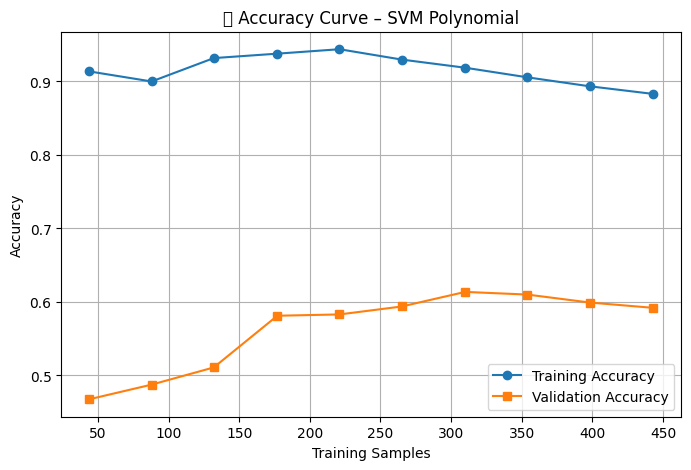

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


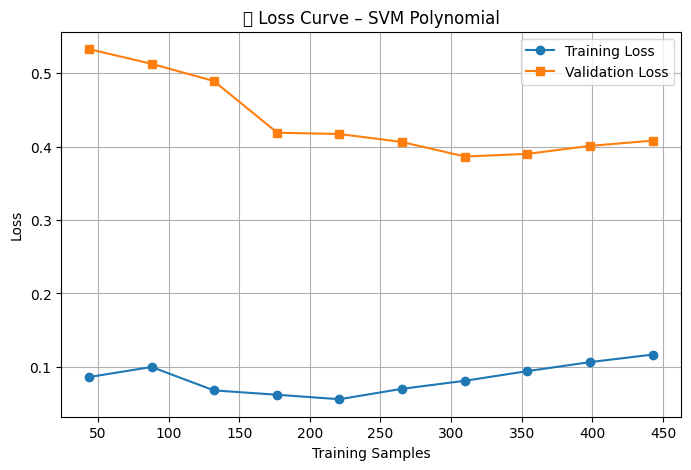

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (ONE-VS-REST)
# ============================================================

# SVM must be trained with probability=True for ROC
svm_prob = SVC(
    kernel="poly",
    C=0.1,
    gamma=0.01,
    decision_function_shape="ovo",
    probability=True,
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize test labels
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

# Store ROC curves
fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# ------------ Plot ROC --------------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         linewidth=3, linestyle='--',
         label=f"Macro Average ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM Polynomial)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

## SVM - kernal = rbf 90

In [17]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["rbf"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.189 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.186 total time=   0.1s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.186 total time=   0.1s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.189 total time=   0.1s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.189 total time=   0.1s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.186 total time=   0.1s
[CV 4/5] END svc__C=0.01, svc__class_weight=N

In [18]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="rbf", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,1
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


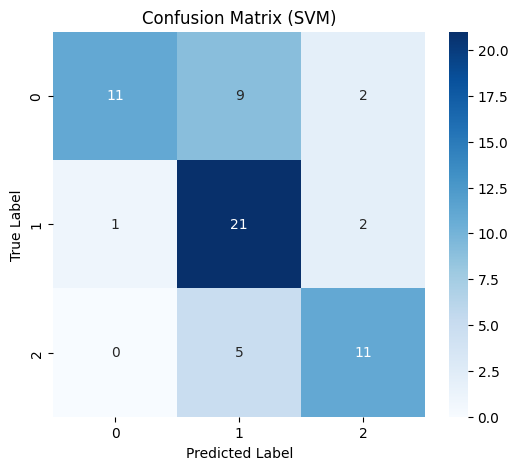


Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.50      0.65        22
           1       0.60      0.88      0.71        24
           2       0.73      0.69      0.71        16

    accuracy                           0.69        62
   macro avg       0.75      0.69      0.69        62
weighted avg       0.75      0.69      0.69        62

Training Accuracy: 0.759927797833935
Test Accuracy: 0.6935483870967742


In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


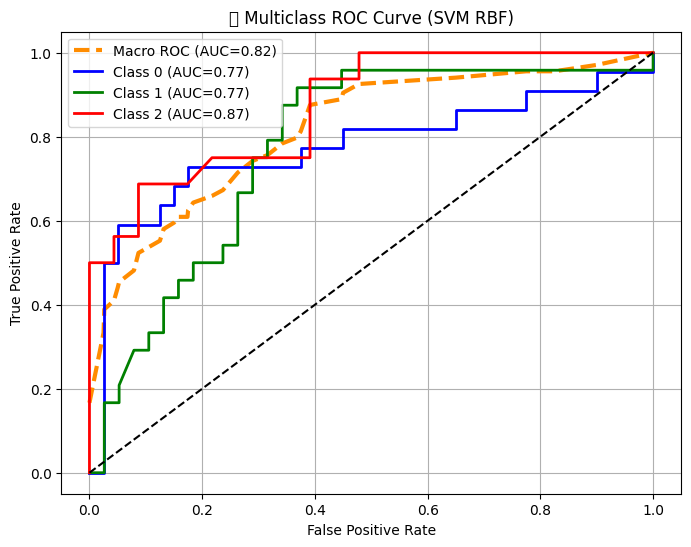

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


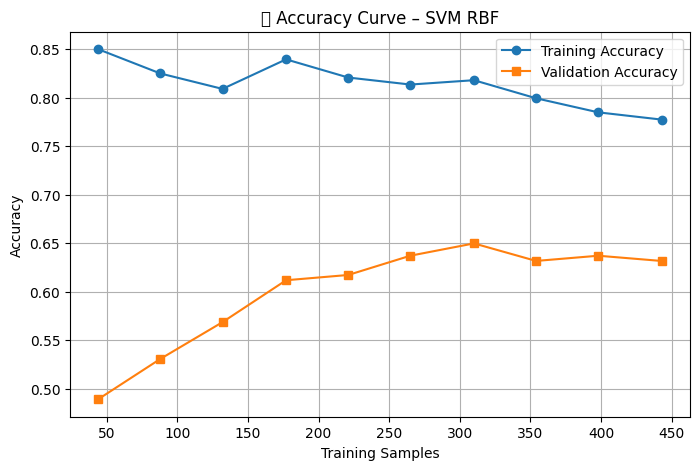

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


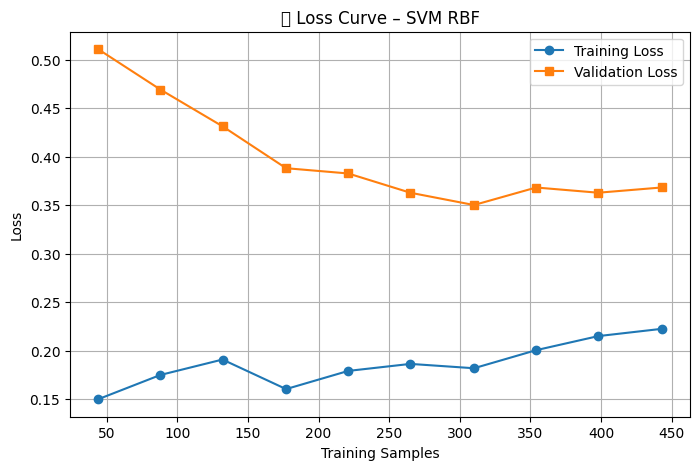

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (SVM must use probability=True)
# ============================================================

svm_prob = SVC(
    kernel="rbf",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,    # Required for ROC Curve
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for One-vs-Rest ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange', linewidth=3,
         linestyle='--', label=f"Macro ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'green', 'red']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("🔵 Multiclass ROC Curve (SVM RBF)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


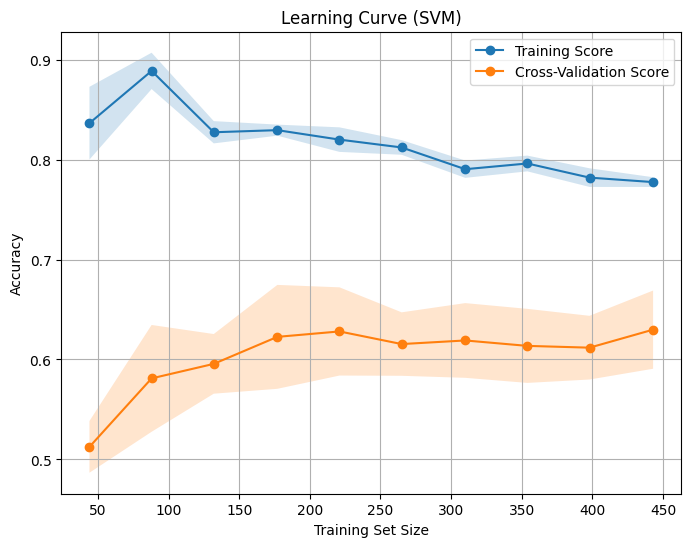

In [64]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

train_sizes, train_scores, test_scores = learning_curve(
    svm_model, X_train, y_train,
    cv=5, train_sizes=np.linspace(0.1, 1.0, 10),
    scoring="accuracy", n_jobs=-1
)

# Mean ± std
train_mean = np.mean(train_scores, axis=1)
train_std  = np.std(train_scores, axis=1)
test_mean  = np.mean(test_scores, axis=1)
test_std   = np.std(test_scores, axis=1)

# Plot
plt.figure(figsize=(8,6))
plt.plot(train_sizes, train_mean, 'o-', label="Training Score")
plt.plot(train_sizes, test_mean, 'o-', label="Cross-Validation Score")
plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2)
plt.fill_between(train_sizes, test_mean-test_std, test_mean+test_std, alpha=0.2)

plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve (SVM)")
plt.legend()
plt.grid(True)
plt.show()

## KNeighborsClassifier 90

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [100]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# --- Load your data ---
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y = df["label"].values

# Replace NaNs
X[np.isnan(X)] = 0

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# --- Build a pipeline (scaler + KNN) ---
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# --- Define parameter grid ---
param_grid = {
    "knn__n_neighbors": [1, 3, 5, 7, 9, 11, 15],
    "knn__weights": ["uniform", "distance"],
    "knn__p": [1, 2],  # Manhattan vs Euclidean
    "knn__metric": ["minkowski"]
}

# --- Grid Search ---
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(X_train, y_train)

# --- Results ---
print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)

# Evaluate on test
test_accuracy = grid.score(X_test, y_test)
print("Test accuracy:", test_accuracy)


Best parameters: {'knn__metric': 'minkowski', 'knn__n_neighbors': 11, 'knn__p': 1, 'knn__weights': 'uniform'}
Best CV accuracy: 0.6263718263718264
Test accuracy: 0.6612903225806451


In [101]:
knn = KNeighborsClassifier(n_neighbors=11, metric="minkowski", p=1,weights="uniform")  # Euclidean distance
knn.fit(X_train, y_train)

,n_neighbors,11
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [102]:
y_pred = knn.predict(X_test)

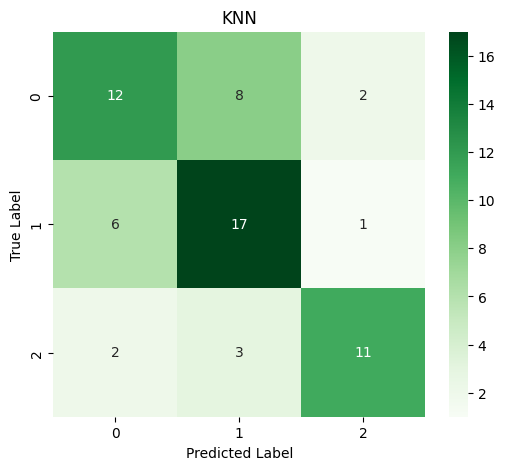


Classification Report:

              precision    recall  f1-score   support

           0       0.60      0.55      0.57        22
           1       0.61      0.71      0.65        24
           2       0.79      0.69      0.73        16

    accuracy                           0.65        62
   macro avg       0.66      0.65      0.65        62
weighted avg       0.65      0.65      0.65        62

Training Accuracy: 0.6389891696750902
Test Accuracy: 0.6451612903225806


In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = knn.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("KNN")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, knn.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

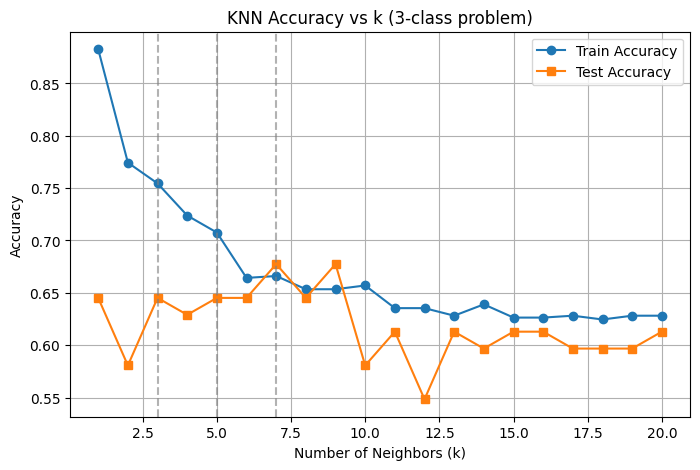

In [105]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_acc = []
test_acc = []
k_values = range(1, 21)  # test k=1 to 20

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_acc.append(accuracy_score(y_train, knn.predict(X_train)))
    test_acc.append(accuracy_score(y_test, knn.predict(X_test)))

# --- Plot ---
plt.figure(figsize=(8,5))
plt.plot(k_values, train_acc, marker='o', label="Train Accuracy")
plt.plot(k_values, test_acc, marker='s', label="Test Accuracy")
plt.axvline(x=3, color="gray", linestyle="--", alpha=0.6)  # mark k=3
plt.axvline(x=5, color="gray", linestyle="--", alpha=0.6)  # mark k=5
plt.axvline(x=7, color="gray", linestyle="--", alpha=0.6)  # mark k=7
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN Accuracy vs k (3-class problem)")
plt.legend()
plt.grid(True)
plt.show()


In [106]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

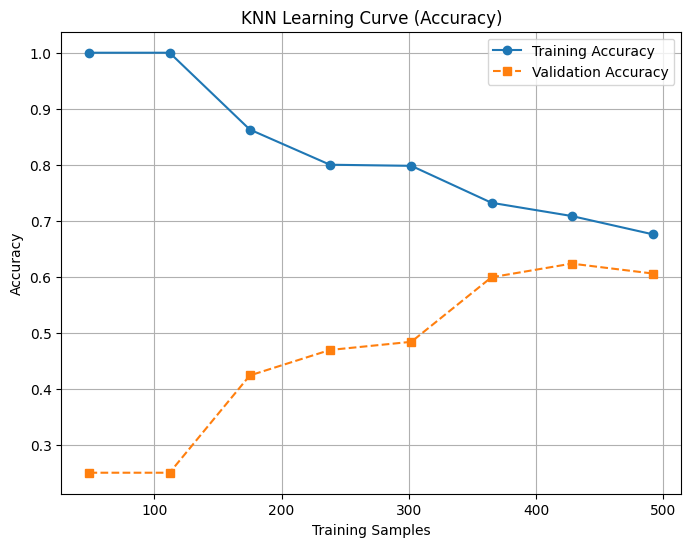

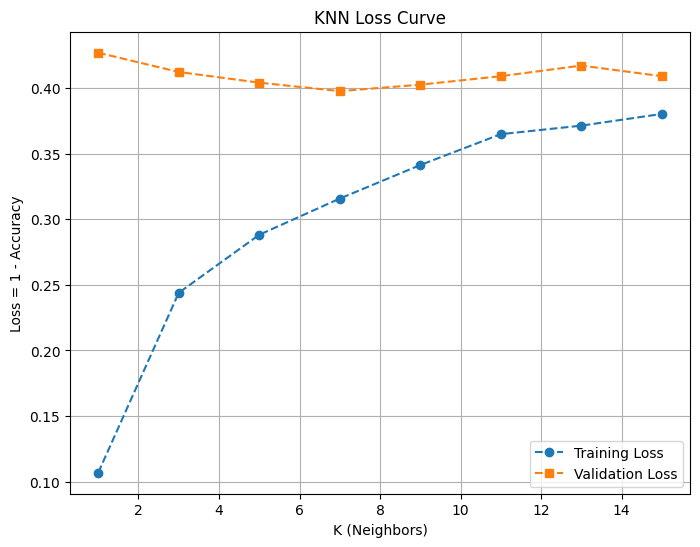

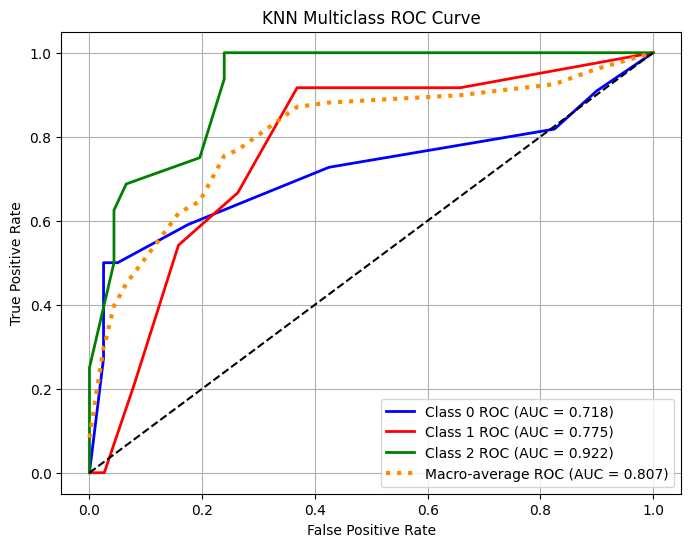

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle
# ==========================================================
# 📌 3. KNN MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_knn_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=9,
            weights="uniform",
            metric="minkowski",
            p=1
        ))
    ])

    knn_model.fit(X_train, y_train)
    y_score = knn_model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("KNN Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL KNN PLOTS
# ==========================================================

plot_knn_accuracy_curve(X, y)
plot_knn_loss_curve(X, y)
plot_knn_multiclass_roc(X_train, X_test, y_train, y_test)


## RandomForest 90

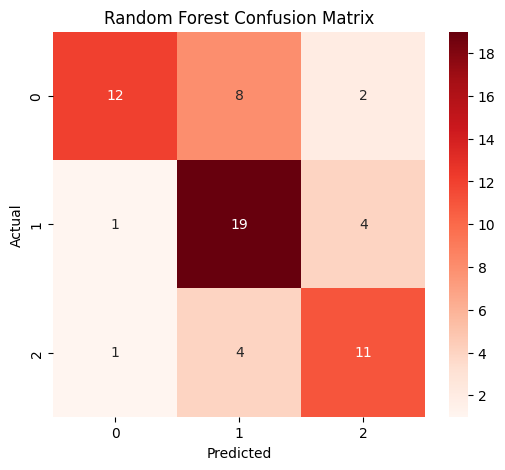


Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.55      0.67        22
           1       0.61      0.79      0.69        24
           2       0.65      0.69      0.67        16

    accuracy                           0.68        62
   macro avg       0.71      0.67      0.67        62
weighted avg       0.71      0.68      0.68        62

Training Accuracy: 0.8844765342960289
Test Accuracy: 0.6774193548387096


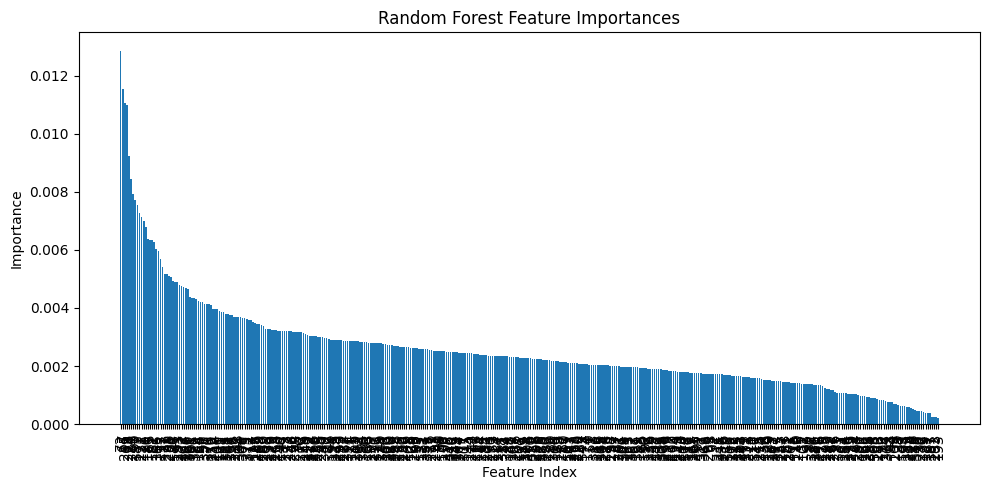

In [30]:
from sklearn.ensemble import RandomForestClassifier

# --- 5. Train Random Forest ---
rf = RandomForestClassifier(
    n_estimators=200,    # number of trees
    max_depth=None,      # let trees expand fully
    random_state=42,
    n_jobs=-1            # use all CPU cores
)
rf.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = rf.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, rf.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))
# --- 9. Feature Importance Plot ---
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10,5))
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), indices, rotation=90)
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

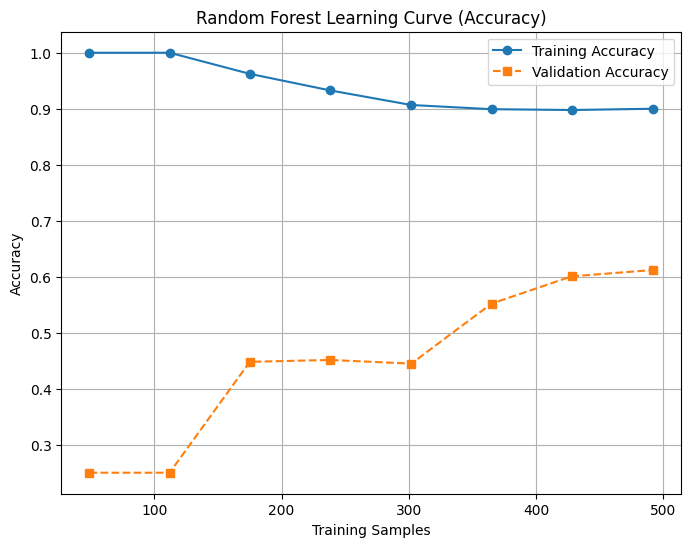

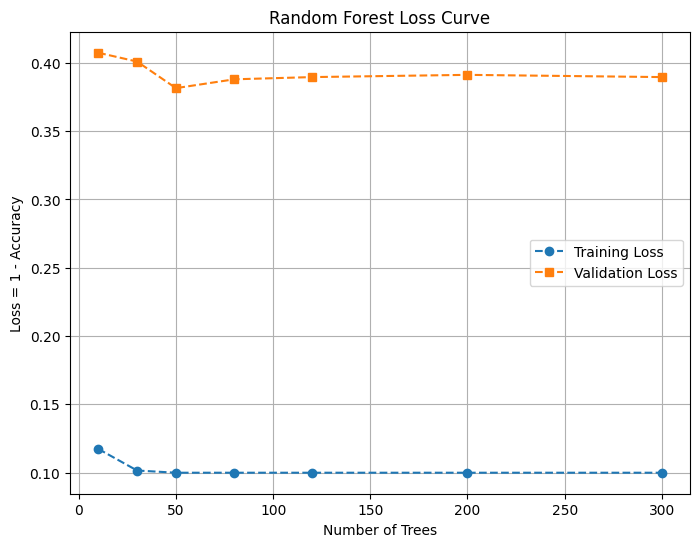

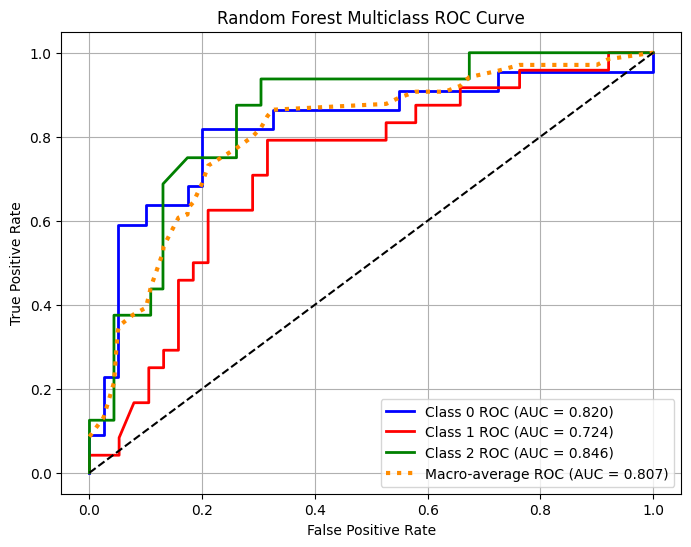

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. RANDOM FOREST ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_rf_accuracy_curve(X, y):
    rf_model = RandomForestClassifier(
        n_estimators=200,
        max_depth=None,
        random_state=42
    )

    train_sizes, train_scores, val_scores = learning_curve(
        rf_model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title("Random Forest Learning Curve (Accuracy)")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 2. RANDOM FOREST LOSS CURVE (1 – accuracy vs trees)
# ==========================================================
def plot_rf_loss_curve(X, y):
    n_estimators_list = [10, 30, 50, 80, 120, 200, 300]

    param_grid = {
        "n_estimators": n_estimators_list
    }

    rf_model = RandomForestClassifier(random_state=42)

    grid = GridSearchCV(
        rf_model,
        {"n_estimators": n_estimators_list},
        cv=5,
        scoring="accuracy",
        return_train_score=True,
        n_jobs=-1
    )

    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(n_estimators_list, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_list, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Trees")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Random Forest Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 3. RANDOM FOREST MULTICLASS ROC CURVE
# ==========================================================
def plot_rf_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = RandomForestClassifier(
        n_estimators=200,
        random_state=42
    )

    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i]
        )
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot ROC
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":", lw=3,
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Random Forest Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL PLOTS
# ==========================================================

plot_rf_accuracy_curve(X, y)
plot_rf_loss_curve(X, y)
plot_rf_multiclass_roc(X_train, X_test, y_train, y_test)

## Logistic Regression

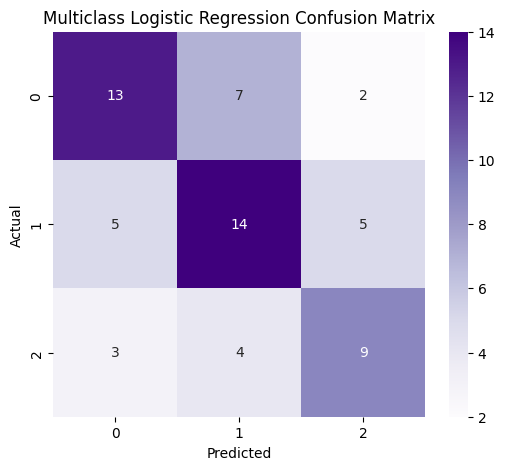


Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.59      0.60        22
           1       0.56      0.58      0.57        24
           2       0.56      0.56      0.56        16

    accuracy                           0.58        62
   macro avg       0.58      0.58      0.58        62
weighted avg       0.58      0.58      0.58        62

Training Accuracy: 0.8844765342960289
Test Accuracy: 0.5806451612903226


In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)
logreg = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        # multi_class="multinomial",
        solver="saga",
        max_iter=2000,   # allow more iterations
        random_state=42
    )
)
# --- 5. Multiclass Logistic Regression ---
#  # use softmax for multiclass     
logreg.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = logreg.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Multiclass Logistic Regression Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, logreg.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1262: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.


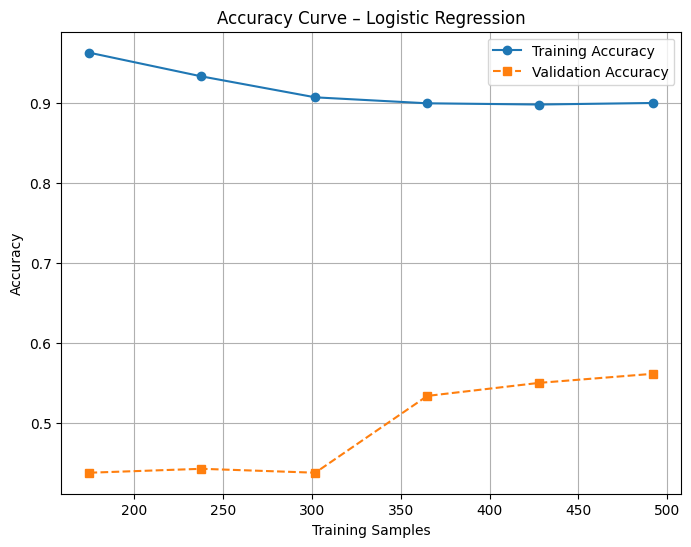

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/sit

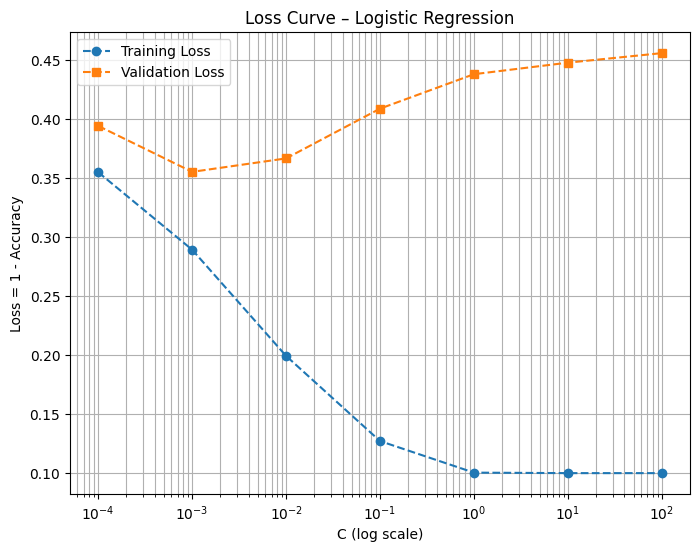

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


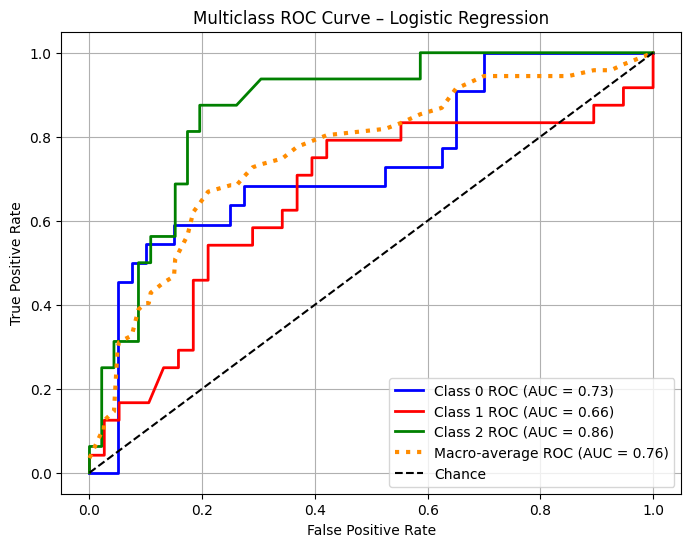

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Learning Curve – Logistic Regression"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Build Logistic Regression pipeline
logreg_model = Pipeline([
    ("scaler", StandardScaler()),
    ("lr", LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        max_iter=2000
    ))
])

plot_accuracy_curve(logreg_model, X, y, "Accuracy Curve – Logistic Regression")



# ==========================================================
# 📌 2. LOSS CURVE (Validation Error vs C)
# ==========================================================

def plot_lr_loss_curve(X, y):
    C_range = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("lr", LogisticRegression(
            solver="lbfgs",
            multi_class="multinomial",
            max_iter=2000
        ))
    ])

    param_grid = {"lr__C": C_range}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]
    
    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.semilogx(C_range, train_loss, "--o", label="Training Loss")
    plt.semilogx(C_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("C (log scale)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Loss Curve – Logistic Regression")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()

plot_lr_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        C=C,
        max_iter=2000
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-Average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Logistic Regression")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0)

## DecisionTree

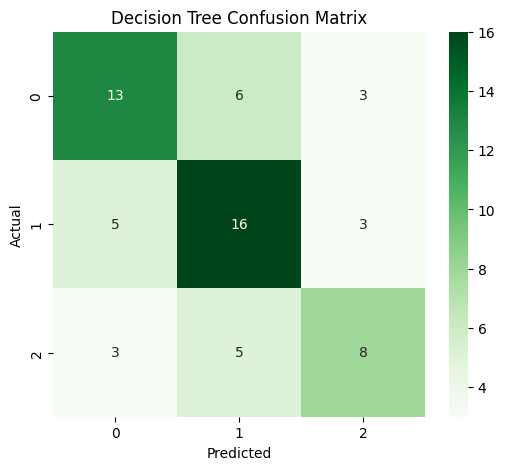


Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.59      0.60        22
           1       0.59      0.67      0.63        24
           2       0.57      0.50      0.53        16

    accuracy                           0.60        62
   macro avg       0.59      0.59      0.59        62
weighted avg       0.60      0.60      0.60        62

Training Accuracy: 0.8844765342960289
Test Accuracy: 0.5967741935483871


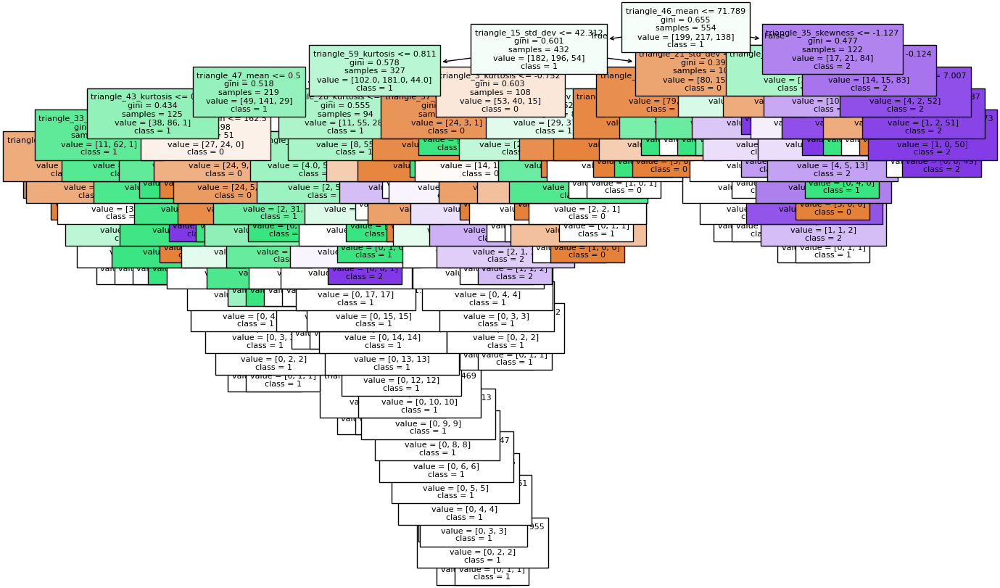

In [34]:

from sklearn.tree import DecisionTreeClassifier, plot_tree



# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)
dt = DecisionTreeClassifier(
    criterion="gini",   # or "entropy"
    max_depth=None,     # you can tune this (e.g., 5, 10) to prevent overfitting
    random_state=42
)
dt.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = dt.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Decision Tree Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, dt.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 10. Plot the Tree (small datasets only, large trees may look messy) ---
plt.figure(figsize=(16,10))
plot_tree(dt, filled=True, feature_names=df.drop("label", axis=1).columns,
          class_names=[str(c) for c in np.unique(y)], fontsize=8)
plt.show()

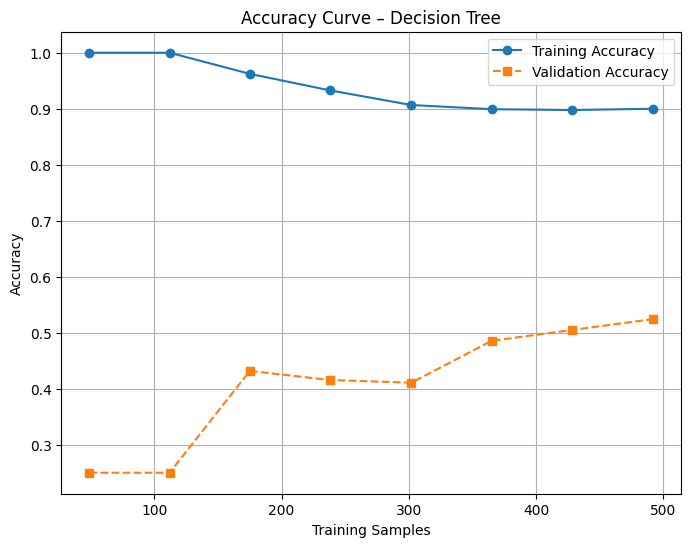

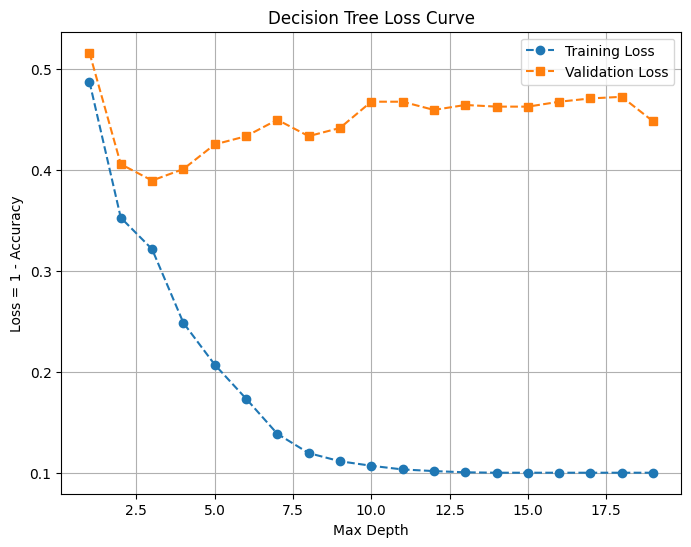

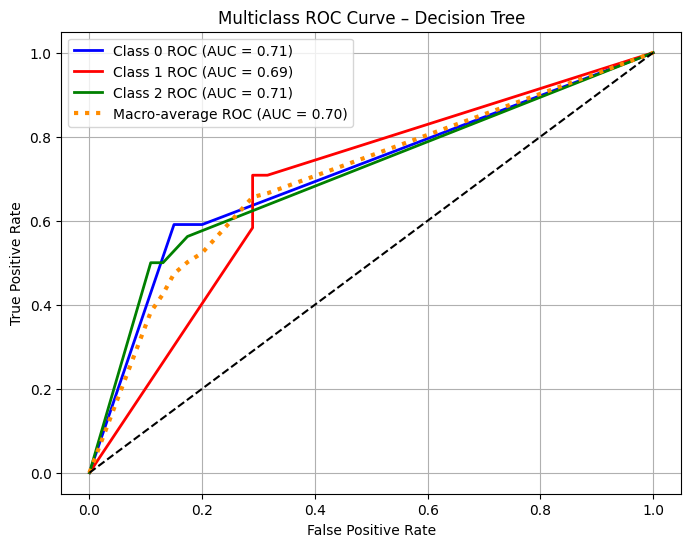

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Decision Tree"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Decision Tree model using your parameters
dt_model = DecisionTreeClassifier(
    criterion="gini",
    random_state=42
)

plot_accuracy_curve(dt_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs max_depth)
# ==========================================================

def plot_dt_loss_curve(X, y):

    depth_range = range(1, 20)

    param_grid = {"max_depth": depth_range}

    grid = GridSearchCV(
        DecisionTreeClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(depth_range, train_loss, "--o", label="Training Loss")
    plt.plot(depth_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Max Depth")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Decision Tree Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_dt_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_dt(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = DecisionTreeClassifier(
        criterion="gini",
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Decision Tree")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_dt(X_train, X_test, y_train, y_test)

## Gradient Boosting-90

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


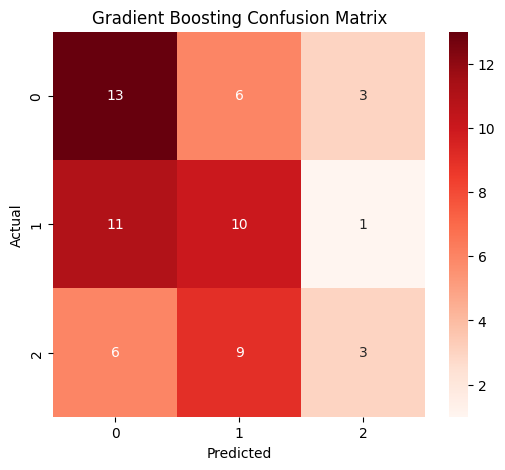


Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.59      0.50        22
           1       0.40      0.45      0.43        22
           2       0.43      0.17      0.24        18

    accuracy                           0.42        62
   macro avg       0.42      0.40      0.39        62
weighted avg       0.42      0.42      0.40        62

Training Accuracy: 0.9059674502712477
Test Accuracy: 0.41935483870967744


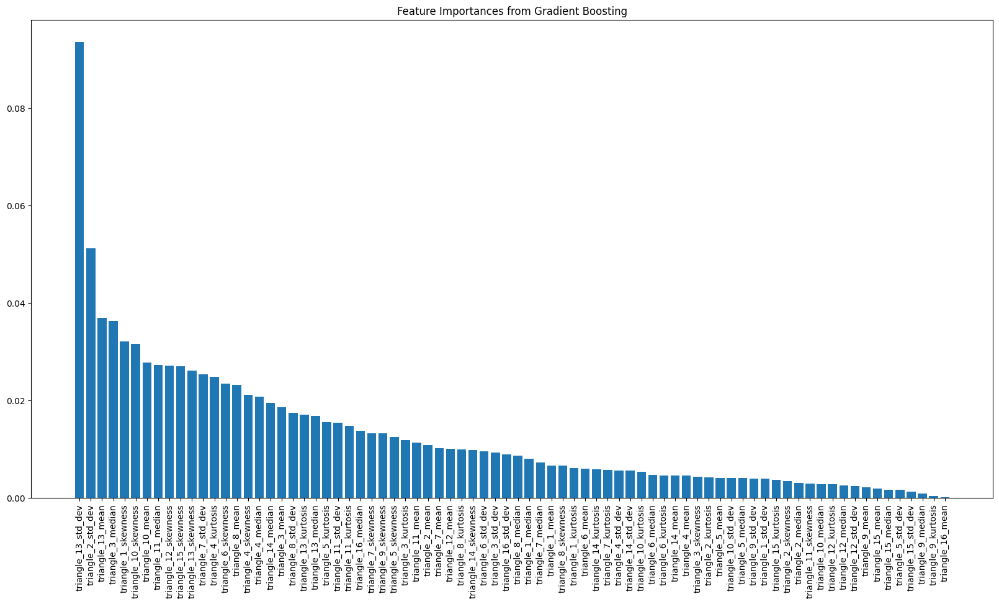

In [51]:

from sklearn.ensemble import GradientBoostingClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# --- 4. Gradient Boosting Classifier ---
gb = GradientBoostingClassifier(
    n_estimators=200,     # number of trees
    learning_rate=0.01,    # step size shrinkage
    max_depth=3,          # depth of each tree
    random_state=42
)

gb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 9. Feature Importance ---
plt.figure(figsize=(20,10))
importances = gb.feature_importances_
indices = np.argsort(importances)[::-1]
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), df.drop("label", axis=1).columns[indices], rotation=90)
plt.title("Feature Importances from Gradient Boosting")
plt.show()


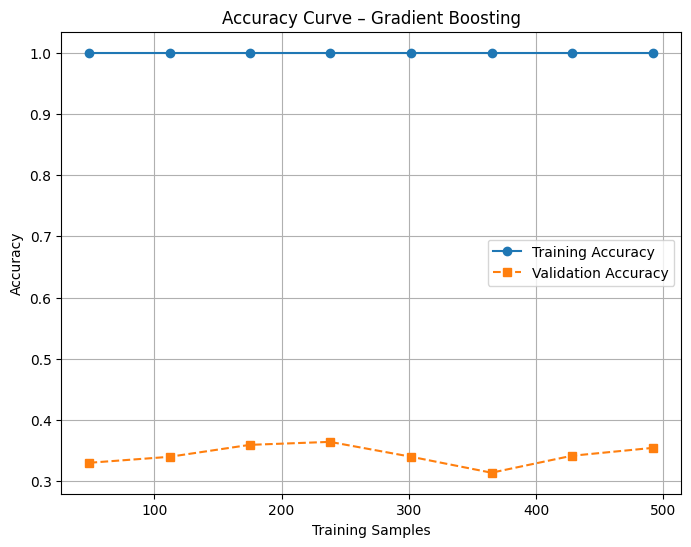

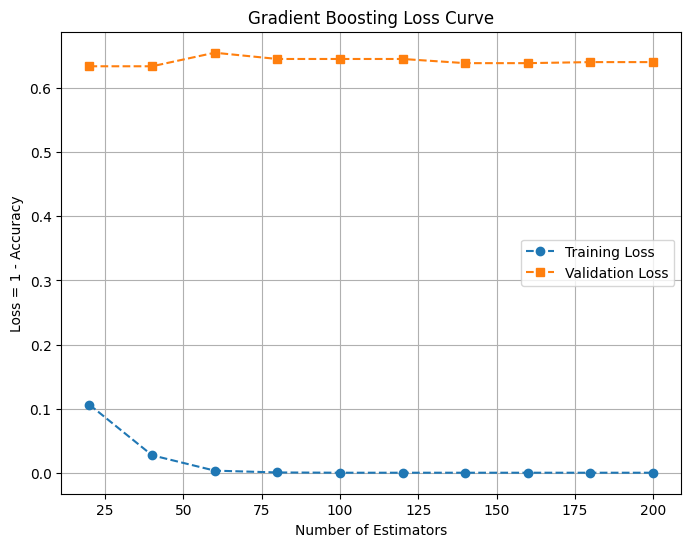

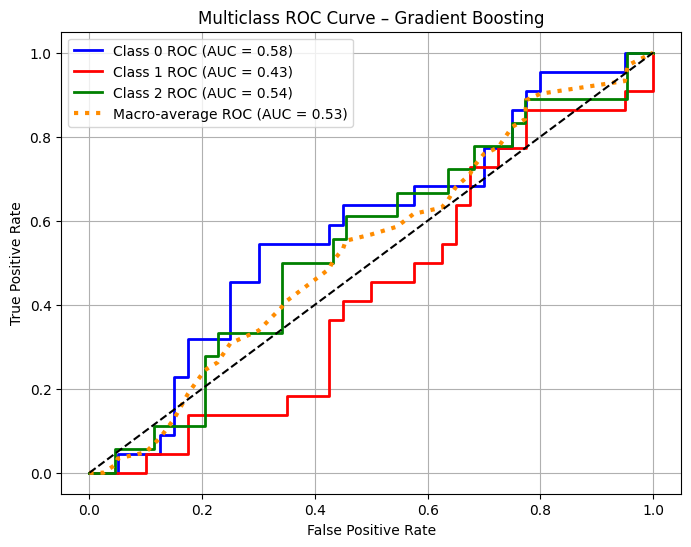

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve_gb(model, X, y, title="Accuracy Curve – Gradient Boosting"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Gradient Boosting model
gb_model = GradientBoostingClassifier(
    random_state=42
)

plot_accuracy_curve_gb(gb_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs n_estimators)
# ==========================================================

def plot_gb_loss_curve(X, y):

    est_range = range(20, 210, 20)

    param_grid = {"n_estimators": est_range}

    grid = GridSearchCV(
        GradientBoostingClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(est_range, train_loss, "--o", label="Training Loss")
    plt.plot(est_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gradient Boosting Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_gb_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_gb(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GradientBoostingClassifier(
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gradient Boosting")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_gb(X_train, X_test, y_train, y_test)


## Gausian Naive Bayes-90

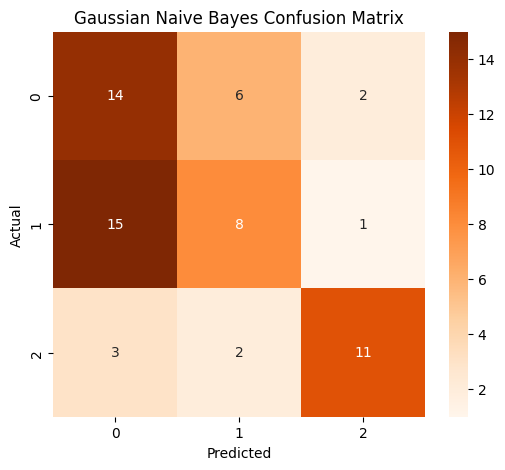


Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.64      0.52        22
           1       0.50      0.33      0.40        24
           2       0.79      0.69      0.73        16

    accuracy                           0.53        62
   macro avg       0.57      0.55      0.55        62
weighted avg       0.55      0.53      0.53        62

Training Accuracy: 0.6101083032490975
Test Accuracy: 0.532258064516129


In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# --- 4. Gaussian Naive Bayes Model ---
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gnb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gaussian Naive Bayes Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gnb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))


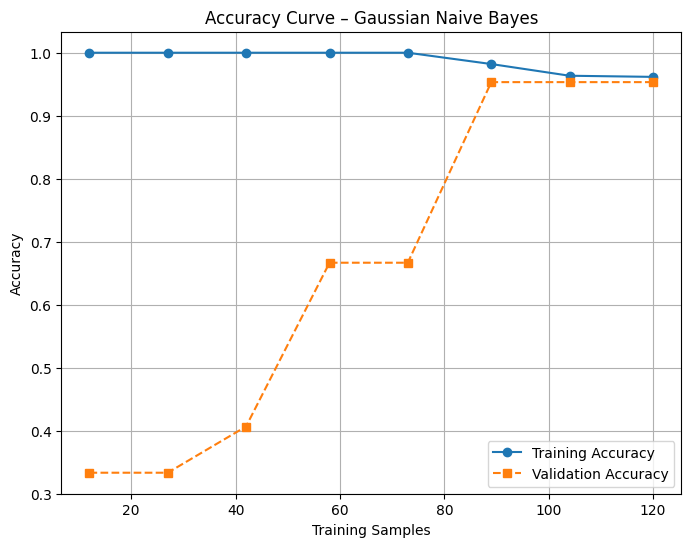

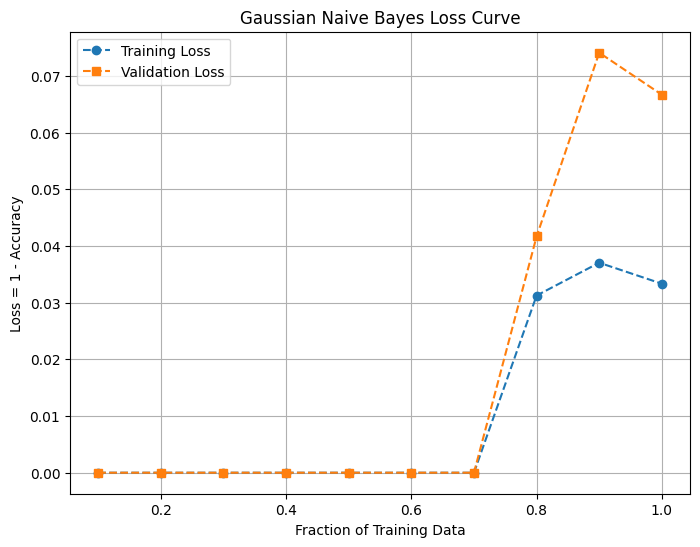

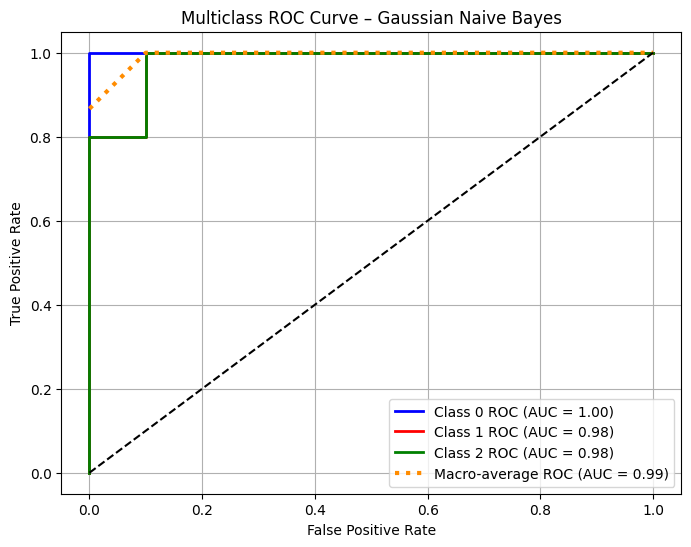

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Gaussian Naive Bayes"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


gnb_model = GaussianNB()
plot_accuracy_curve(gnb_model, X, y)

# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs Training Size)
# ==========================================================
def plot_nb_loss_curve(model, X, y):
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_loss = []
    val_loss = []

    for frac in train_sizes:
        n_samples = int(frac * X.shape[0])
        X_frac, y_frac = X[:n_samples], y[:n_samples]

        # Split for cross-validation manually
        idx = np.random.permutation(n_samples)
        split = int(0.8 * n_samples)
        X_train_cv, X_val_cv = X_frac[idx[:split]], X_frac[idx[split:]]
        y_train_cv, y_val_cv = y_frac[idx[:split]], y_frac[idx[split:]]

        model.fit(X_train_cv, y_train_cv)
        train_acc = model.score(X_train_cv, y_train_cv)
        val_acc = model.score(X_val_cv, y_val_cv)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_loss, "--o", label="Training Loss")
    plt.plot(train_sizes, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Fraction of Training Data")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gaussian Naive Bayes Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_nb_loss_curve(gnb_model, X, y)

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_nb(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GaussianNB()
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gaussian Naive Bayes")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_nb(X_train, X_test, y_train, y_test)


## XGBoost-90

In [ ]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)

# 1. Accuracy curve (fewer points)
def plot_accuracy_curve_fast(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=3,                  # fewer folds
        scoring="accuracy",
        train_sizes=np.linspace(0.2, 1.0, 5),  # fewer training sizes
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(7,5))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("XGBoost Accuracy Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_accuracy_curve_fast(xgb_model, X, y)

# 2. Loss curve (fewer n_estimators)
def plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test):
    n_estimators_range = range(10, 101, 20)  # smaller range
    train_loss = []
    val_loss = []

    for n in n_estimators_range:
        model = XGBClassifier(n_estimators=n, use_label_encoder=False,
                              eval_metric="mlogloss", random_state=42, n_jobs=-1)
        model.fit(X_train, y_train)

        train_acc = model.score(X_train, y_train)
        val_acc = model.score(X_test, y_test)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(7,5))
    plt.plot(n_estimators_range, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_range, val_loss, "--s", label="Testing Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("XGBoost Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from xgboost import XGBClassifier

# Assuming X_train, X_test, y_train, y_test are already defined

# Train the model once
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
y_score = xgb_model.predict_proba(X_test)

# Binarize the output for multiclass ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)
for cls in classes:
    mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = cycle(["blue", "red", "green"])

for cls, color in zip(classes, colors):
    plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
             label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

plt.plot(all_fpr, mean_tpr, color="darkorange", lw=3, linestyle=":",
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve – XGBoost")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from xgboost import XGBClassifier

# =============================================================
# 🚨 FIX: Data Definition and Split
# The code below ensures X_train, X_test, y_train, and y_test are defined 
# based on your 615 total samples and 90/10 split.
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 78
TEST_SIZE = 0.10  

# Synthesize data (Replace this section with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
# Assuming 3 classes (0, 1, 2)
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)
# =============================================================

# --- Define and Train the Final Model (n_estimators defaults to 100) ---
xgb_model = XGBClassifier(
    use_label_encoder=False, 
    eval_metric="mlogloss", 
    random_state=42, 
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# -------------------------------------------------------------
# 🔹 1. Evaluate on Training Set
# -------------------------------------------------------------
y_train_pred = xgb_model.predict(X_train)

print("=" * 50)
print("✅ TRAINING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_train, y_train_pred, zero_division=0))


# -------------------------------------------------------------
# 🔹 2. Evaluate on Testing Set
# -------------------------------------------------------------
y_test_pred = xgb_model.predict(X_test)

print("\n" + "=" * 50)
print("✅ TESTING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_test, y_test_pred, zero_division=0))

## CatBoost 90

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from catboost import CatBoostClassifier

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_accuracy_curve_catboost(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=3,  # fewer folds for speed
        scoring="accuracy",
        train_sizes=np.linspace(0.2, 1.0, 5),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("CatBoost Accuracy Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

cat_model = CatBoostClassifier(
    iterations=200, learning_rate=0.1, random_state=42, verbose=0
)
plot_accuracy_curve_catboost(cat_model, X, y)

# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs Iterations)
# ==========================================================
def plot_catboost_loss_curve(X_train, X_test, y_train, y_test):
    iteration_range = range(50, 201, 25)
    train_loss = []
    val_loss = []

    for iters in iteration_range:
        model = CatBoostClassifier(
            iterations=iters, learning_rate=0.1, random_state=42, verbose=0
        )
        model.fit(X_train, y_train)

        train_acc = model.score(X_train, y_train)
        val_acc = model.score(X_test, y_test)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(7, 5))
    plt.plot(iteration_range, train_loss, "--o", label="Training Loss")
    plt.plot(iteration_range, val_loss, "--s", label="Testing Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("CatBoost Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_catboost_loss_curve(X_train, X_test, y_train, y_test)

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_catboost(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = CatBoostClassifier(
        iterations=200, learning_rate=0.1, random_state=42, verbose=0
    )
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – CatBoost")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc_catboost(X_train, X_test, y_train, y_test)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support
from xgboost import XGBClassifier

# =============================================================
# 🚨 Data Definition and Split (Using 20% test size)
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 78
TEST_SIZE = 0.10  # 20% test size

# Synthesize data (Replace this section with your actual data loading if available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)
# =============================================================

# --- Define and Train the Final Model ---
xgb_model = XGBClassifier(
    use_label_encoder=False, 
    eval_metric="mlogloss", 
    random_state=42, 
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# -------------------------------------------------------------
# 🔹 1. Predictions
# -------------------------------------------------------------
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# -------------------------------------------------------------
# 🔹 2. Print Full Classification Reports (as in your original code)
# -------------------------------------------------------------
print("=" * 50)
print("✅ TRAINING SET CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(y_train, y_train_pred, zero_division=0))

print("\n" + "=" * 50)
print("✅ TESTING SET CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(y_test, y_test_pred, zero_division=0))


# -------------------------------------------------------------
# 🔹 3. Print Aggregate Performance Summary
# -------------------------------------------------------------

def get_macro_metrics(y_true, y_pred, name):
    """Calculates Accuracy and Macro Averages for P, R, F1."""
    acc = accuracy_score(y_true, y_pred)
    # Calculate macro precision, recall, f1-score
    p, r, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)
    
    return {
        'Dataset': name,
        'Accuracy': acc,
        'Macro Precision': p,
        'Macro Recall': r,
        'Macro F1-score': f1
    }

# Calculate metrics for both sets
train_metrics = get_macro_metrics(y_train, y_train_pred, 'Training')
test_metrics = get_macro_metrics(y_test, y_test_pred, 'Testing')

# Combine into a DataFrame for clean printing
metrics_df = pd.DataFrame([train_metrics, test_metrics])

print("\n" + "=" * 60)
print("✅ AGGREGATE PERFORMANCE SUMMARY (Macro Average)")
print("=" * 60)
# Use .to_string() for clean, non-truncated console output
print(metrics_df.to_string(index=False, float_format=".4f"))

## Machine Learning 70/30

In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
data = pd.read_csv('triangle_features_78_stable_final_file.csv')
data.head()
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y= df["label"].values
df.shape
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)
from sklearn.preprocessing import StandardScaler

# Create the scaler object
scaler = StandardScaler()

# Fit only on training data, then transform it
X_train = scaler.fit_transform(X_train)

# Use the same scaler (already fitted) to transform test data
X_test = scaler.transform(X_test)

## SVM - Kernal = linear-70

In [53]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
# Import RandomizedSearchCV and relevant distribution tool
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
# Optional: for continuous distribution sampling
from scipy.stats import loguniform 

# =============================================================
# 🚨 Data Setup (Matching your 615 total samples and 90/10 split)
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 78
TEST_SIZE = 0.30  

# Synthesize data (Replace this with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)

print(f"Data split. Training Size: {len(X_train)}, Test Size: {len(X_test)}")
# =============================================================


# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(random_state=42))
])

# -----------------------------
# 2. Define parameter distribution (for Linear Kernel)
#    We use lists here, but RandomizedSearchCV samples them randomly.
# -----------------------------
param_dist = {
    # Testing a wider range for C
    "svc__C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100], 
    "svc__kernel": ["linear"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run RandomizedSearchCV
# -----------------------------
# n_iter=30 means training 30 combinations * 5 folds = 150 total fits.
# This is much faster than running 120-600 total fits with full GridSearch.

random_search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist, # Use param_distributions                   # 💡 FIX 1: Only check 30 random combinations
    scoring="f1_macro",
    cv=5,
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Use X_train/y_train for fitting
random_search.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("\n" + "="*50)
print("✅ Best Parameters (Randomized Search):", random_search.best_params_)
print(f"✅ Best Macro F1 Score (Validation CV): {random_search.best_score_:.4f}")
print("="*50)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report (Test Set):\n", classification_report(y_test, y_pred, zero_division=0))
print("\nConfusion Matrix (Test Set):\n", confusion_matrix(y_test, y_pred))

Data split. Training Size: 430, Test Size: 185
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision

In [54]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="linear", C=0.01, decision_function_shape="ovr",random_state = 42,class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,0.01
,kernel,'linear'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


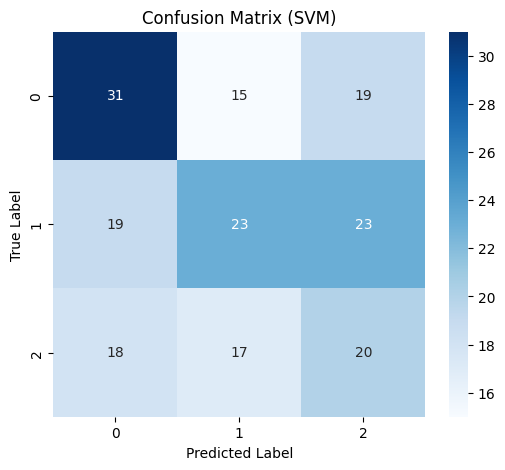


Classification Report:

              precision    recall  f1-score   support

           0       0.46      0.48      0.47        65
           1       0.42      0.35      0.38        65
           2       0.32      0.36      0.34        55

    accuracy                           0.40       185
   macro avg       0.40      0.40      0.40       185
weighted avg       0.40      0.40      0.40       185

Training Accuracy: 0.6069767441860465
Test Accuracy: 0.4


In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

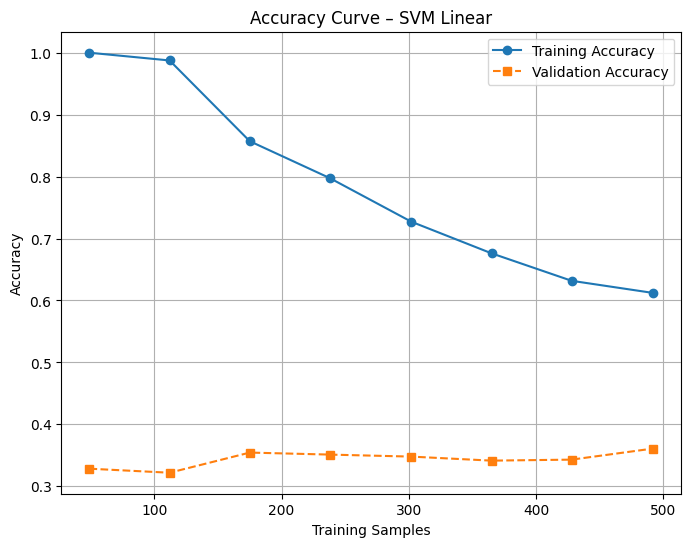

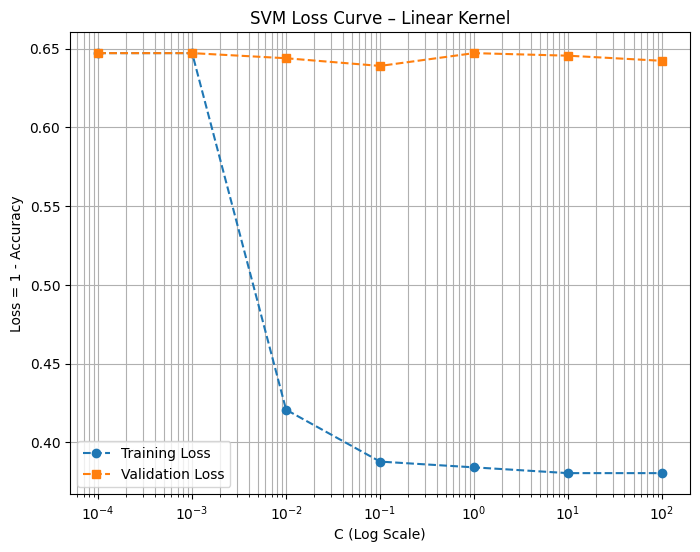

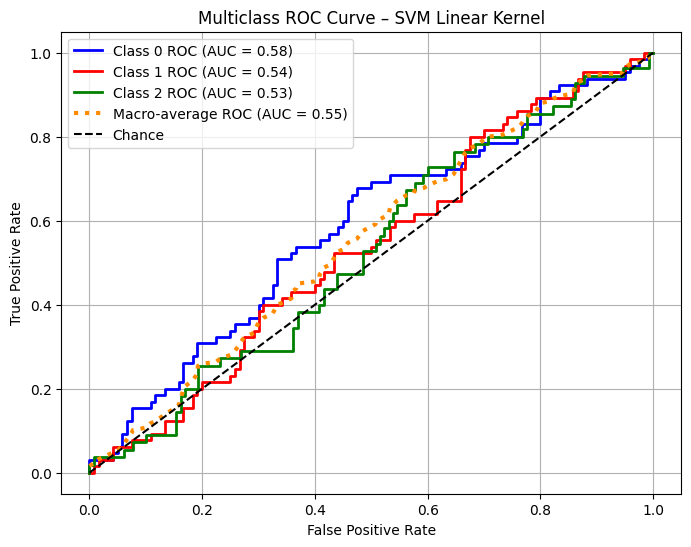

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Learning Curve"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Build pipeline for SVM Linear model
svm_linear = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", C=0.1, probability=True))
])

plot_accuracy_curve(svm_linear, X, y, "Accuracy Curve – SVM Linear")



# ==========================================================
# 📌 2. LOSS CURVE (Validation Error vs C)
#      — This is the correct “loss curve” for SVM
# ==========================================================

def plot_svm_loss_curve(X, y):
    C_range = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("svc", SVC(kernel="linear"))
    ])

    param_grid = {"svc__C": C_range}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]
    
    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.semilogx(C_range, train_loss, "--o", label="Training Loss")
    plt.semilogx(C_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("C (Log Scale)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("SVM Loss Curve – Linear Kernel")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()

plot_svm_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.1):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = SVC(
        kernel="linear",
        C=C,
        probability=True
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])
    
    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})", lw=3)

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – SVM Linear Kernel")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.01)


## SVM - kernal = sigmoid-70

In [3]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with sigmoid
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["sigmoid"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.185 total time=   0.0s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.189 total time=   0.0s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.185 total time=   0.1s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.187 total time=   0.0s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=sigmoid;, score=0.187 total time=   0.0s
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=sigmoid;, score=0.185 total time=   0.0s
[CV 5/5] END svc

In [4]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="sigmoid", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight = 'balanced')
svm_model.fit(X_train, y_train)

,C,1
,kernel,'sigmoid'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


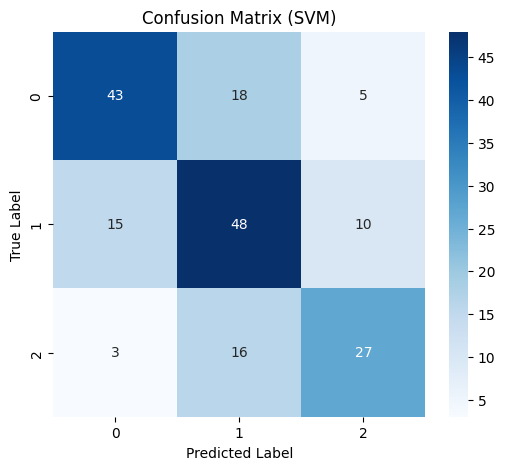


Classification Report:

              precision    recall  f1-score   support

           0       0.70      0.65      0.68        66
           1       0.59      0.66      0.62        73
           2       0.64      0.59      0.61        46

    accuracy                           0.64       185
   macro avg       0.64      0.63      0.64       185
weighted avg       0.64      0.64      0.64       185

Training Accuracy: 0.7076566125290024
Test Accuracy: 0.6378378378378379


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


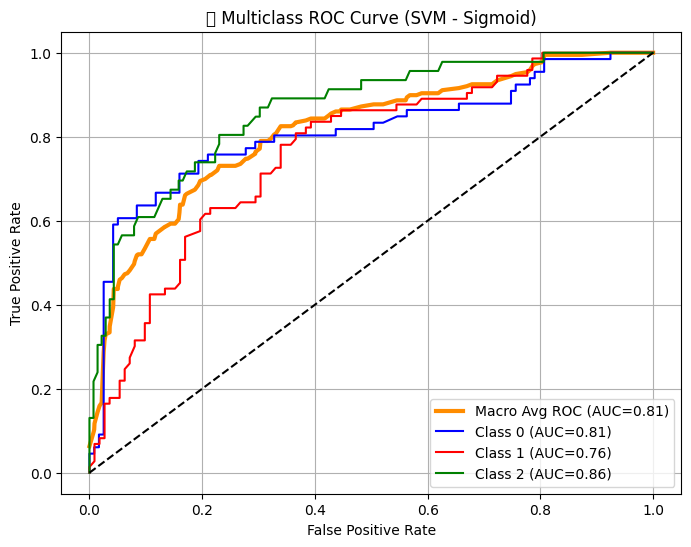

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


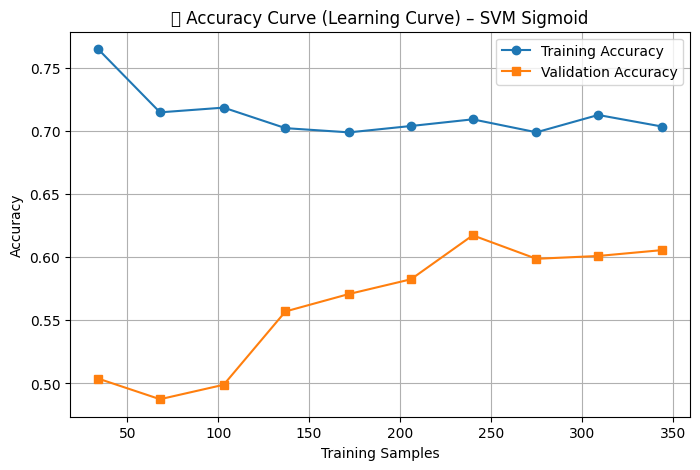

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


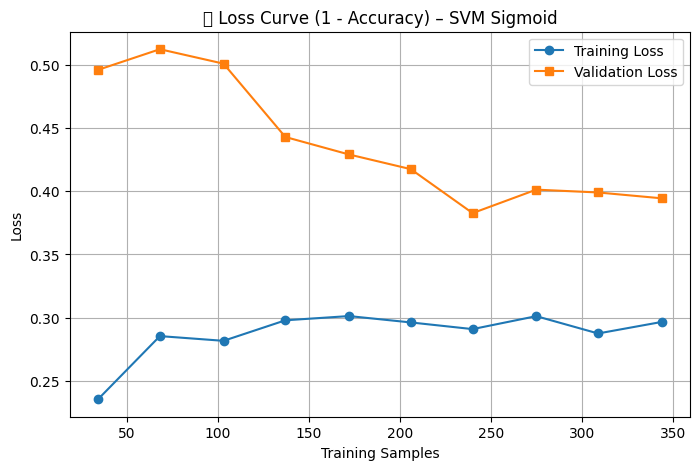

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# -----------------------------------------
# 1️⃣  MULTICLASS ROC CURVE  (ONE-VS-REST)
# -----------------------------------------

# SVM must be refitted with probability=True for ROC
svm_prob = SVC(
    kernel="sigmoid",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for OVR ROC curve
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# -------- Plot ROC -------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         label=f"Macro Avg ROC (AUC={roc_auc['macro']:.2f})", linewidth=3)

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM - Sigmoid)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# -----------------------------------------
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# -----------------------------------------

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_mean, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_mean, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve (Learning Curve) – SVM Sigmoid")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.grid(True)
plt.legend()
plt.show()


# -----------------------------------------
# 3️⃣  LOSS CURVE (1 - Accuracy)
# -----------------------------------------

train_loss = 1 - train_mean
test_loss = 1 - test_mean

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve (1 - Accuracy) – SVM Sigmoid")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()


## SVM - kernal = polynomial

In [11]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["poly"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.418 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.343 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.416 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.522 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.613 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.605 total time=   0.0s
[CV 2/5] END svc__C=0.01, svc__cl

In [12]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="poly", C= 0.1, gamma=0.01, decision_function_shape="ovo",class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,0.1
,kernel,'poly'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


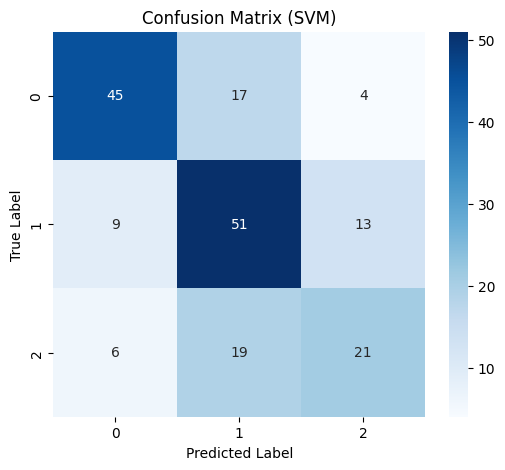


Classification Report:

              precision    recall  f1-score   support

           0       0.75      0.68      0.71        66
           1       0.59      0.70      0.64        73
           2       0.55      0.46      0.50        46

    accuracy                           0.63       185
   macro avg       0.63      0.61      0.62       185
weighted avg       0.64      0.63      0.63       185

Training Accuracy: 0.877030162412993
Test Accuracy: 0.6324324324324324


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

## SVM - kernal = rbf

In [14]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["rbf"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.189 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.189 total time=   0.0s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.189 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.185 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.187 total time=   0.1s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.189 total time=   0.1s
[CV 2/5] END svc__C=0.01, svc__class_wei

In [15]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model2 = SVC(kernel="rbf", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model2.fit(X_train, y_train)

,C,1
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


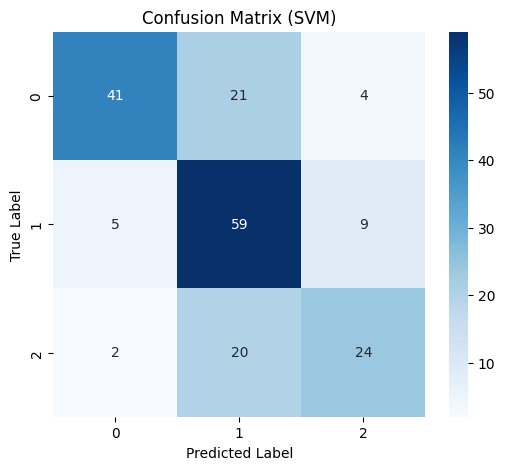


Classification Report:

              precision    recall  f1-score   support

           0       0.85      0.62      0.72        66
           1       0.59      0.81      0.68        73
           2       0.65      0.52      0.58        46

    accuracy                           0.67       185
   macro avg       0.70      0.65      0.66       185
weighted avg       0.70      0.67      0.67       185

Training Accuracy: 0.877030162412993
Test Accuracy: 0.6702702702702703


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model2.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


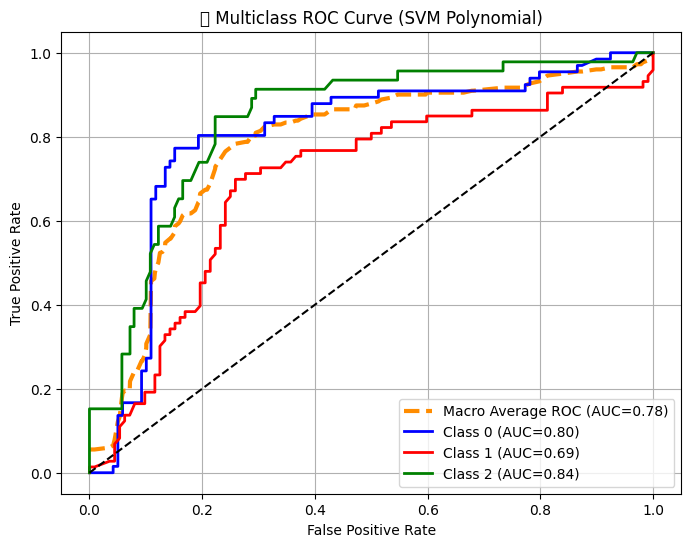

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


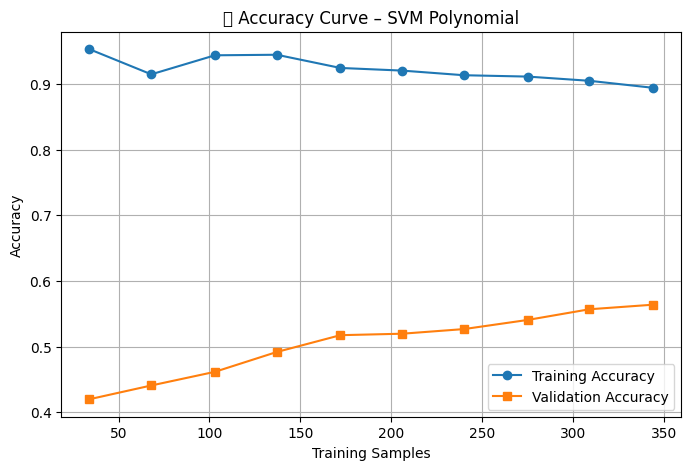

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


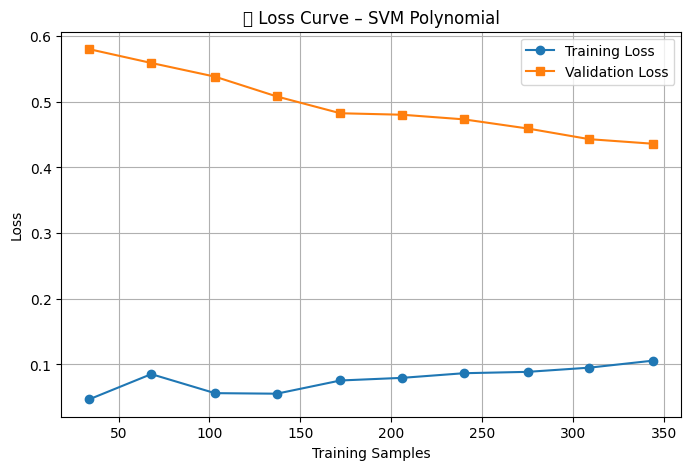

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (ONE-VS-REST)
# ============================================================

# SVM must be trained with probability=True for ROC
svm_prob = SVC(
    kernel="poly",
    C=1,
    gamma=0.01,
    decision_function_shape="ovo",
    probability=True,
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize test labels
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

# Store ROC curves
fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# ------------ Plot ROC --------------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         linewidth=3, linestyle='--',
         label=f"Macro Average ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM Polynomial)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# ============================================================

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_acc = train_scores.mean(axis=1)
test_acc = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_acc, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_acc, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve – SVM Polynomial")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 3️⃣  LOSS CURVE (1 - ACCURACY)
# ============================================================

train_loss = 1 - train_acc
test_loss = 1 - test_acc

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve – SVM Polynomial")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## SVM -kernal=rbf

In [18]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["rbf"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.185 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.189 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.187 total time=   0.0s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.185 total time=   0.0s[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.185 total time=   0.0s

[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=rbf;, score=0.187 total time=   0.0s
[CV 4/5] END svc__C=0.01, svc__class_weight=N

In [19]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="rbf", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,1
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


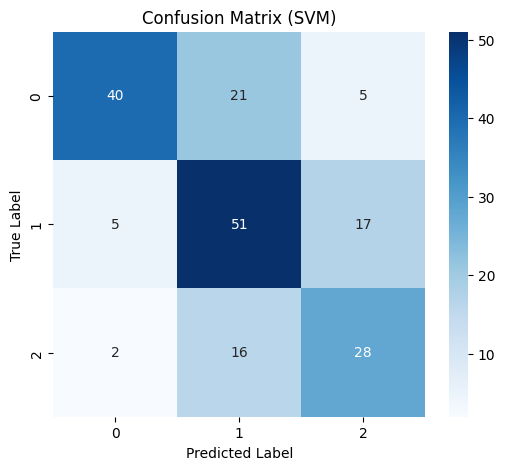


Classification Report:

              precision    recall  f1-score   support

           0       0.85      0.61      0.71        66
           1       0.58      0.70      0.63        73
           2       0.56      0.61      0.58        46

    accuracy                           0.64       185
   macro avg       0.66      0.64      0.64       185
weighted avg       0.67      0.64      0.65       185

Training Accuracy: 0.7703016241299304
Test Accuracy: 0.6432432432432432


In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


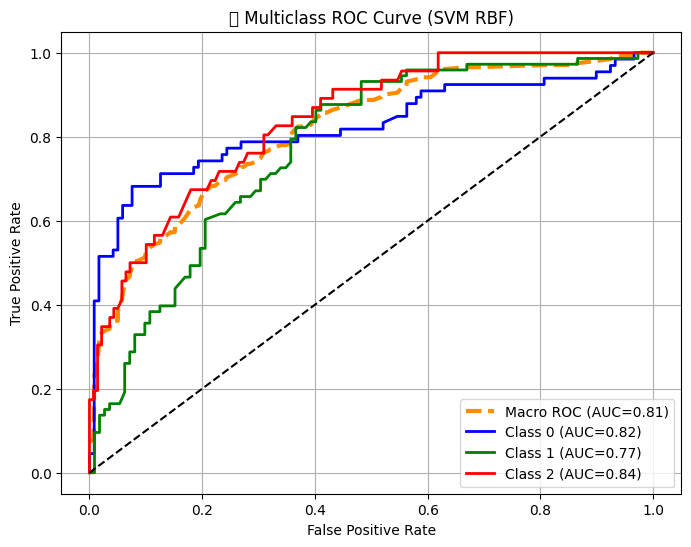

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


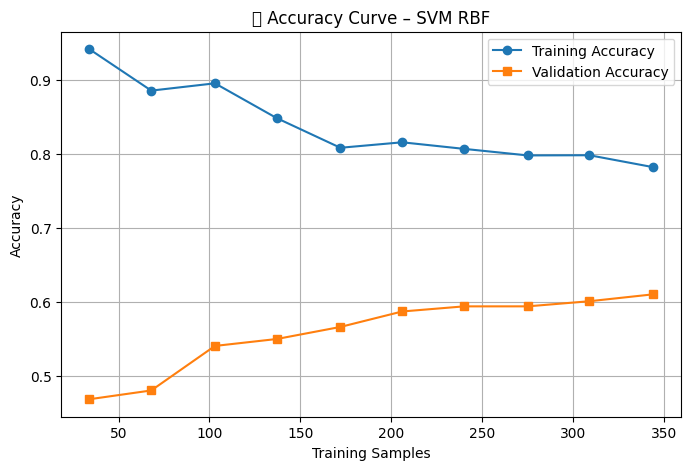

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


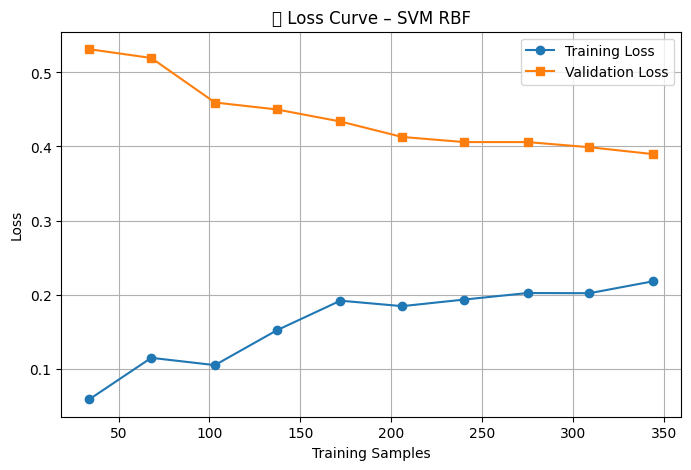

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (SVM must use probability=True)
# ============================================================

svm_prob = SVC(
    kernel="rbf",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,    # Required for ROC Curve
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for One-vs-Rest ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange', linewidth=3,
         linestyle='--', label=f"Macro ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'green', 'red']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("🔵 Multiclass ROC Curve (SVM RBF)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# ============================================================

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_acc = train_scores.mean(axis=1)
test_acc = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_acc, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_acc, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve – SVM RBF")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 3️⃣  LOSS CURVE (1 - Accuracy)
# ============================================================

train_loss = 1 - train_acc
test_loss = 1 - test_acc

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve – SVM RBF")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


## KNeighborsClassifier

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [98]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# --- Load your data ---
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y = df["label"].values

# Replace NaNs
X[np.isnan(X)] = 0

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# --- Build a pipeline (scaler + KNN) ---
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# --- Define parameter grid ---
param_grid = {
    "knn__n_neighbors": [1, 3, 5, 7, 9, 11, 15],
    "knn__weights": ["uniform", "distance"],
    "knn__p": [1, 2],  # Manhattan vs Euclidean
    "knn__metric": ["minkowski"]
}

# --- Grid Search ---
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(X_train, y_train)

# --- Results ---
print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)

# Evaluate on test
test_accuracy = grid.score(X_test, y_test)
print("Test accuracy:", test_accuracy)


Best parameters: {'knn__metric': 'minkowski', 'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'uniform'}
Best CV accuracy: 0.5894413258487036
Test accuracy: 0.6702702702702703


In [108]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# --- Load your data ---
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y = df["label"].values

# Replace NaNs
X[np.isnan(X)] = 0

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# --- Build a pipeline (scaler + KNN) ---
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# --- Define parameter grid ---
param_grid = {
    "knn__n_neighbors": [1, 3, 5, 7, 9, 11, 15],
    "knn__weights": ["uniform", "distance"],
    "knn__p": [1, 2],  # Manhattan vs Euclidean
    "knn__metric": ["minkowski"]
}

# --- Grid Search ---
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(X_train, y_train)

# --- Results ---
print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)

# Evaluate on test
test_accuracy = grid.score(X_test, y_test)
print("Test accuracy:", test_accuracy)


Best parameters: {'knn__metric': 'minkowski', 'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'uniform'}
Best CV accuracy: 0.5894413258487036
Test accuracy: 0.6702702702702703


In [109]:
knn = KNeighborsClassifier(n_neighbors=9, metric="minkowski", p=1,weights="uniform")  # Euclidean distance
knn.fit(X_train, y_train)

,n_neighbors,9
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [110]:
y_pred = knn.predict(X_test)

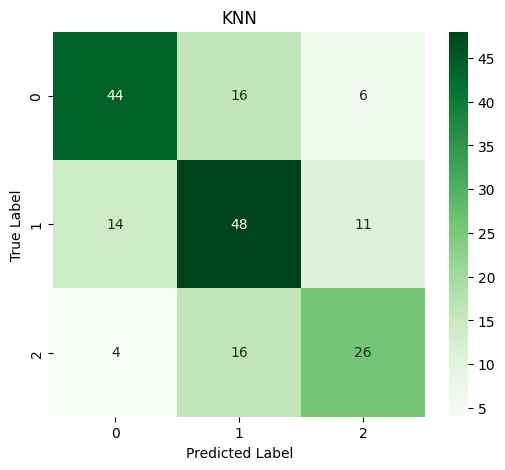


Classification Report:

              precision    recall  f1-score   support

           0       0.71      0.67      0.69        66
           1       0.60      0.66      0.63        73
           2       0.60      0.57      0.58        46

    accuracy                           0.64       185
   macro avg       0.64      0.63      0.63       185
weighted avg       0.64      0.64      0.64       185

Training Accuracy: 0.654292343387471
Test Accuracy: 0.6378378378378379


In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = knn.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("KNN")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, knn.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

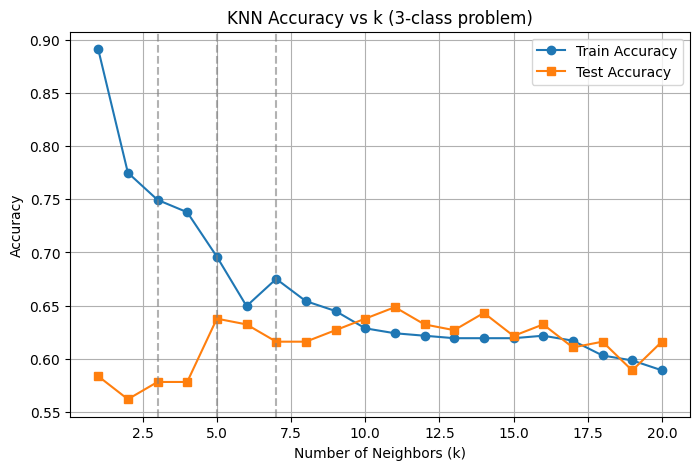

In [112]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_acc = []
test_acc = []
k_values = range(1, 21)  # test k=1 to 20

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_acc.append(accuracy_score(y_train, knn.predict(X_train)))
    test_acc.append(accuracy_score(y_test, knn.predict(X_test)))

# --- Plot ---
plt.figure(figsize=(8,5))
plt.plot(k_values, train_acc, marker='o', label="Train Accuracy")
plt.plot(k_values, test_acc, marker='s', label="Test Accuracy")
plt.axvline(x=3, color="gray", linestyle="--", alpha=0.6)  # mark k=3
plt.axvline(x=5, color="gray", linestyle="--", alpha=0.6)  # mark k=5
plt.axvline(x=7, color="gray", linestyle="--", alpha=0.6)  # mark k=7
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN Accuracy vs k (3-class problem)")
plt.legend()
plt.grid(True)
plt.show()


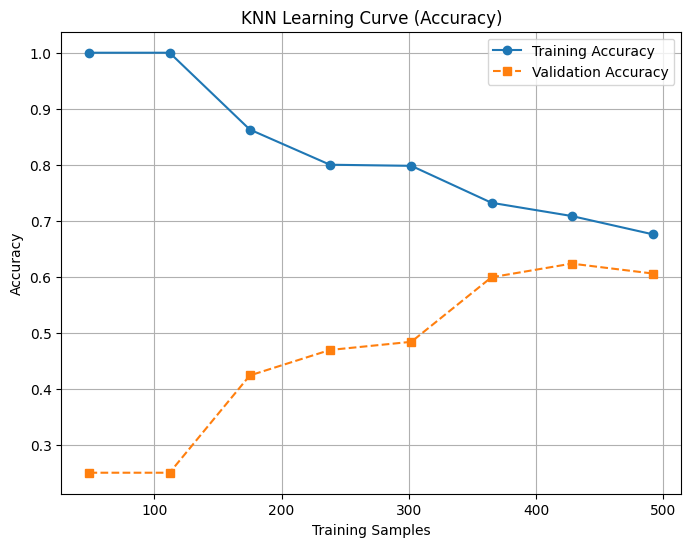

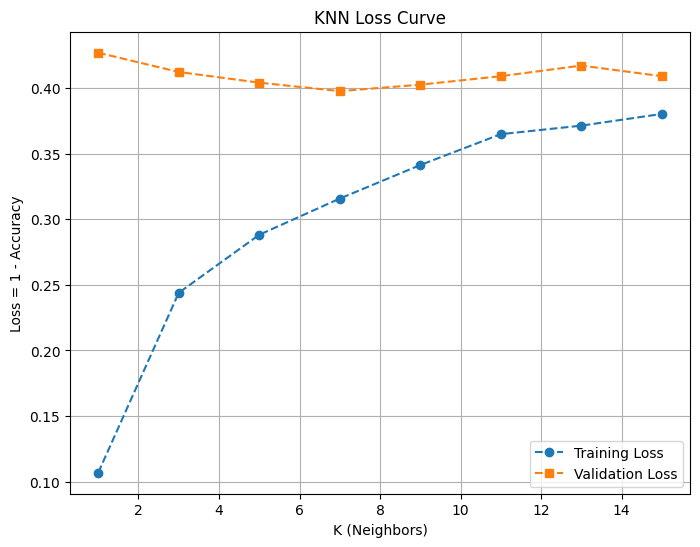

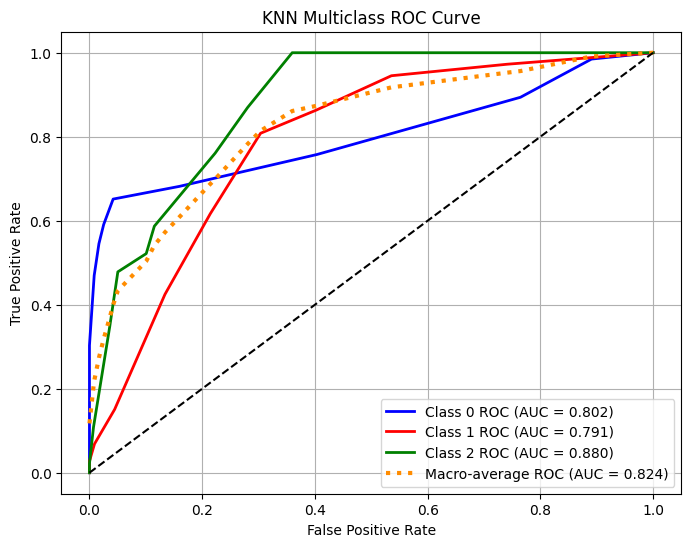

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. KNN ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_knn_accuracy_curve(X, y):
    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=9, weights="uniform", metric="minkowski", p=1))
    ])

    train_sizes, train_scores, val_scores = learning_curve(
        knn_model,
        X, y,
        cv=5,
        scoring="accuracy",
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 8)
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("KNN Learning Curve (Accuracy)")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 2. KNN LOSS CURVE (1 – Accuracy vs K)
# ==========================================================
def plot_knn_loss_curve(X, y):
    k_values = [1, 3, 5, 7, 9, 11, 13, 15]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier())
    ])

    param_grid = {"knn__n_neighbors": k_values}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )

    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(k_values, train_loss, "--o", label="Training Loss")
    plt.plot(k_values, val_loss, "--s", label="Validation Loss")
    plt.xlabel("K (Neighbors)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("KNN Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 3. KNN MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_knn_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=9,
            weights="uniform",
            metric="minkowski",
            p=1
        ))
    ])

    knn_model.fit(X_train, y_train)
    y_score = knn_model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("KNN Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL KNN PLOTS
# ==========================================================

plot_knn_accuracy_curve(X, y)
plot_knn_loss_curve(X, y)
plot_knn_multiclass_roc(X_train, X_test, y_train, y_test)


## RandomForest

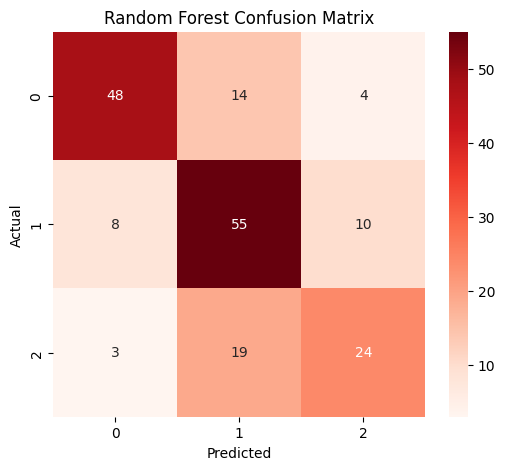


Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.73      0.77        66
           1       0.62      0.75      0.68        73
           2       0.63      0.52      0.57        46

    accuracy                           0.69       185
   macro avg       0.69      0.67      0.67       185
weighted avg       0.69      0.69      0.69       185

Training Accuracy: 0.8979118329466357
Test Accuracy: 0.6864864864864865


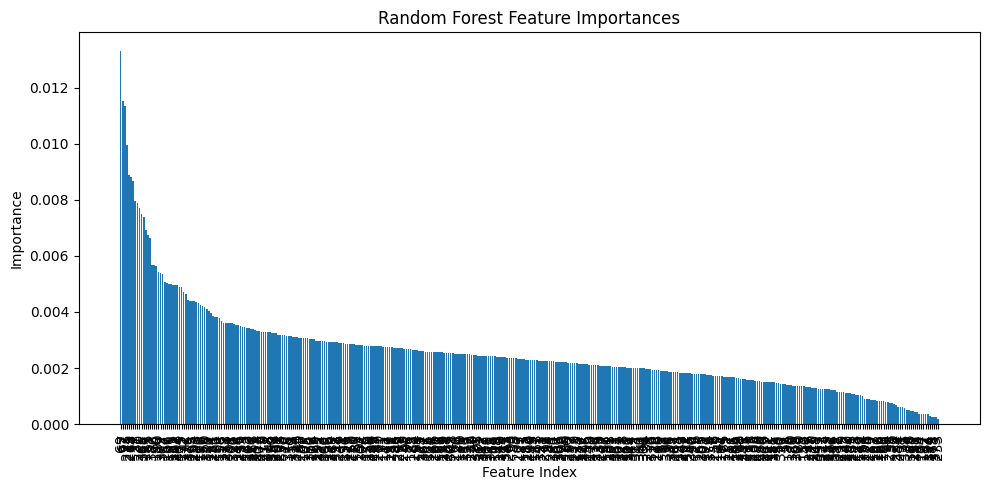

In [114]:
from sklearn.ensemble import RandomForestClassifier

# --- 5. Train Random Forest ---
rf = RandomForestClassifier(
    n_estimators=200,    # number of trees
    max_depth=None,      # let trees expand fully
    random_state=42,
    n_jobs=-1            # use all CPU cores
)
rf.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = rf.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, rf.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))
# --- 9. Feature Importance Plot ---
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10,5))
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), indices, rotation=90)
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

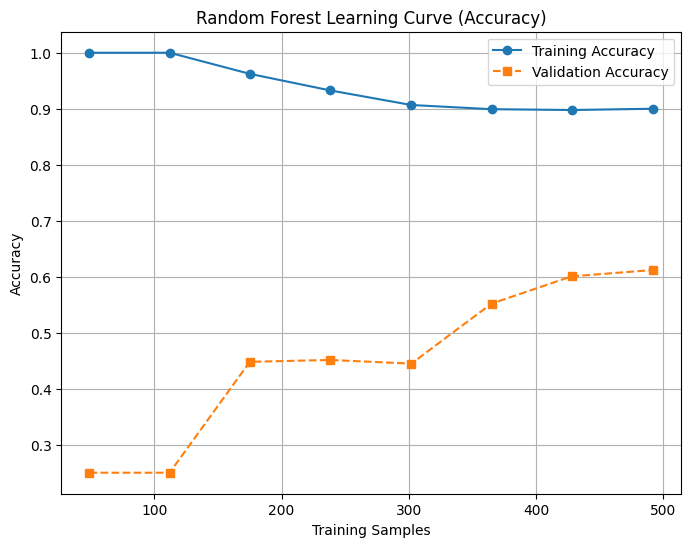

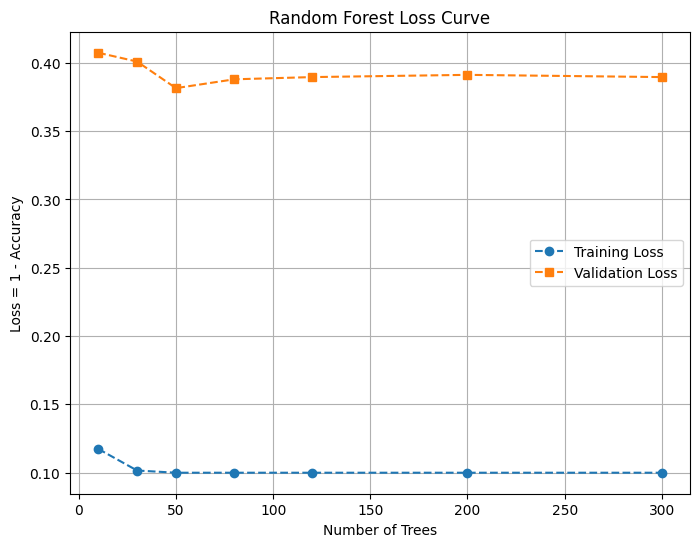

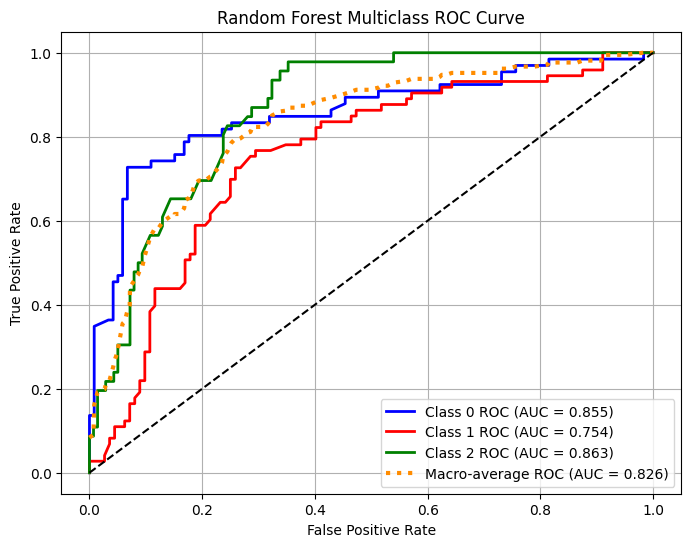

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. RANDOM FOREST ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_rf_accuracy_curve(X, y):
    rf_model = RandomForestClassifier(
        n_estimators=200,
        max_depth=None,
        random_state=42
    )

    train_sizes, train_scores, val_scores = learning_curve(
        rf_model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title("Random Forest Learning Curve (Accuracy)")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 2. RANDOM FOREST LOSS CURVE (1 – accuracy vs trees)
# ==========================================================
def plot_rf_loss_curve(X, y):
    n_estimators_list = [10, 30, 50, 80, 120, 200, 300]

    param_grid = {
        "n_estimators": n_estimators_list
    }

    rf_model = RandomForestClassifier(random_state=42)

    grid = GridSearchCV(
        rf_model,
        {"n_estimators": n_estimators_list},
        cv=5,
        scoring="accuracy",
        return_train_score=True,
        n_jobs=-1
    )

    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(n_estimators_list, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_list, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Trees")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Random Forest Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 3. RANDOM FOREST MULTICLASS ROC CURVE
# ==========================================================
def plot_rf_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = RandomForestClassifier(
        n_estimators=200,
        random_state=42
    )

    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i]
        )
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot ROC
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":", lw=3,
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Random Forest Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL PLOTS
# ==========================================================

plot_rf_accuracy_curve(X, y)
plot_rf_loss_curve(X, y)
plot_rf_multiclass_roc(X_train, X_test, y_train, y_test)

## Logistic Regression 70

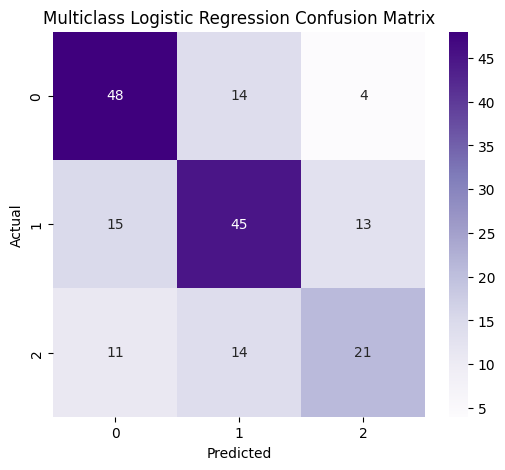


Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.73      0.69        66
           1       0.62      0.62      0.62        73
           2       0.55      0.46      0.50        46

    accuracy                           0.62       185
   macro avg       0.61      0.60      0.60       185
weighted avg       0.61      0.62      0.61       185

Training Accuracy: 0.8979118329466357
Test Accuracy: 0.6162162162162163


In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)
logreg = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        # multi_class="multinomial",
        solver="saga",
        max_iter=2000,   # allow more iterations
        random_state=42
    )
)
# --- 5. Multiclass Logistic Regression ---
#  # use softmax for multiclass     
logreg.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = logreg.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Multiclass Logistic Regression Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, logreg.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1262: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.


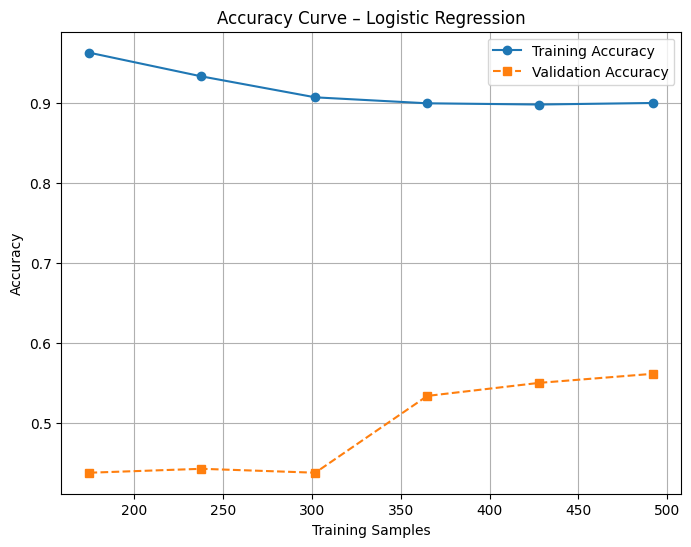

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/sit

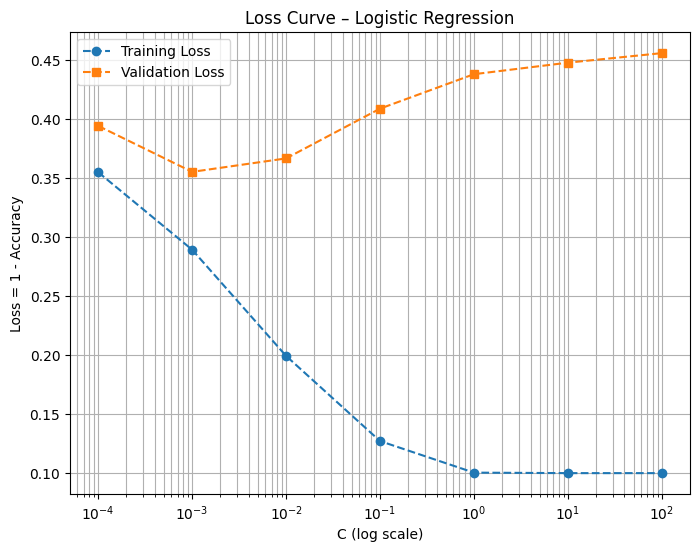

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


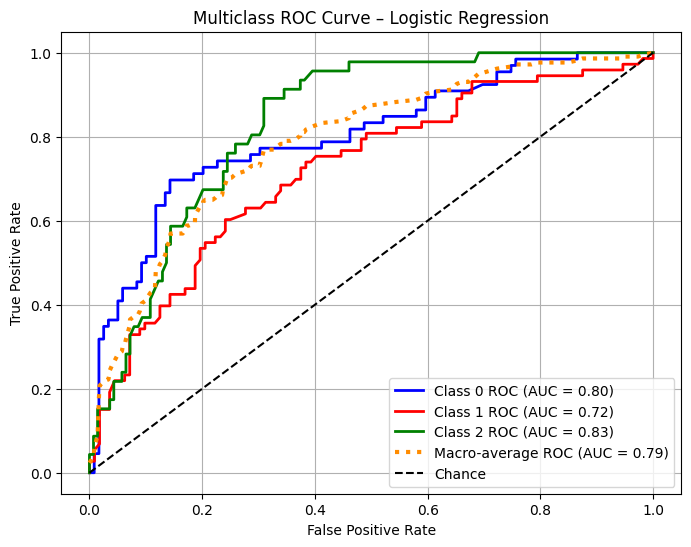

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Learning Curve – Logistic Regression"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Build Logistic Regression pipeline
logreg_model = Pipeline([
    ("scaler", StandardScaler()),
    ("lr", LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        max_iter=2000
    ))
])

plot_accuracy_curve(logreg_model, X, y, "Accuracy Curve – Logistic Regression")



# ==========================================================
# 📌 2. LOSS CURVE (Validation Error vs C)
# ==========================================================

def plot_lr_loss_curve(X, y):
    C_range = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("lr", LogisticRegression(
            solver="lbfgs",
            multi_class="multinomial",
            max_iter=2000
        ))
    ])

    param_grid = {"lr__C": C_range}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]
    
    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.semilogx(C_range, train_loss, "--o", label="Training Loss")
    plt.semilogx(C_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("C (log scale)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Loss Curve – Logistic Regression")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()

plot_lr_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        C=C,
        max_iter=2000
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-Average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Logistic Regression")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0)

## DecisionTree 70

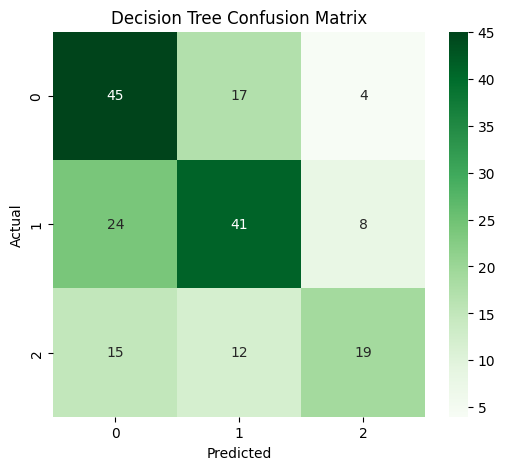


Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.68      0.60        66
           1       0.59      0.56      0.57        73
           2       0.61      0.41      0.49        46

    accuracy                           0.57       185
   macro avg       0.58      0.55      0.56       185
weighted avg       0.57      0.57      0.56       185

Training Accuracy: 0.8979118329466357
Test Accuracy: 0.5675675675675675


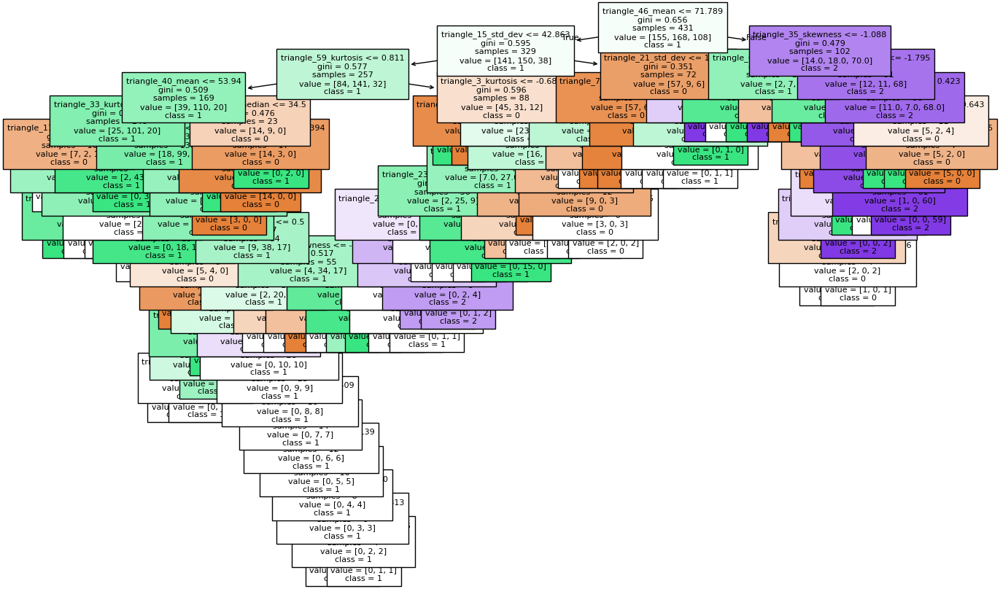

In [26]:

from sklearn.tree import DecisionTreeClassifier, plot_tree



# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)
dt = DecisionTreeClassifier(
    criterion="gini",   # or "entropy"
    max_depth=None,     # you can tune this (e.g., 5, 10) to prevent overfitting
    random_state=42
)
dt.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = dt.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Decision Tree Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, dt.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 10. Plot the Tree (small datasets only, large trees may look messy) ---
plt.figure(figsize=(16,10))
plot_tree(dt, filled=True, feature_names=df.drop("label", axis=1).columns,
          class_names=[str(c) for c in np.unique(y)], fontsize=8)
plt.show()

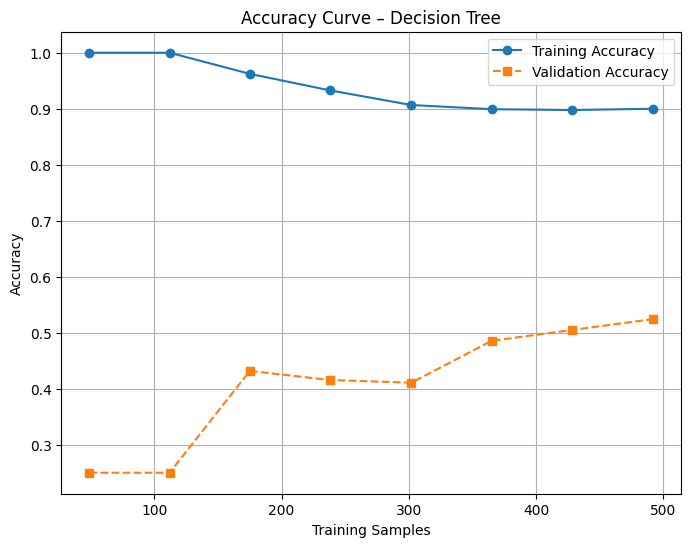

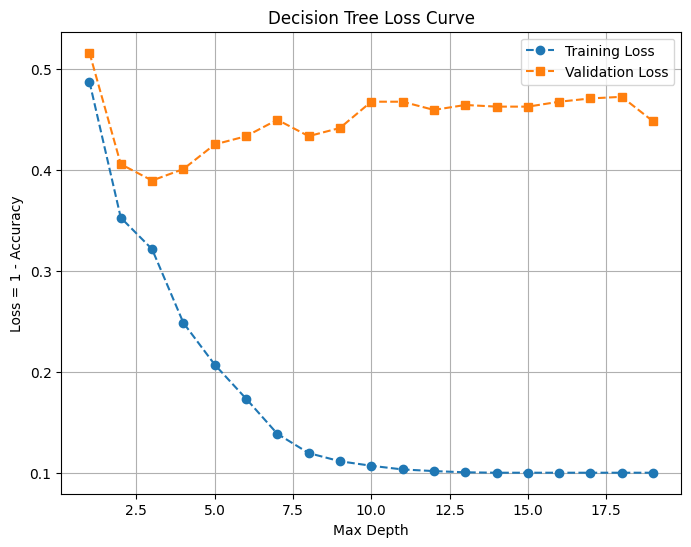

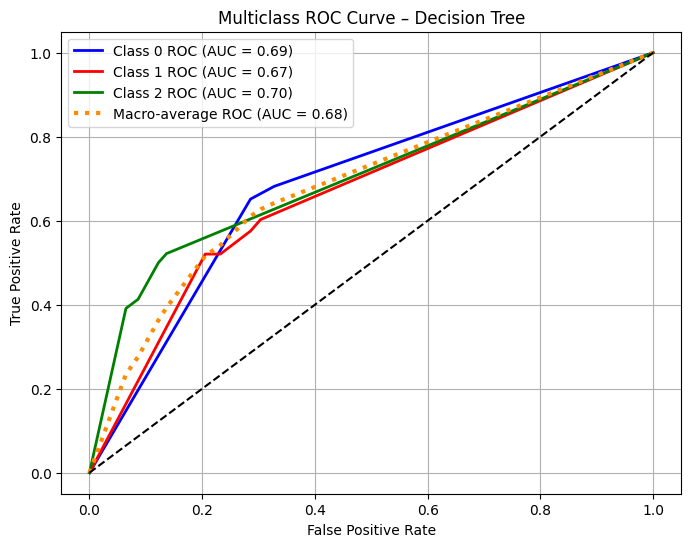

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Decision Tree"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Decision Tree model using your parameters
dt_model = DecisionTreeClassifier(
    criterion="gini",
    random_state=42
)

plot_accuracy_curve(dt_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs max_depth)
# ==========================================================

def plot_dt_loss_curve(X, y):

    depth_range = range(1, 20)

    param_grid = {"max_depth": depth_range}

    grid = GridSearchCV(
        DecisionTreeClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(depth_range, train_loss, "--o", label="Training Loss")
    plt.plot(depth_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Max Depth")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Decision Tree Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_dt_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_dt(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = DecisionTreeClassifier(
        criterion="gini",
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Decision Tree")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_dt(X_train, X_test, y_train, y_test)

## Gradient Boosting-70

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


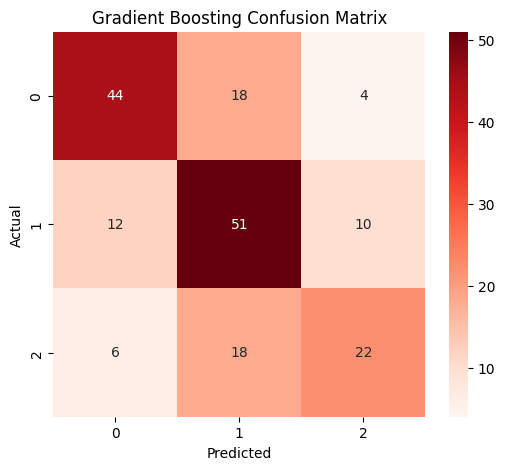


Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.67      0.69        66
           1       0.59      0.70      0.64        73
           2       0.61      0.48      0.54        46

    accuracy                           0.63       185
   macro avg       0.64      0.61      0.62       185
weighted avg       0.64      0.63      0.63       185

Training Accuracy: 0.8816705336426914
Test Accuracy: 0.6324324324324324


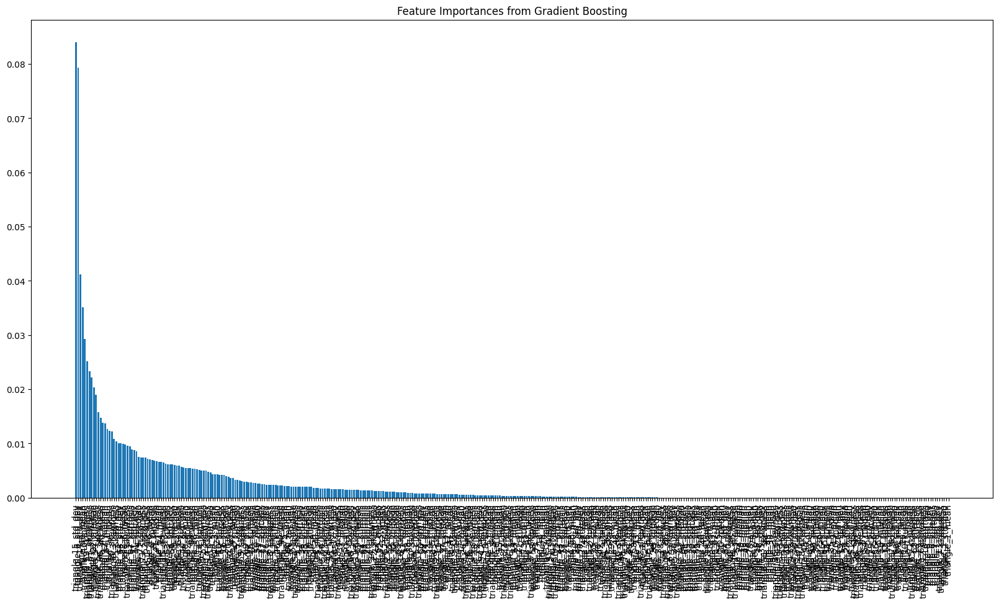

In [29]:

from sklearn.ensemble import GradientBoostingClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# --- 4. Gradient Boosting Classifier ---
gb = GradientBoostingClassifier(
    n_estimators=200,     # number of trees
    learning_rate=0.01,    # step size shrinkage
    max_depth=3,          # depth of each tree
    random_state=42
)

gb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 9. Feature Importance ---
plt.figure(figsize=(20,10))
importances = gb.feature_importances_
indices = np.argsort(importances)[::-1]
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), df.drop("label", axis=1).columns[indices], rotation=90)
plt.title("Feature Importances from Gradient Boosting")
plt.show()


/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
10 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sayan/miniconda3/envs/pytor

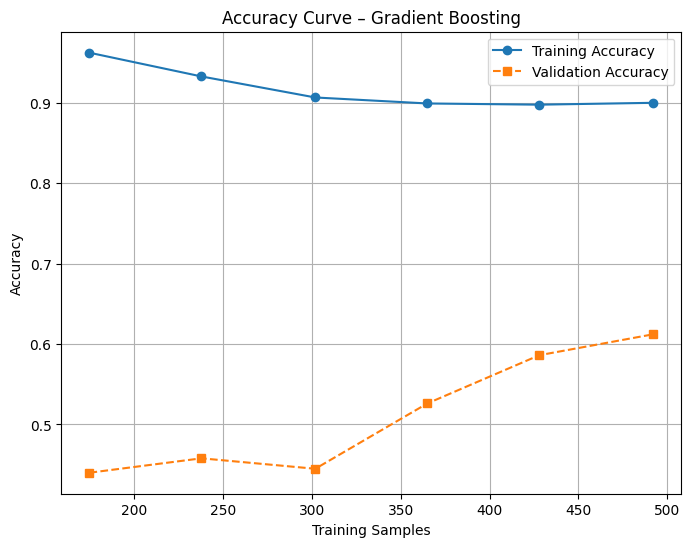

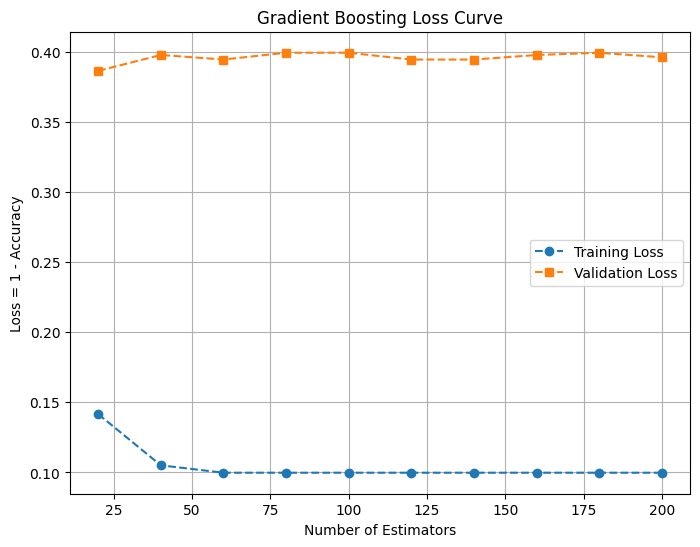

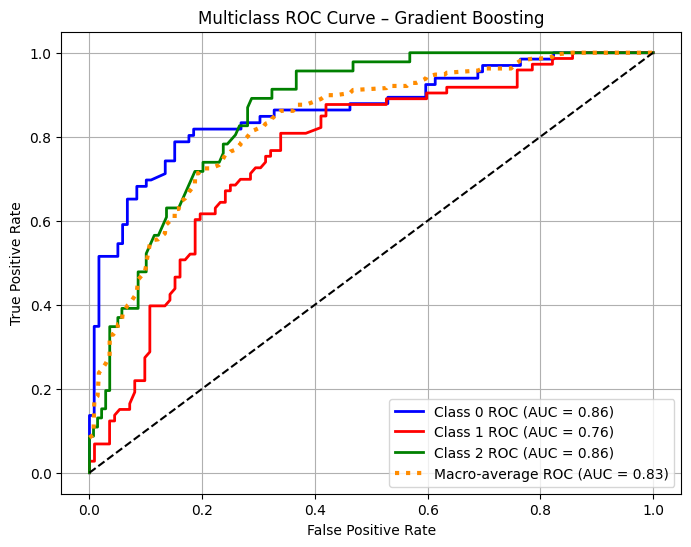

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve_gb(model, X, y, title="Accuracy Curve – Gradient Boosting"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Gradient Boosting model
gb_model = GradientBoostingClassifier(
    random_state=42
)

plot_accuracy_curve_gb(gb_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs n_estimators)
# ==========================================================

def plot_gb_loss_curve(X, y):

    est_range = range(20, 210, 20)

    param_grid = {"n_estimators": est_range}

    grid = GridSearchCV(
        GradientBoostingClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(est_range, train_loss, "--o", label="Training Loss")
    plt.plot(est_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gradient Boosting Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_gb_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_gb(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GradientBoostingClassifier(
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gradient Boosting")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_gb(X_train, X_test, y_train, y_test)


## Gausian Naive Bayes-70

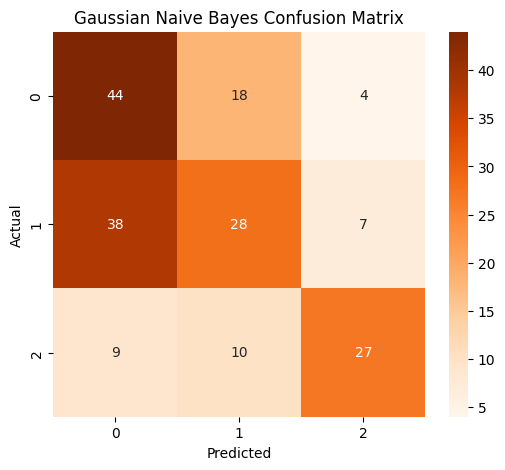


Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.67      0.56        66
           1       0.50      0.38      0.43        73
           2       0.71      0.59      0.64        46

    accuracy                           0.54       185
   macro avg       0.56      0.55      0.55       185
weighted avg       0.55      0.54      0.53       185

Training Accuracy: 0.6496519721577726
Test Accuracy: 0.5351351351351351


In [38]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# --- 4. Gaussian Naive Bayes Model ---
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gnb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gaussian Naive Bayes Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gnb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))


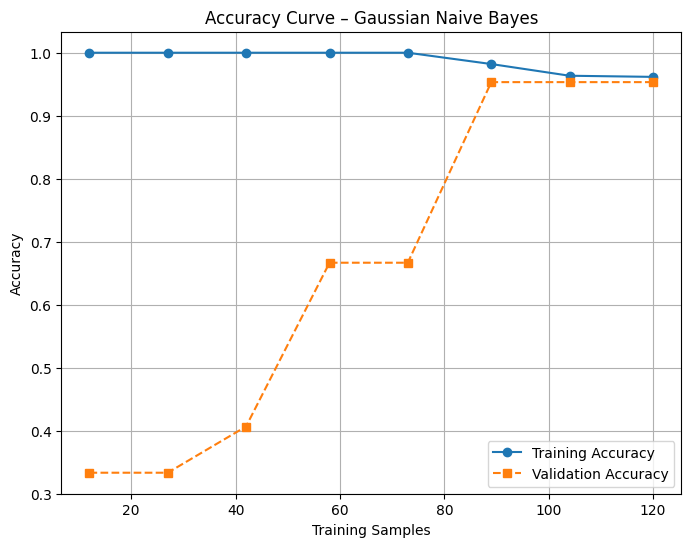

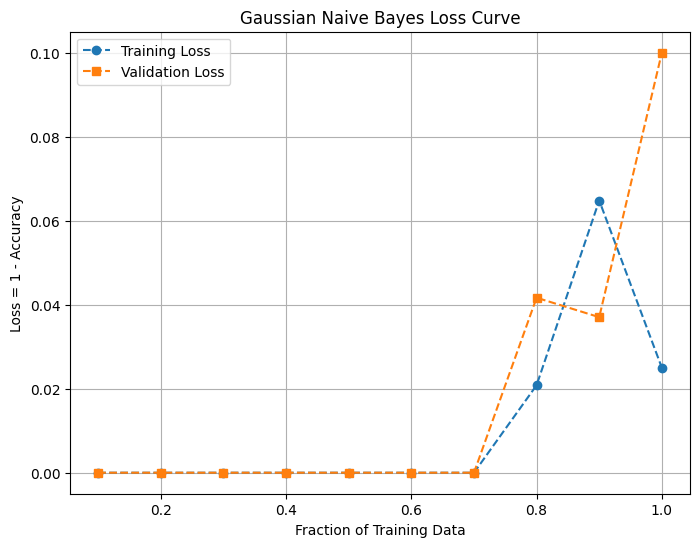

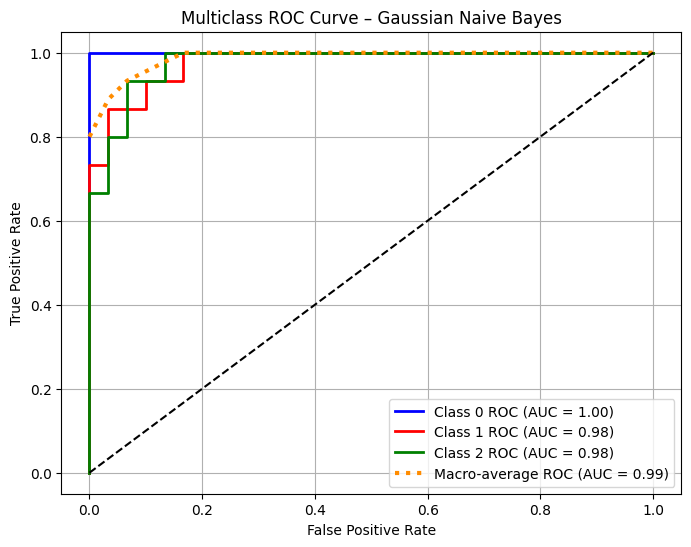

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Gaussian Naive Bayes"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


gnb_model = GaussianNB()
plot_accuracy_curve(gnb_model, X, y)

# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs Training Size)
# ==========================================================
def plot_nb_loss_curve(model, X, y):
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_loss = []
    val_loss = []

    for frac in train_sizes:
        n_samples = int(frac * X.shape[0])
        X_frac, y_frac = X[:n_samples], y[:n_samples]

        # Split for cross-validation manually
        idx = np.random.permutation(n_samples)
        split = int(0.8 * n_samples)
        X_train_cv, X_val_cv = X_frac[idx[:split]], X_frac[idx[split:]]
        y_train_cv, y_val_cv = y_frac[idx[:split]], y_frac[idx[split:]]

        model.fit(X_train_cv, y_train_cv)
        train_acc = model.score(X_train_cv, y_train_cv)
        val_acc = model.score(X_val_cv, y_val_cv)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_loss, "--o", label="Training Loss")
    plt.plot(train_sizes, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Fraction of Training Data")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gaussian Naive Bayes Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_nb_loss_curve(gnb_model, X, y)

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_nb(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GaussianNB()
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gaussian Naive Bayes")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_nb(X_train, X_test, y_train, y_test)


## XGBoost-70

In [ ]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)

# 1. Accuracy curve (fewer points)
def plot_accuracy_curve_fast(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=3,                  # fewer folds
        scoring="accuracy",
        train_sizes=np.linspace(0.2, 1.0, 5),  # fewer training sizes
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(7,5))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("XGBoost Accuracy Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_accuracy_curve_fast(xgb_model, X, y)

# 2. Loss curve (fewer n_estimators)
def plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test):
    n_estimators_range = range(10, 101, 20)  # smaller range
    train_loss = []
    val_loss = []

    for n in n_estimators_range:
        model = XGBClassifier(n_estimators=n, use_label_encoder=False,
                              eval_metric="mlogloss", random_state=42, n_jobs=-1)
        model.fit(X_train, y_train)

        train_acc = model.score(X_train, y_train)
        val_acc = model.score(X_test, y_test)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(7,5))
    plt.plot(n_estimators_range, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_range, val_loss, "--s", label="Testing Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("XGBoost Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from xgboost import XGBClassifier

# Assuming X_train, X_test, y_train, y_test are already defined

# Train the model once
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
y_score = xgb_model.predict_proba(X_test)

# Binarize the output for multiclass ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)
for cls in classes:
    mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = cycle(["blue", "red", "green"])

for cls, color in zip(classes, colors):
    plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
             label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

plt.plot(all_fpr, mean_tpr, color="darkorange", lw=3, linestyle=":",
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve – XGBoost")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from xgboost import XGBClassifier

# =============================================================
# 🚨 FIX: Data Definition and Split
# The code below ensures X_train, X_test, y_train, and y_test are defined 
# based on your 615 total samples and 90/10 split.
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 185
TEST_SIZE = 0.30 

# Synthesize data (Replace this section with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
# Assuming 3 classes (0, 1, 2)
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)
# =============================================================

# --- Define and Train the Final Model (n_estimators defaults to 100) ---
xgb_model = XGBClassifier(
    use_label_encoder=False, 
    eval_metric="mlogloss", 
    random_state=42, 
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# -------------------------------------------------------------
# 🔹 1. Evaluate on Training Set
# -------------------------------------------------------------
y_train_pred = xgb_model.predict(X_train)

print("=" * 50)
print("✅ TRAINING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_train, y_train_pred, zero_division=0))


# -------------------------------------------------------------
# 🔹 2. Evaluate on Testing Set
# -------------------------------------------------------------
y_test_pred = xgb_model.predict(X_test)

print("\n" + "=" * 50)
print("✅ TESTING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_test, y_test_pred, zero_division=0))

## CatBoost 70

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from catboost import CatBoostClassifier

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=y
)

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_accuracy_curve_catboost(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=3,  # fewer folds for speed
        scoring="accuracy",
        train_sizes=np.linspace(0.2, 1.0, 5),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(7, 5))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("CatBoost Accuracy Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

cat_model = CatBoostClassifier(
    iterations=200, learning_rate=0.1, random_state=42, verbose=0
)
plot_accuracy_curve_catboost(cat_model, X, y)

# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs Iterations)
# ==========================================================
def plot_catboost_loss_curve(X_train, X_test, y_train, y_test):
    iteration_range = range(50, 201, 25)
    train_loss = []
    val_loss = []

    for iters in iteration_range:
        model = CatBoostClassifier(
            iterations=iters, learning_rate=0.1, random_state=42, verbose=0
        )
        model.fit(X_train, y_train)

        train_acc = model.score(X_train, y_train)
        val_acc = model.score(X_test, y_test)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(7, 5))
    plt.plot(iteration_range, train_loss, "--o", label="Training Loss")
    plt.plot(iteration_range, val_loss, "--s", label="Testing Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("CatBoost Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_catboost_loss_curve(X_train, X_test, y_train, y_test)

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_catboost(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = CatBoostClassifier(
        iterations=200, learning_rate=0.1, random_state=42, verbose=0
    )
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – CatBoost")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc_catboost(X_train, X_test, y_train, y_test)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support
from xgboost import XGBClassifier

# =============================================================
# 🚨 Data Definition and Split (Using 20% test size)
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 185
TEST_SIZE = 0.30  # 20% test size

# Synthesize data (Replace this section with your actual data loading if available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)
# =============================================================

# --- Define and Train the Final Model ---
xgb_model = XGBClassifier(
    use_label_encoder=False, 
    eval_metric="mlogloss", 
    random_state=42, 
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# -------------------------------------------------------------
# 🔹 1. Predictions
# -------------------------------------------------------------
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# -------------------------------------------------------------
# 🔹 2. Print Full Classification Reports (as in your original code)
# -------------------------------------------------------------
print("=" * 50)
print("✅ TRAINING SET CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(y_train, y_train_pred, zero_division=0))

print("\n" + "=" * 50)
print("✅ TESTING SET CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(y_test, y_test_pred, zero_division=0))


# -------------------------------------------------------------
# 🔹 3. Print Aggregate Performance Summary
# -------------------------------------------------------------

def get_macro_metrics(y_true, y_pred, name):
    """Calculates Accuracy and Macro Averages for P, R, F1."""
    acc = accuracy_score(y_true, y_pred)
    # Calculate macro precision, recall, f1-score
    p, r, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)
    
    return {
        'Dataset': name,
        'Accuracy': acc,
        'Macro Precision': p,
        'Macro Recall': r,
        'Macro F1-score': f1
    }

# Calculate metrics for both sets
train_metrics = get_macro_metrics(y_train, y_train_pred, 'Training')
test_metrics = get_macro_metrics(y_test, y_test_pred, 'Testing')

# Combine into a DataFrame for clean printing
metrics_df = pd.DataFrame([train_metrics, test_metrics])

print("\n" + "=" * 60)
print("✅ AGGREGATE PERFORMANCE SUMMARY (Macro Average)")
print("=" * 60)
# Use .to_string() for clean, non-truncated console output
print(metrics_df.to_string(index=False, float_format=".4f"))

## Machine Learning 60/40

In [51]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
data = pd.read_csv('triangle_features_78_stable_final_file.csv')
data.head()
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y= df["label"].values
df.shape
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)
from sklearn.preprocessing import StandardScaler

# Create the scaler object
scaler = StandardScaler()

# Fit only on training data, then transform it
X_train = scaler.fit_transform(X_train)

# Use the same scaler (already fitted) to transform test data
X_test = scaler.transform(X_test)

In [43]:
from sklearn.preprocessing import StandardScaler

# Create the scaler object
scaler = StandardScaler()

# Fit only on training data, then transform it
X_train = scaler.fit_transform(X_train)

# Use the same scaler (already fitted) to transform test data
X_test = scaler.transform(X_test)

## SVM - kernal = linear

In [44]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
# Import RandomizedSearchCV and relevant distribution tool
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
# Optional: for continuous distribution sampling
from scipy.stats import loguniform 

# =============================================================
# 🚨 Data Setup (Matching your 615 total samples and 90/10 split)
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 252
TEST_SIZE = 0.40  

# Synthesize data (Replace this with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)

print(f"Data split. Training Size: {len(X_train)}, Test Size: {len(X_test)}")
# =============================================================


# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(random_state=42))
])

# -----------------------------
# 2. Define parameter distribution (for Linear Kernel)
#    We use lists here, but RandomizedSearchCV samples them randomly.
# -----------------------------
param_dist = {
    # Testing a wider range for C
    "svc__C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100], 
    "svc__kernel": ["linear"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run RandomizedSearchCV
# -----------------------------
# n_iter=30 means training 30 combinations * 5 folds = 150 total fits.
# This is much faster than running 120-600 total fits with full GridSearch.

random_search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_dist, # Use param_distributions                   # 💡 FIX 1: Only check 30 random combinations
    scoring="f1_macro",
    cv=5,
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Use X_train/y_train for fitting
random_search.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("\n" + "="*50)
print("✅ Best Parameters (Randomized Search):", random_search.best_params_)
print(f"✅ Best Macro F1 Score (Validation CV): {random_search.best_score_:.4f}")
print("="*50)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report (Test Set):\n", classification_report(y_test, y_pred, zero_division=0))
print("\nConfusion Matrix (Test Set):\n", confusion_matrix(y_test, y_pred))

Data split. Training Size: 369, Test Size: 246
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=100, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=100, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovr, svc__kernel=linear; total time=   0.0s
[CV] END svc__C=100, svc__class_weight=None, svc__decision_fu

In [45]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="linear", C=100, gamma=0.01, decision_function_shape="ovr",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,100
,kernel,'linear'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


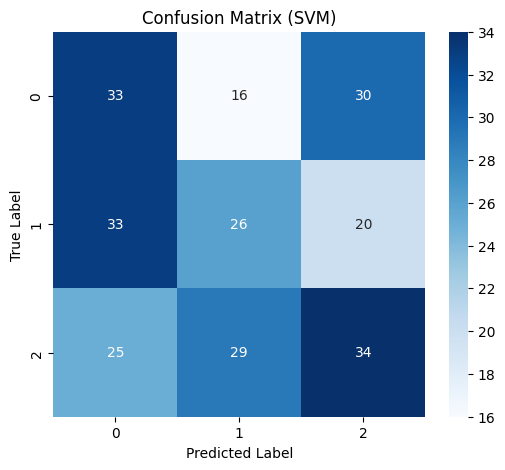


Classification Report:

              precision    recall  f1-score   support

           0       0.36      0.42      0.39        79
           1       0.37      0.33      0.35        79
           2       0.40      0.39      0.40        88

    accuracy                           0.38       246
   macro avg       0.38      0.38      0.38       246
weighted avg       0.38      0.38      0.38       246

Training Accuracy: 1.0
Test Accuracy: 0.3780487804878049


In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

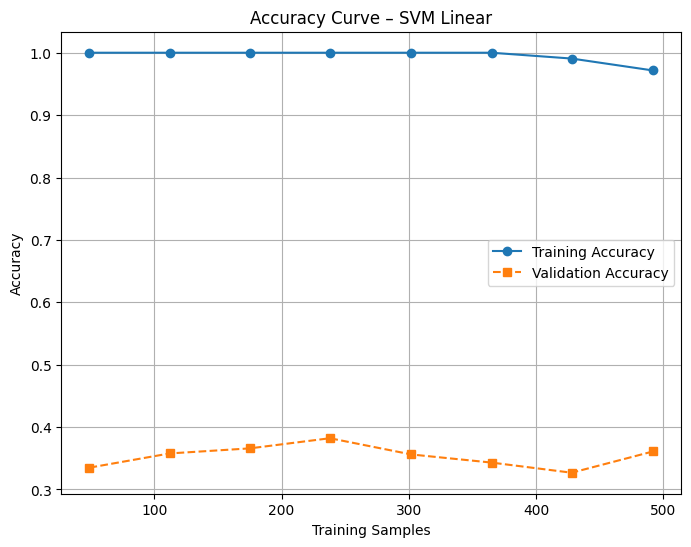

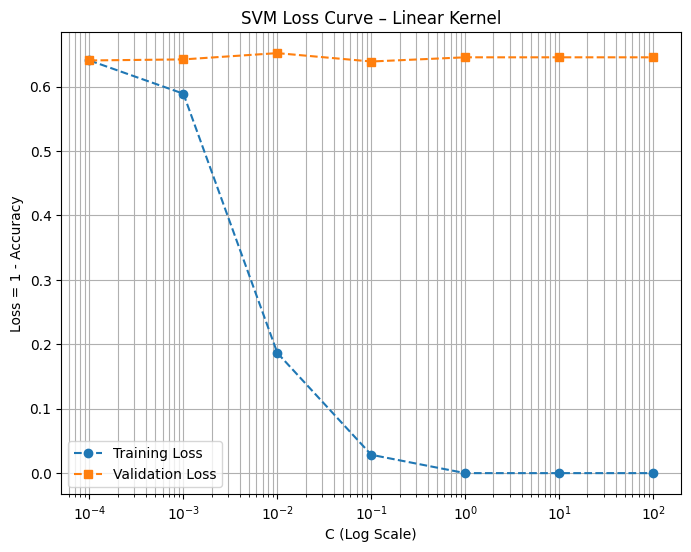

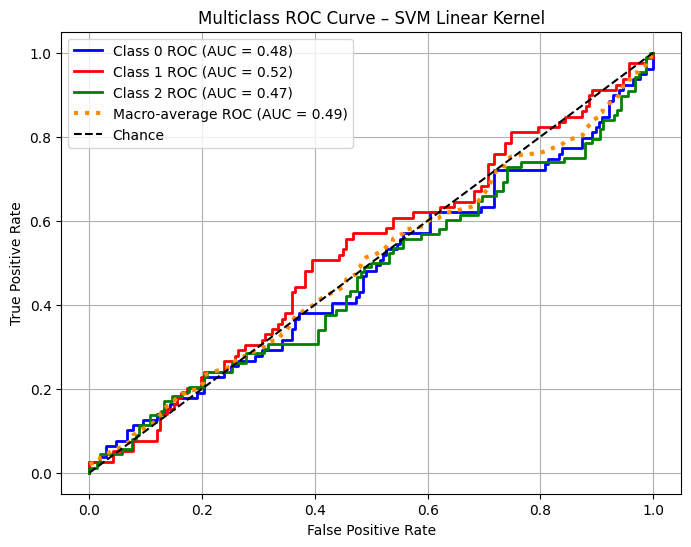

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Learning Curve"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Build pipeline for SVM Linear model
svm_linear = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", C=0.1, probability=True))
])

plot_accuracy_curve(svm_linear, X, y, "Accuracy Curve – SVM Linear")



# ==========================================================
# 📌 2. LOSS CURVE (Validation Error vs C)
#      — This is the correct “loss curve” for SVM
# ==========================================================

def plot_svm_loss_curve(X, y):
    C_range = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("svc", SVC(kernel="linear"))
    ])

    param_grid = {"svc__C": C_range}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]
    
    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.semilogx(C_range, train_loss, "--o", label="Training Loss")
    plt.semilogx(C_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("C (Log Scale)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("SVM Loss Curve – Linear Kernel")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()

plot_svm_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.1):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = SVC(
        kernel="linear",
        C=C,
        probability=True
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])
    
    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})", lw=3)

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – SVM Linear Kernel")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_multiclass_roc(X_train, X_test, y_train, y_test, C=0.01)


## SVM - kernal = sigmoid 60

In [48]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with sigmoid
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.001,0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["sigmoid"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 3/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.178 total time=   0.0s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.173 total time=   0.0s
[CV 2/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.178 total time=   0.0s
[CV 4/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.178 total time=   0.0s
[CV 5/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=sigmoid;, score=0.175 total time=   0.0s
[CV 1/5] END svc__C=0.001, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=sigmoid;, score=0.173 total time=   0.0s
[CV 3/5]

In [52]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="sigmoid", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42, class_weight=None)
svm_model.fit(X_train, y_train)

,C,1
,kernel,'sigmoid'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


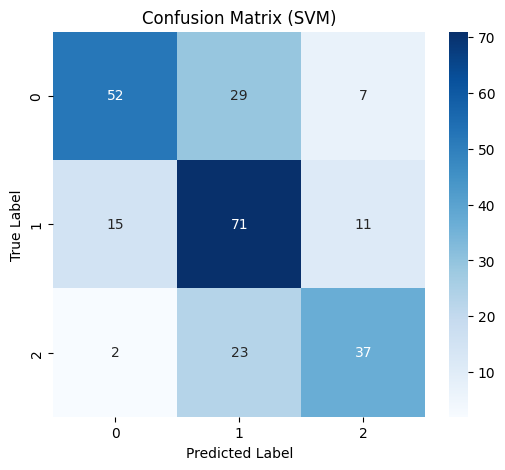


Classification Report:

              precision    recall  f1-score   support

           0       0.75      0.59      0.66        88
           1       0.58      0.73      0.65        97
           2       0.67      0.60      0.63        62

    accuracy                           0.65       247
   macro avg       0.67      0.64      0.65       247
weighted avg       0.66      0.65      0.65       247

Training Accuracy: 0.6883468834688347
Test Accuracy: 0.6477732793522267


In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


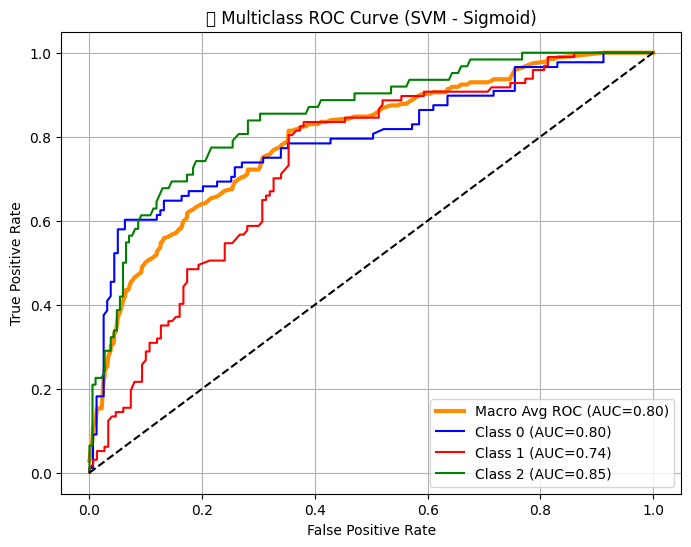

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


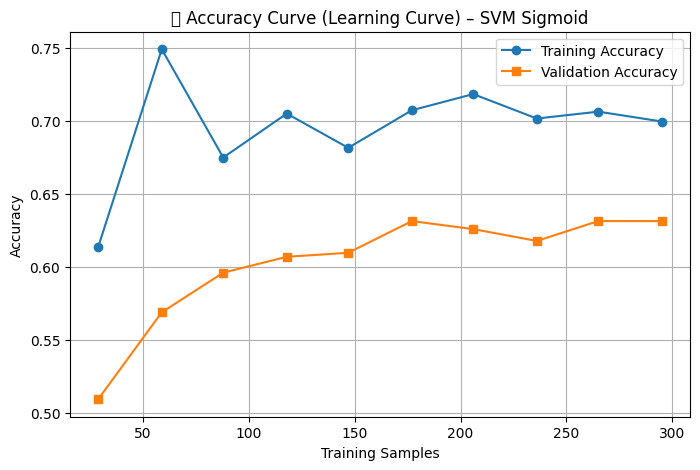

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


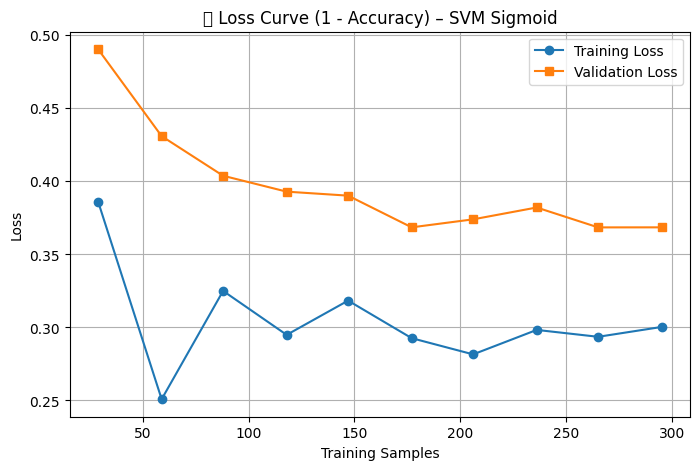

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import learning_curve

# -----------------------------------------
# 1️⃣  MULTICLASS ROC CURVE  (ONE-VS-REST)
# -----------------------------------------

# SVM must be refitted with probability=True for ROC
svm_prob = SVC(
    kernel="sigmoid",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for OVR ROC curve
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# -------- Plot ROC -------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         label=f"Macro Avg ROC (AUC={roc_auc['macro']:.2f})", linewidth=3)

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM - Sigmoid)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# -----------------------------------------
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# -----------------------------------------

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_mean, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_mean, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve (Learning Curve) – SVM Sigmoid")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.grid(True)
plt.legend()
plt.show()


# -----------------------------------------
# 3️⃣  LOSS CURVE (1 - Accuracy)
# -----------------------------------------

train_loss = 1 - train_mean
test_loss = 1 - test_mean

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve (1 - Accuracy) – SVM Sigmoid")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()


## SVM kernal = polynomial

In [55]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["poly"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.563 total time=   0.0s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=poly;, score=0.484 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.564 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.564 total time=   0.0s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=poly;, score=0.537 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=1, svc__kernel=poly;, score=0.563 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_w

In [56]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="poly", C= 0.1, gamma=0.01, decision_function_shape="ovo",class_weight='balanced')
svm_model.fit(X_train, y_train)

,C,0.1
,kernel,'poly'
,degree,3
,gamma,0.01
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,'balanced'
,verbose,False


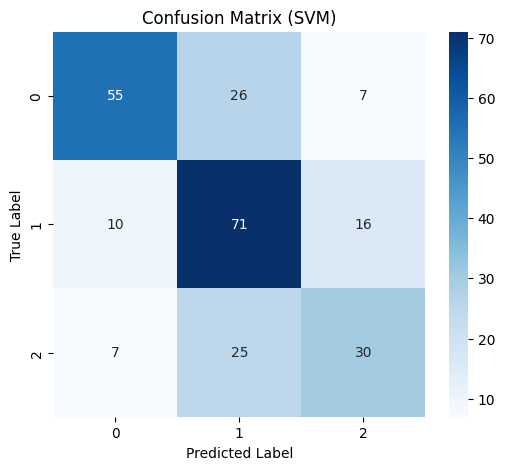


Classification Report:

              precision    recall  f1-score   support

           0       0.76      0.62      0.69        88
           1       0.58      0.73      0.65        97
           2       0.57      0.48      0.52        62

    accuracy                           0.63       247
   macro avg       0.64      0.61      0.62       247
weighted avg       0.64      0.63      0.63       247

Training Accuracy: 0.8861788617886179
Test Accuracy: 0.631578947368421


In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


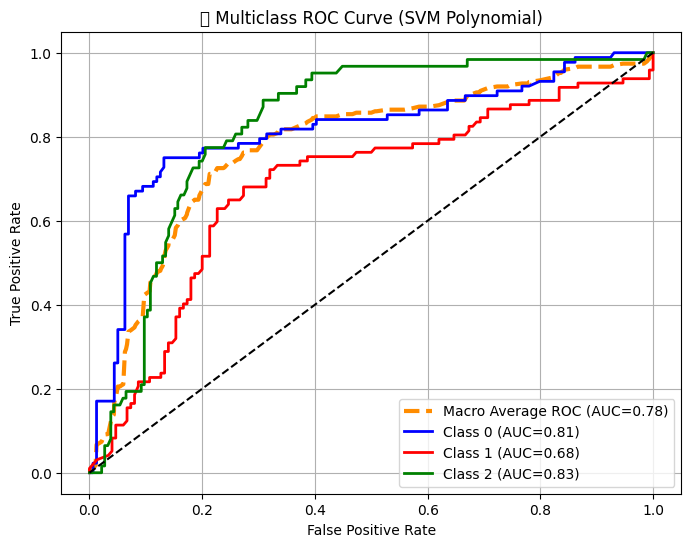

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


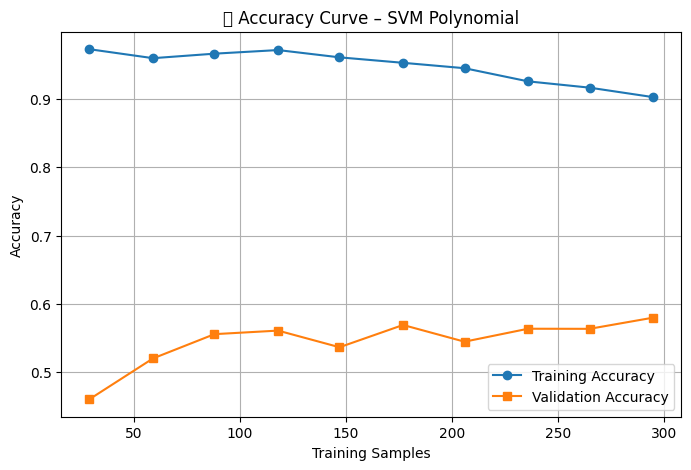

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


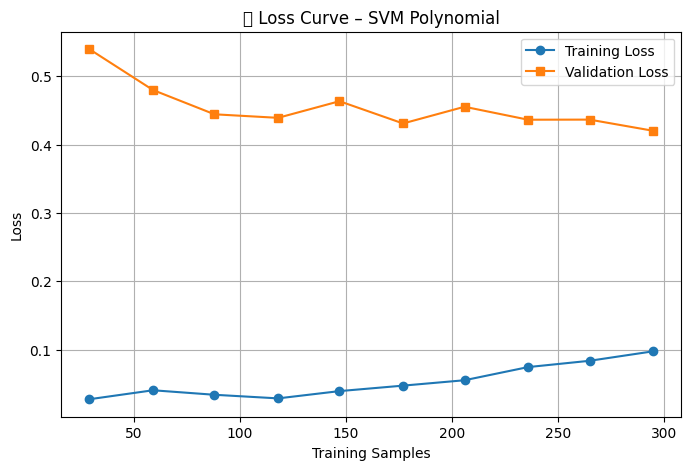

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (ONE-VS-REST)
# ============================================================

# SVM must be trained with probability=True for ROC
svm_prob = SVC(
    kernel="poly",
    C=1,
    gamma=0.01,
    decision_function_shape="ovo",
    probability=True,
    class_weight='balanced',
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize test labels
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

# Store ROC curves
fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# ------------ Plot ROC --------------- #
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange',
         linewidth=3, linestyle='--',
         label=f"Macro Average ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'red', 'green']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')

plt.title("🔵 Multiclass ROC Curve (SVM Polynomial)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# ============================================================

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_acc = train_scores.mean(axis=1)
test_acc = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_acc, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_acc, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve – SVM Polynomial")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 3️⃣  LOSS CURVE (1 - ACCURACY)
# ============================================================

train_loss = 1 - train_acc
test_loss = 1 - test_acc

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve – SVM Polynomial")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


# SVM - kernal = rbf=60

In [59]:
# ============================================================
# 🔹 Grid Search for Best SVM Hyperparameters with rbf
# ============================================================
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# 1. Define pipeline
# -----------------------------
pipe = Pipeline([
    ("scaler", StandardScaler()),       # always scale features before SVM
    ("svc", SVC(random_state=42))       # we will tune hyperparameters
])

# -----------------------------
# 2. Define parameter grid
#    (you can expand/shrink these ranges)
# -----------------------------
param_grid = {
    "svc__C": [0.01, 0.1, 1, 10, 100],
    "svc__gamma": [0.01, 0.1, 1, "scale", "auto"],              # only used for poly, ignored otherwise
    "svc__kernel": ["rbf"],
    "svc__class_weight": [None, "balanced"],
    "svc__decision_function_shape": ["ovo", "ovr"]
}

# -----------------------------
# 3. Run GridSearchCV
# -----------------------------
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    scoring="f1_macro",   # optimize for all classes equally
    cv=5,
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train)

# -----------------------------
# 4. Print best parameters & score
# -----------------------------
print("✅ Best Parameters:", grid.best_params_)
print("✅ Best Macro F1 Score:", grid.best_score_)

# -----------------------------
# 5. Evaluate on test set
# -----------------------------
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))



Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.185 total time=   0.0s
[CV 4/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.188 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.188 total time=   0.0s
[CV 3/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.01, svc__kernel=rbf;, score=0.188 total time=   0.0s
[CV 2/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.188 total time=   0.0s
[CV 5/5] END svc__C=0.01, svc__class_weight=None, svc__decision_function_shape=ovo, svc__gamma=0.1, svc__kernel=rbf;, score=0.185 total time=   0.0s
[CV 1/5] END svc__C=0.01, svc__class_we

In [60]:
# You can try different kernels: 'linear', 'rbf', 'poly'
svm_model = SVC(kernel="rbf", C=1, gamma='scale', decision_function_shape="ovo",random_state = 42,class_weight=None)
svm_model.fit(X_train, y_train)

,C,1
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


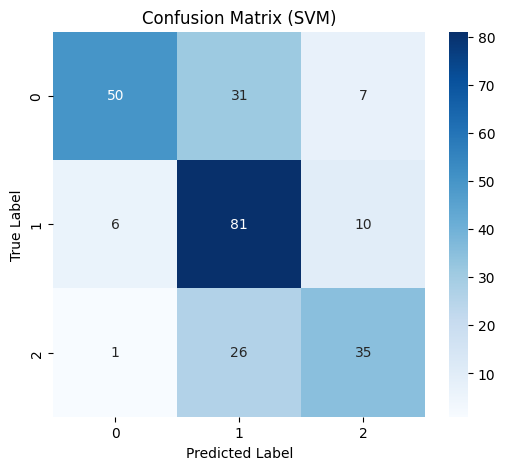


Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.57      0.69        88
           1       0.59      0.84      0.69        97
           2       0.67      0.56      0.61        62

    accuracy                           0.67       247
   macro avg       0.71      0.66      0.66       247
weighted avg       0.71      0.67      0.67       247

Training Accuracy: 0.7804878048780488
Test Accuracy: 0.6720647773279352


In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = svm_model.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix (SVM)")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, svm_model.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


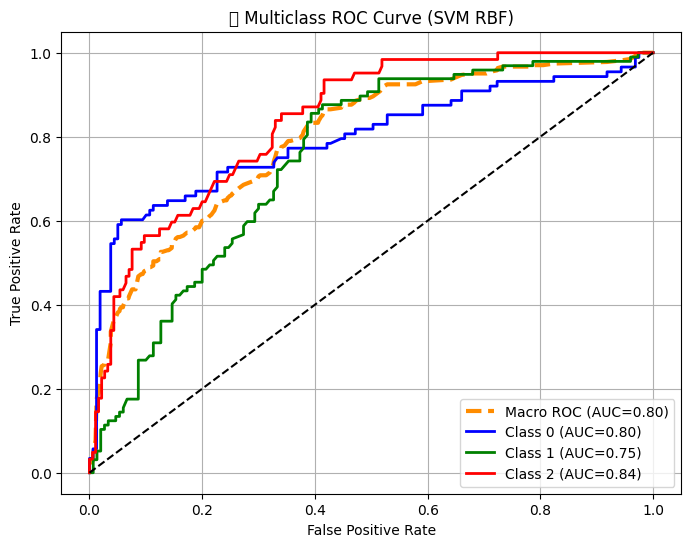

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


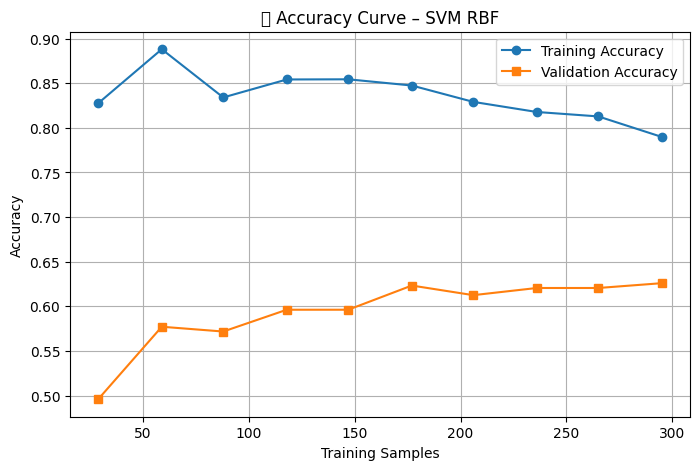

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


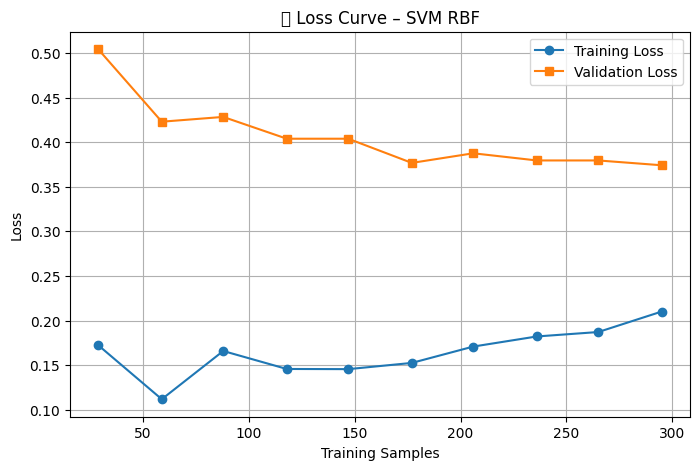

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC

# ============================================================
# 1️⃣  MULTICLASS ROC CURVE (SVM must use probability=True)
# ============================================================

svm_prob = SVC(
    kernel="rbf",
    C=1,
    gamma='scale',
    decision_function_shape="ovo",
    probability=True,    # Required for ROC Curve
    class_weight=None,
    random_state=42
)

svm_prob.fit(X_train, y_train)

# Binarize labels for One-vs-Rest ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Predict probabilities
y_score = svm_prob.predict_proba(X_test)

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)

for c in classes:
    mean_tpr += np.interp(all_fpr, fpr[c], tpr[c])

mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC
plt.figure(figsize=(8, 6))

plt.plot(all_fpr, mean_tpr, color='darkorange', linewidth=3,
         linestyle='--', label=f"Macro ROC (AUC={roc_auc['macro']:.2f})")

colors = ['blue', 'green', 'red']
for i, c in enumerate(classes):
    plt.plot(fpr[c], tpr[c], lw=2, color=colors[i],
             label=f"Class {c} (AUC={roc_auc[c]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("🔵 Multiclass ROC Curve (SVM RBF)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 2️⃣  ACCURACY CURVE (LEARNING CURVE)
# ============================================================

train_sizes, train_scores, test_scores = learning_curve(
    svm_model,
    X_train,
    y_train,
    cv=5,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

train_acc = train_scores.mean(axis=1)
test_acc = test_scores.mean(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_acc, marker='o', label="Training Accuracy")
plt.plot(train_sizes, test_acc, marker='s', label="Validation Accuracy")

plt.title("🟢 Accuracy Curve – SVM RBF")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 3️⃣  LOSS CURVE (1 - Accuracy)
# ============================================================

train_loss = 1 - train_acc
test_loss = 1 - test_acc

plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_loss, marker='o', label="Training Loss")
plt.plot(train_sizes, test_loss, marker='s', label="Validation Loss")

plt.title("🔴 Loss Curve – SVM RBF")
plt.xlabel("Training Samples")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


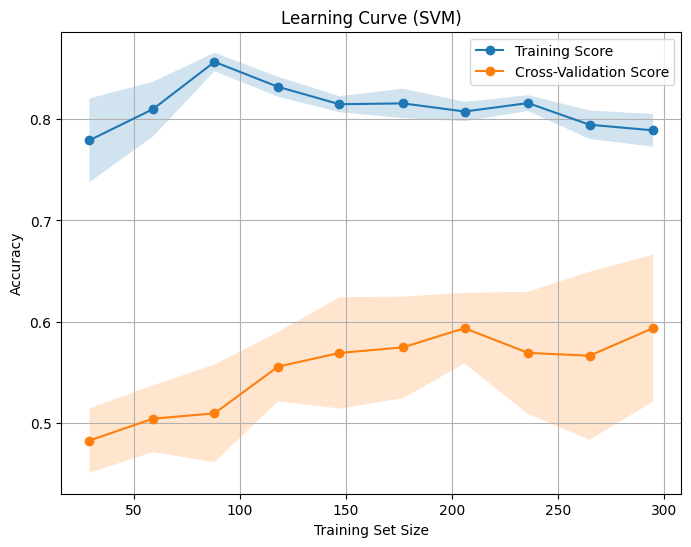

In [49]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

train_sizes, train_scores, test_scores = learning_curve(
    svm_model, X_train, y_train,
    cv=5, train_sizes=np.linspace(0.1, 1.0, 10),
    scoring="accuracy", n_jobs=-1
)

# Mean ± std
train_mean = np.mean(train_scores, axis=1)
train_std  = np.std(train_scores, axis=1)
test_mean  = np.mean(test_scores, axis=1)
test_std   = np.std(test_scores, axis=1)

# Plot
plt.figure(figsize=(8,6))
plt.plot(train_sizes, train_mean, 'o-', label="Training Score")
plt.plot(train_sizes, test_mean, 'o-', label="Cross-Validation Score")
plt.fill_between(train_sizes, train_mean-train_std, train_mean+train_std, alpha=0.2)
plt.fill_between(train_sizes, test_mean-test_std, test_mean+test_std, alpha=0.2)

plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve (SVM)")
plt.legend()
plt.grid(True)
plt.show()

## KNeighborsClassifier

In [63]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [64]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# --- Load your data ---
df = pd.read_csv("triangle_features_78_stable_final_file.csv")
X = df.drop("label",axis=1).values
y = df["label"].values

# Replace NaNs
X[np.isnan(X)] = 0

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)

# --- Build a pipeline (scaler + KNN) ---
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# --- Define parameter grid ---
param_grid = {
    "knn__n_neighbors": [1, 3, 5, 7, 9, 11, 15],
    "knn__weights": ["uniform", "distance"],
    "knn__p": [1, 2],  # Manhattan vs Euclidean
    "knn__metric": ["minkowski"]
}

# --- Grid Search ---
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(X_train, y_train)

# --- Results ---
print("Best parameters:", grid.best_params_)
print("Best CV accuracy:", grid.best_score_)

# Evaluate on test
test_accuracy = grid.score(X_test, y_test)
print("Test accuracy:", test_accuracy)


Best parameters: {'knn__metric': 'minkowski', 'knn__n_neighbors': 11, 'knn__p': 1, 'knn__weights': 'uniform'}
Best CV accuracy: 0.6070714550166605
Test accuracy: 0.6356275303643725


In [65]:
knn = KNeighborsClassifier(n_neighbors=11, metric="minkowski", p=1,weights="uniform")  # Euclidean distance
knn.fit(X_train, y_train)

,n_neighbors,11
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [66]:
y_pred = knn.predict(X_test)

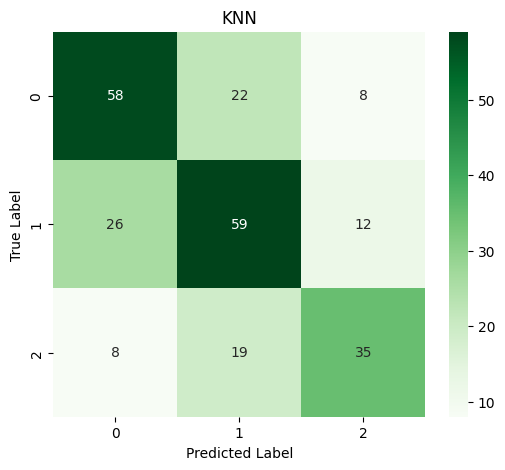


Classification Report:

              precision    recall  f1-score   support

           0       0.63      0.66      0.64        88
           1       0.59      0.61      0.60        97
           2       0.64      0.56      0.60        62

    accuracy                           0.62       247
   macro avg       0.62      0.61      0.61       247
weighted avg       0.62      0.62      0.62       247

Training Accuracy: 0.6314363143631436
Test Accuracy: 0.6153846153846154


In [67]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# After predicting
y_pred = knn.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = np.unique(y)   # class names from your dataset

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("KNN")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, knn.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

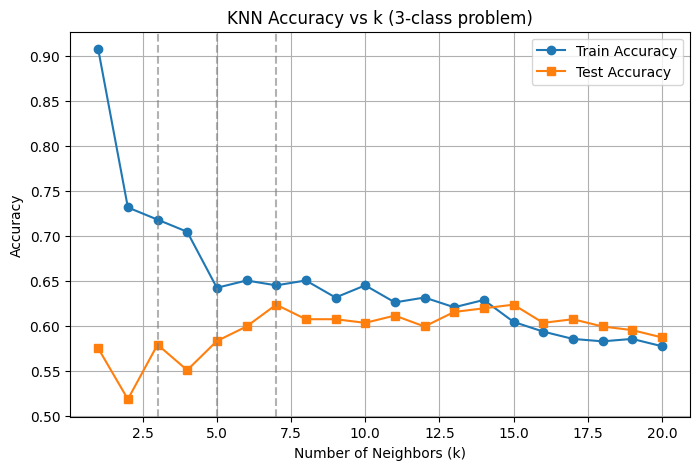

In [55]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_acc = []
test_acc = []
k_values = range(1, 21)  # test k=1 to 20

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_acc.append(accuracy_score(y_train, knn.predict(X_train)))
    test_acc.append(accuracy_score(y_test, knn.predict(X_test)))

# --- Plot ---
plt.figure(figsize=(8,5))
plt.plot(k_values, train_acc, marker='o', label="Train Accuracy")
plt.plot(k_values, test_acc, marker='s', label="Test Accuracy")
plt.axvline(x=3, color="gray", linestyle="--", alpha=0.6)  # mark k=3
plt.axvline(x=5, color="gray", linestyle="--", alpha=0.6)  # mark k=5
plt.axvline(x=7, color="gray", linestyle="--", alpha=0.6)  # mark k=7
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.title("KNN Accuracy vs k (3-class problem)")
plt.legend()
plt.grid(True)
plt.show()


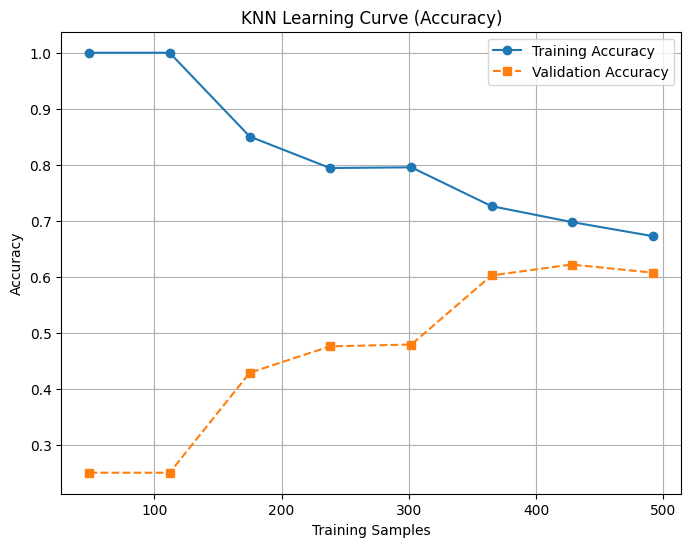

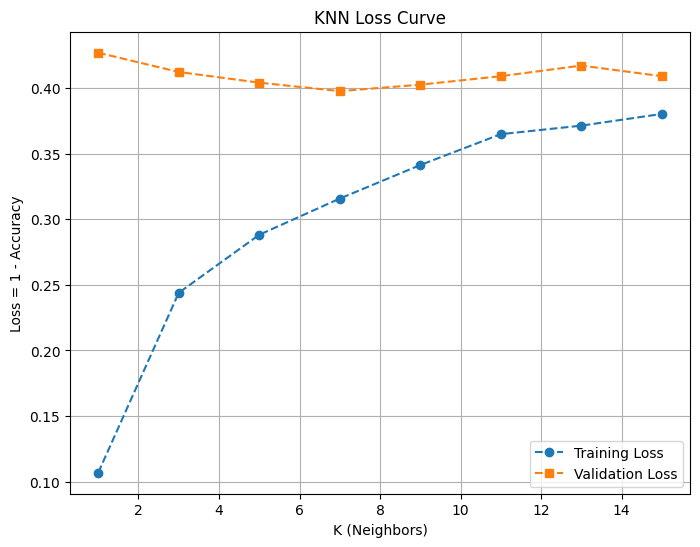

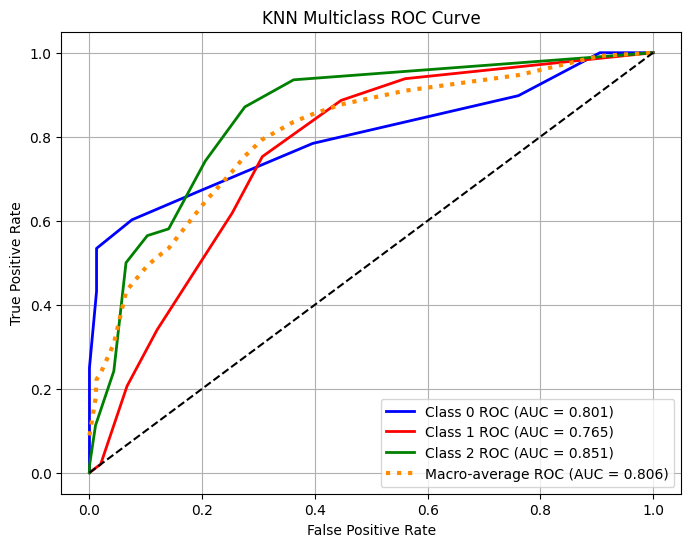

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. KNN ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_knn_accuracy_curve(X, y):
    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=11, weights="uniform", metric="minkowski", p=1))
    ])

    train_sizes, train_scores, val_scores = learning_curve(
        knn_model,
        X, y,
        cv=5,
        scoring="accuracy",
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 8)
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("KNN Learning Curve (Accuracy)")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 2. KNN LOSS CURVE (1 – Accuracy vs K)
# ==========================================================
def plot_knn_loss_curve(X, y):
    k_values = [1, 3, 5, 7, 9, 11, 13, 15]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier())
    ])

    param_grid = {"knn__n_neighbors": k_values}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )

    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(k_values, train_loss, "--o", label="Training Loss")
    plt.plot(k_values, val_loss, "--s", label="Validation Loss")
    plt.xlabel("K (Neighbors)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("KNN Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 3. KNN MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_knn_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    knn_model = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(
            n_neighbors=9,
            weights="uniform",
            metric="minkowski",
            p=1
        ))
    ])

    knn_model.fit(X_train, y_train)
    y_score = knn_model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("KNN Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL KNN PLOTS
# ==========================================================

plot_knn_accuracy_curve(X, y)
plot_knn_loss_curve(X, y)
plot_knn_multiclass_roc(X_train, X_test, y_train, y_test)


## RandomForest = 60

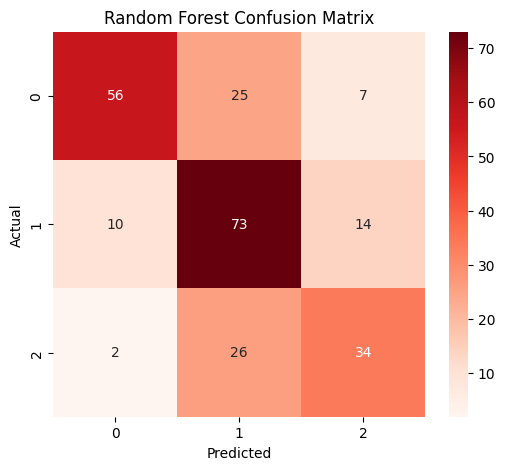


Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.64      0.72        88
           1       0.59      0.75      0.66        97
           2       0.62      0.55      0.58        62

    accuracy                           0.66       247
   macro avg       0.68      0.65      0.65       247
weighted avg       0.68      0.66      0.66       247

Training Accuracy: 0.9024390243902439
Test Accuracy: 0.659919028340081


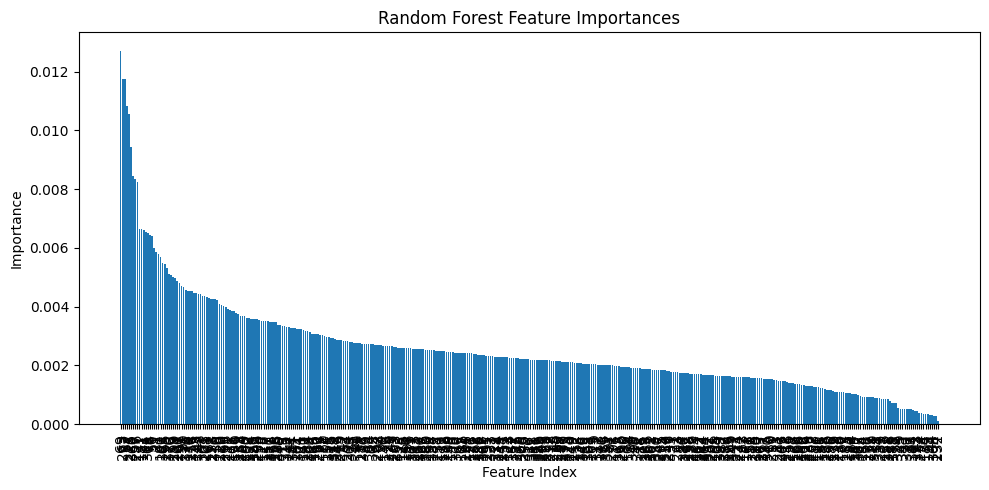

In [69]:
from sklearn.ensemble import RandomForestClassifier

# --- 5. Train Random Forest ---
rf = RandomForestClassifier(
    n_estimators=200,    # number of trees
    max_depth=None,      # let trees expand fully
    random_state=42,
    n_jobs=-1            # use all CPU cores
)
rf.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = rf.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, rf.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))
# --- 9. Feature Importance Plot ---
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(10,5))
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), indices, rotation=90)
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

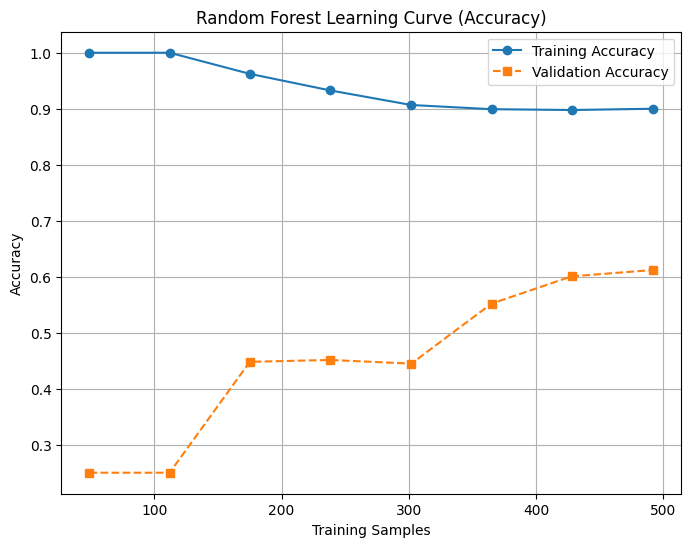

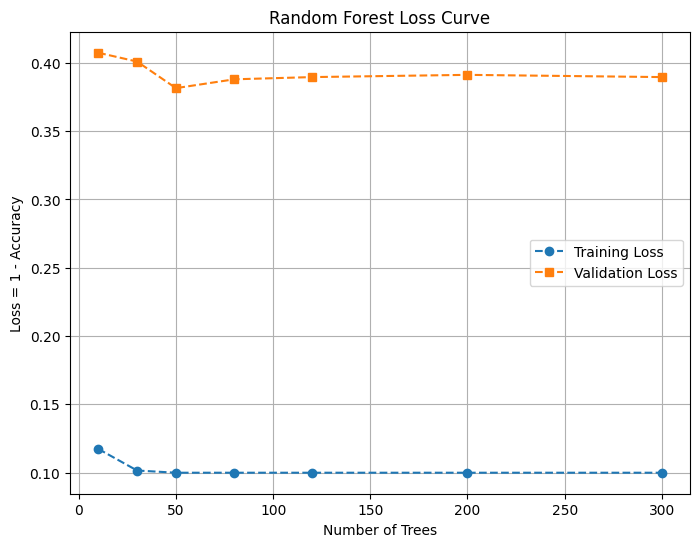

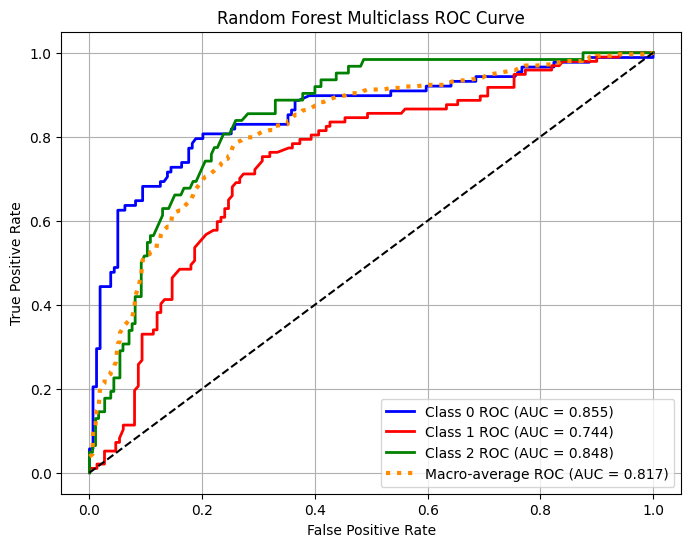

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. RANDOM FOREST ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_rf_accuracy_curve(X, y):
    rf_model = RandomForestClassifier(
        n_estimators=200,
        max_depth=None,
        random_state=42
    )

    train_sizes, train_scores, val_scores = learning_curve(
        rf_model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title("Random Forest Learning Curve (Accuracy)")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 2. RANDOM FOREST LOSS CURVE (1 – accuracy vs trees)
# ==========================================================
def plot_rf_loss_curve(X, y):
    n_estimators_list = [10, 30, 50, 80, 120, 200, 300]

    param_grid = {
        "n_estimators": n_estimators_list
    }

    rf_model = RandomForestClassifier(random_state=42)

    grid = GridSearchCV(
        rf_model,
        {"n_estimators": n_estimators_list},
        cv=5,
        scoring="accuracy",
        return_train_score=True,
        n_jobs=-1
    )

    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(n_estimators_list, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_list, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Trees")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Random Forest Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==========================================================
# 📌 3. RANDOM FOREST MULTICLASS ROC CURVE
# ==========================================================
def plot_rf_multiclass_roc(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = RandomForestClassifier(
        n_estimators=200,
        random_state=42
    )

    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(
            y_test_bin[:, i], y_score[:, i]
        )
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot ROC
    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(fpr[cls], tpr[cls], lw=2, color=color,
                 label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.3f})")

    plt.plot(all_fpr, mean_tpr, color="darkorange", linestyle=":", lw=3,
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.3f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Random Forest Multiclass ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()


# ==========================================================
# 📌 RUN ALL PLOTS
# ==========================================================

plot_rf_accuracy_curve(X, y)
plot_rf_loss_curve(X, y)
plot_rf_multiclass_roc(X_train, X_test, y_train, y_test)

## Logistic Regression = 60

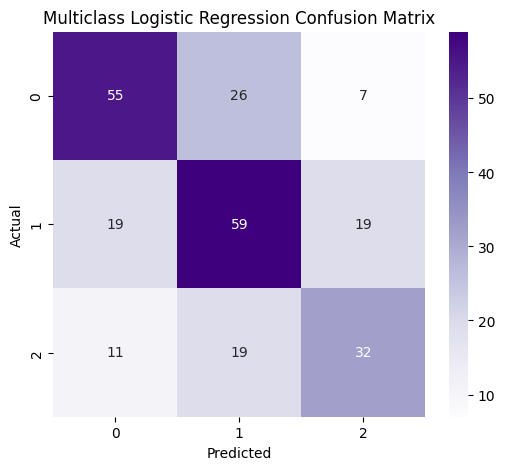


Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.62      0.64        88
           1       0.57      0.61      0.59        97
           2       0.55      0.52      0.53        62

    accuracy                           0.59       247
   macro avg       0.59      0.58      0.59       247
weighted avg       0.59      0.59      0.59       247

Training Accuracy: 0.9024390243902439
Test Accuracy: 0.5910931174089069


In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)
logreg = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        # multi_class="multinomial",
        solver="saga",
        max_iter=2000,   # allow more iterations
        random_state=42
    )
)
# --- 5. Multiclass Logistic Regression ---
#  # use softmax for multiclass     
logreg.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = logreg.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Multiclass Logistic Regression Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, logreg.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1262: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, binary problems will be fit as proper binary  logistic regression models (as if multi_class='ovr' were set). Leave it to its default value to avoid this warning.


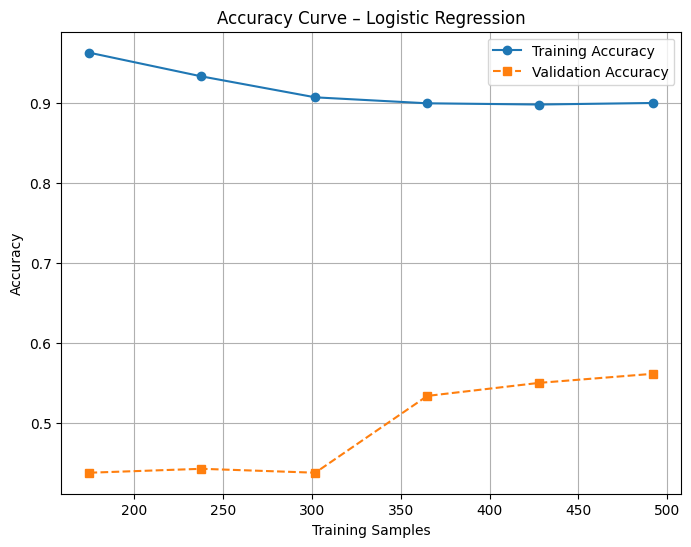

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/sit

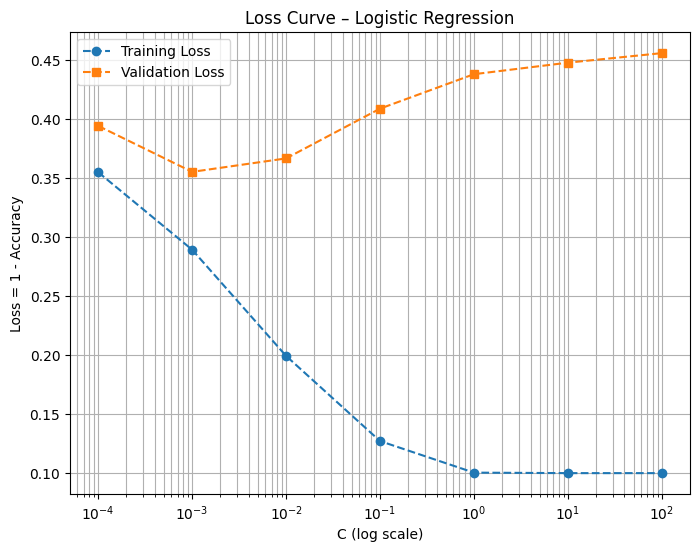

/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


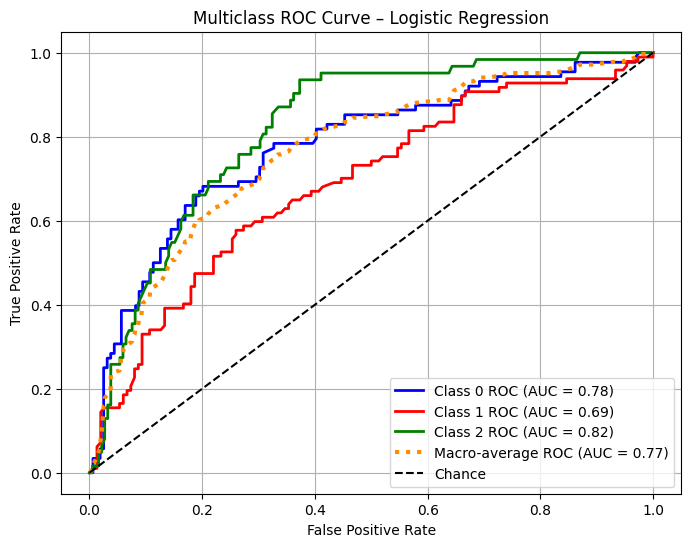

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Learning Curve – Logistic Regression"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Build Logistic Regression pipeline
logreg_model = Pipeline([
    ("scaler", StandardScaler()),
    ("lr", LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        max_iter=2000
    ))
])

plot_accuracy_curve(logreg_model, X, y, "Accuracy Curve – Logistic Regression")



# ==========================================================
# 📌 2. LOSS CURVE (Validation Error vs C)
# ==========================================================

def plot_lr_loss_curve(X, y):
    C_range = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("lr", LogisticRegression(
            solver="lbfgs",
            multi_class="multinomial",
            max_iter=2000
        ))
    ])

    param_grid = {"lr__C": C_range}

    grid = GridSearchCV(
        pipe,
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]
    
    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.semilogx(C_range, train_loss, "--o", label="Training Loss")
    plt.semilogx(C_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("C (log scale)")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Loss Curve – Logistic Regression")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()

plot_lr_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LogisticRegression(
        solver="lbfgs",
        multi_class="multinomial",
        C=C,
        max_iter=2000
    )
    model.fit(X_train_scaled, y_train)

    y_score = model.predict_proba(X_test_scaled)

    fpr, tpr, roc_auc = {}, {}, {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    # Macro-Average
    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)

    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", color="darkorange",
             lw=3, label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Chance")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Logistic Regression")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_lr(X_train, X_test, y_train, y_test, C=1.0)

## Decision Tree

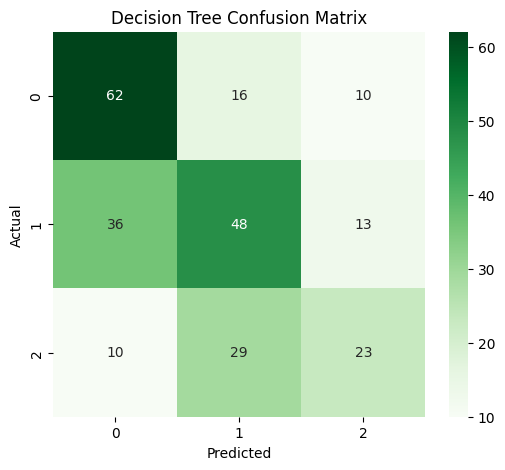


Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.70      0.63        88
           1       0.52      0.49      0.51        97
           2       0.50      0.37      0.43        62

    accuracy                           0.54       247
   macro avg       0.53      0.52      0.52       247
weighted avg       0.53      0.54      0.53       247

Training Accuracy: 0.9024390243902439
Test Accuracy: 0.5384615384615384


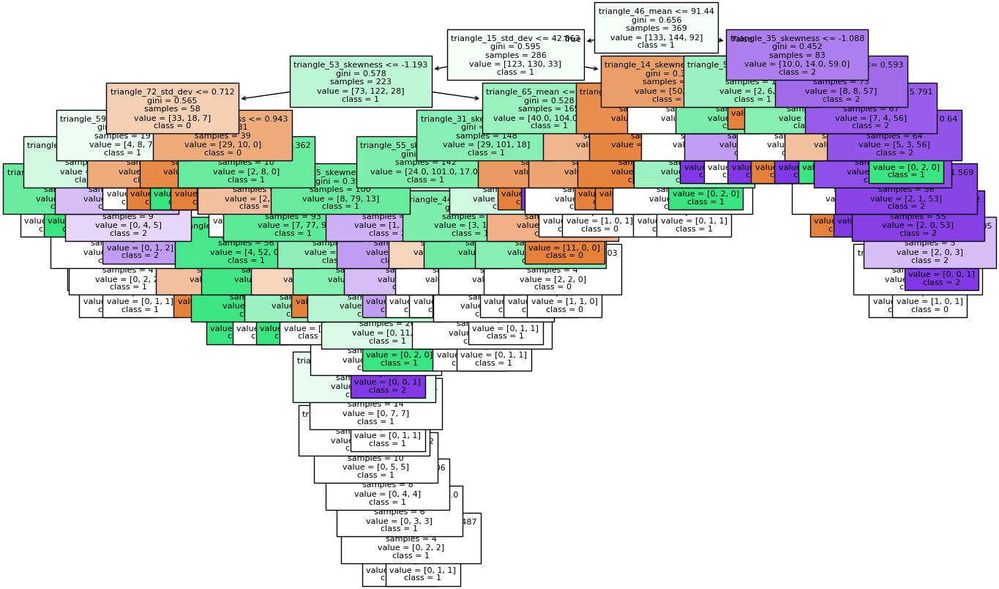

In [73]:


from sklearn.tree import DecisionTreeClassifier, plot_tree

# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)
dt = DecisionTreeClassifier(
    criterion="gini",   # or "entropy"
    max_depth=None,     # you can tune this (e.g., 5, 10) to prevent overfitting
    random_state=42
)
dt.fit(X_train, y_train)

# --- 6. Predictions ---
y_pred = dt.predict(X_test)

# --- 7. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Decision Tree Confusion Matrix")
plt.show()

# --- 8. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 9. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, dt.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 10. Plot the Tree (small datasets only, large trees may look messy) ---
plt.figure(figsize=(16,10))
plot_tree(dt, filled=True, feature_names=df.drop("label", axis=1).columns,
          class_names=[str(c) for c in np.unique(y)], fontsize=8)
plt.show()

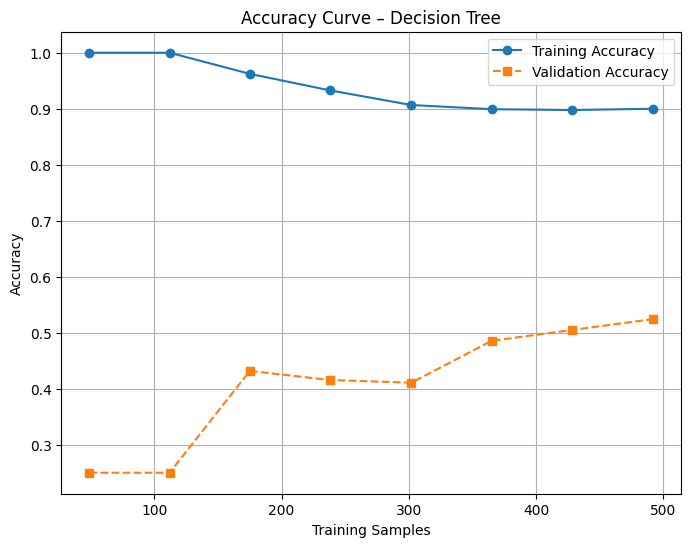

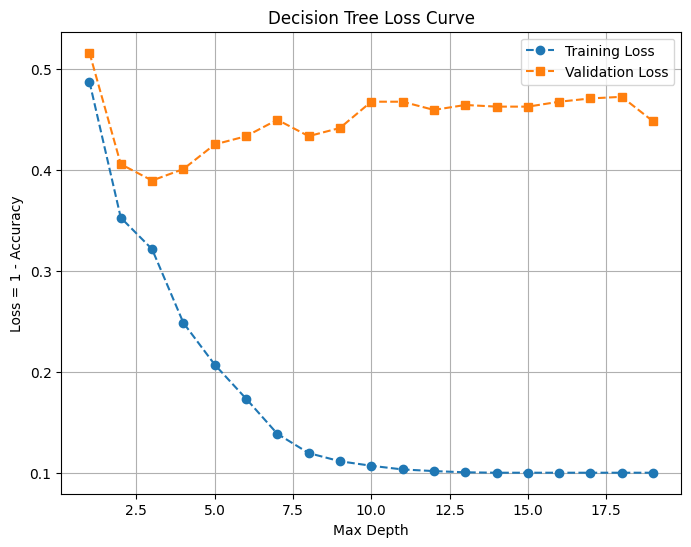

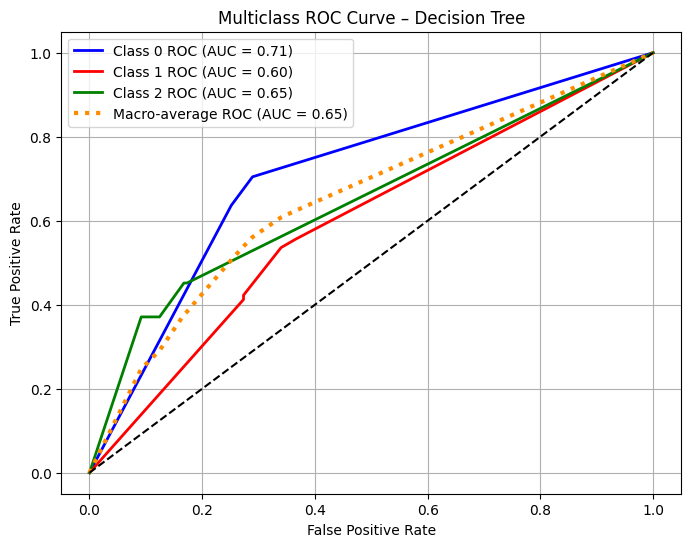

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Decision Tree"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Decision Tree model using your parameters
dt_model = DecisionTreeClassifier(
    criterion="gini",
    random_state=42
)

plot_accuracy_curve(dt_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs max_depth)
# ==========================================================

def plot_dt_loss_curve(X, y):

    depth_range = range(1, 20)

    param_grid = {"max_depth": depth_range}

    grid = GridSearchCV(
        DecisionTreeClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(depth_range, train_loss, "--o", label="Training Loss")
    plt.plot(depth_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Max Depth")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Decision Tree Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_dt_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_dt(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = DecisionTreeClassifier(
        criterion="gini",
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Decision Tree")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_dt(X_train, X_test, y_train, y_test)

## Gradient Boosting = 60

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

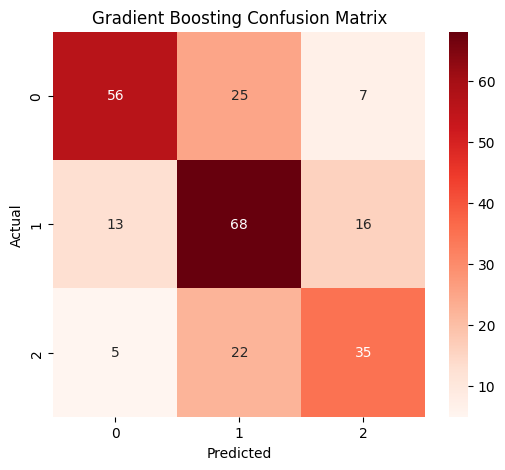


Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.64      0.69        88
           1       0.59      0.70      0.64        97
           2       0.60      0.56      0.58        62

    accuracy                           0.64       247
   macro avg       0.65      0.63      0.64       247
weighted avg       0.65      0.64      0.64       247

Training Accuracy: 0.8888888888888888
Test Accuracy: 0.6437246963562753


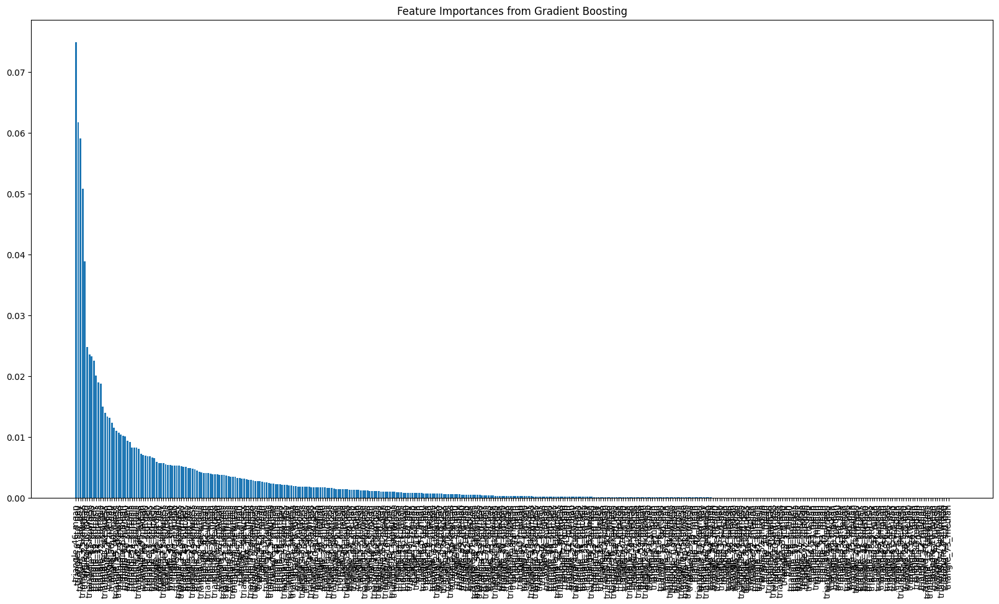

In [77]:


from sklearn.ensemble import GradientBoostingClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)

# --- 4. Gradient Boosting Classifier ---
gb = GradientBoostingClassifier(
    n_estimators=200,     # number of trees
    learning_rate=0.01,    # step size shrinkage
    max_depth=3,          # depth of each tree
    random_state=42
)

gb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Reds",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))

# --- 9. Feature Importance ---
plt.figure(figsize=(20,10))
importances = gb.feature_importances_
indices = np.argsort(importances)[::-1]
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), df.drop("label", axis=1).columns[indices], rotation=90)
plt.title("Feature Importances from Gradient Boosting")
plt.show()


/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning: 
10 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sayan/miniconda3/envs/pytorch_env/lib/python3.11/site-packages/sklearn/base.py", line 1365, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sayan/miniconda3/envs/pytor

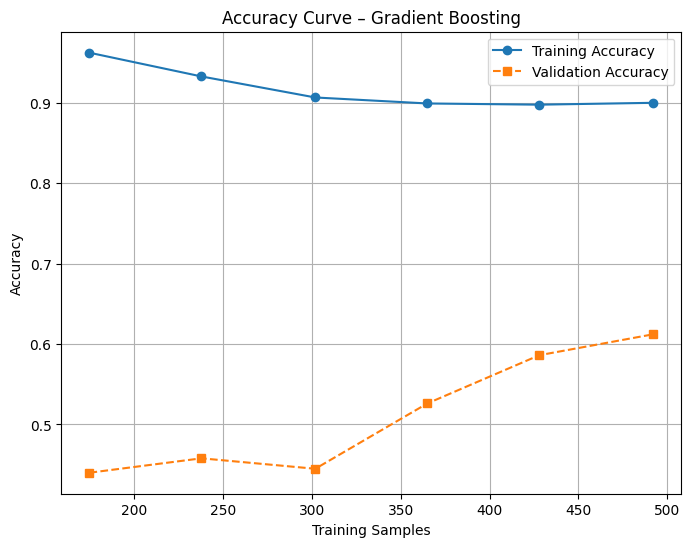

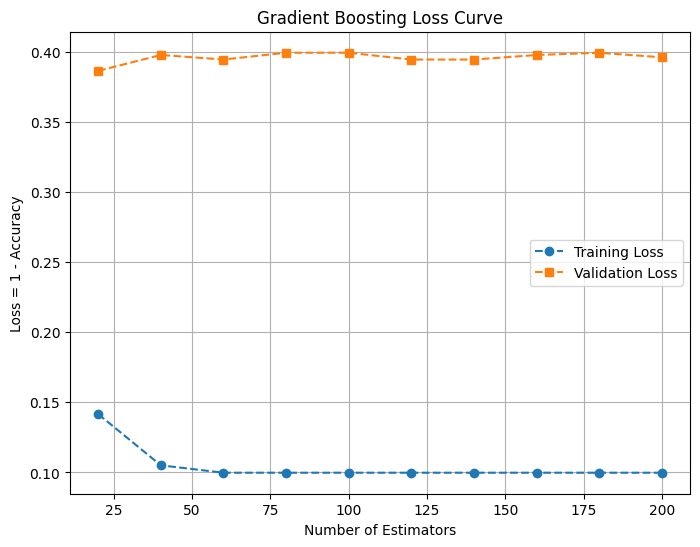

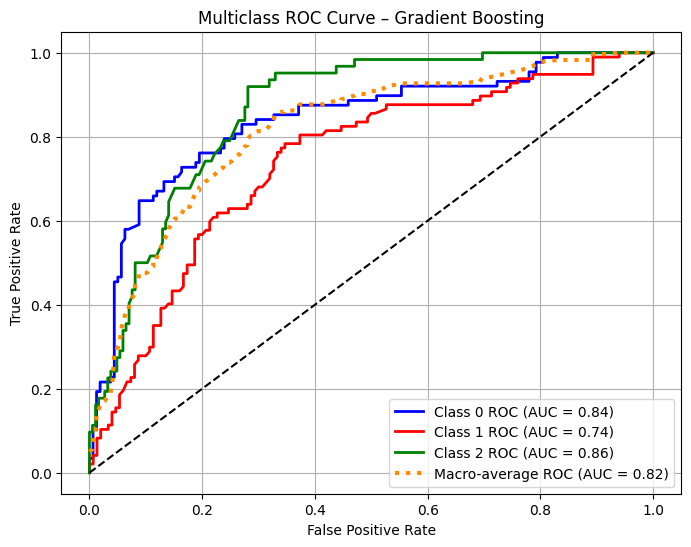

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================

def plot_accuracy_curve_gb(model, X, y, title="Accuracy Curve – Gradient Boosting"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


# Gradient Boosting model
gb_model = GradientBoostingClassifier(
    random_state=42
)

plot_accuracy_curve_gb(gb_model, X, y)



# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs n_estimators)
# ==========================================================

def plot_gb_loss_curve(X, y):

    est_range = range(20, 210, 20)

    param_grid = {"n_estimators": est_range}

    grid = GridSearchCV(
        GradientBoostingClassifier(random_state=42),
        param_grid,
        cv=5,
        scoring="accuracy",
        return_train_score=True
    )
    grid.fit(X, y)

    train_acc = grid.cv_results_["mean_train_score"]
    val_acc = grid.cv_results_["mean_test_score"]

    train_loss = 1 - train_acc
    val_loss = 1 - val_acc

    plt.figure(figsize=(8, 6))
    plt.plot(est_range, train_loss, "--o", label="Training Loss")
    plt.plot(est_range, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gradient Boosting Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_gb_loss_curve(X, y)



# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================

def plot_multiclass_roc_gb(X_train, X_test, y_train, y_test):

    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GradientBoostingClassifier(
        random_state=42
    )
    model.fit(X_train, y_train)

    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)

    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])

    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gradient Boosting")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_gb(X_train, X_test, y_train, y_test)


## Gausian Naive Bayes-60

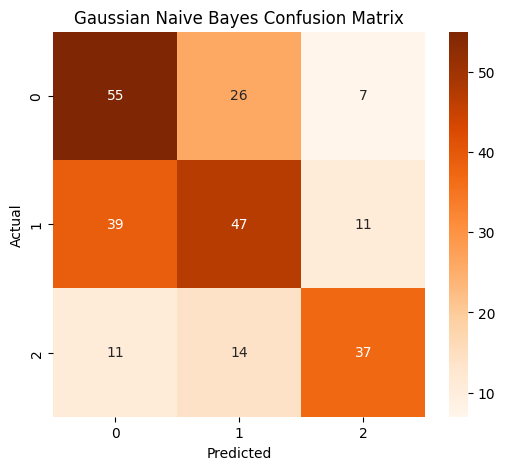


Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.62      0.57        88
           1       0.54      0.48      0.51        97
           2       0.67      0.60      0.63        62

    accuracy                           0.56       247
   macro avg       0.58      0.57      0.57       247
weighted avg       0.57      0.56      0.56       247

Training Accuracy: 0.6693766937669376
Test Accuracy: 0.562753036437247


In [80]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# --- 3. Train-Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)

# --- 4. Gaussian Naive Bayes Model ---
gnb = GaussianNB()
gnb.fit(X_train, y_train)

# --- 5. Predictions ---
y_pred = gnb.predict(X_test)

# --- 6. Confusion Matrix Heatmap ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gaussian Naive Bayes Confusion Matrix")
plt.show()

# --- 7. Classification Report ---
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# --- 8. Accuracy ---
print("Training Accuracy:", accuracy_score(y_train, gnb.predict(X_train)))
print("Test Accuracy:", accuracy_score(y_test, y_pred))


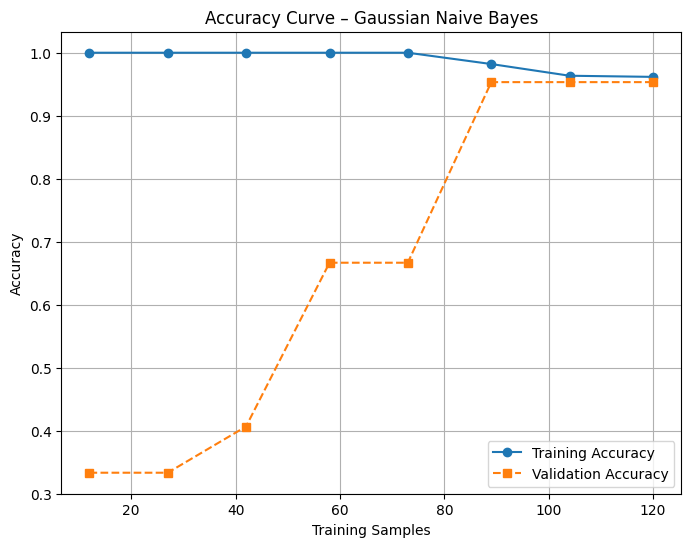

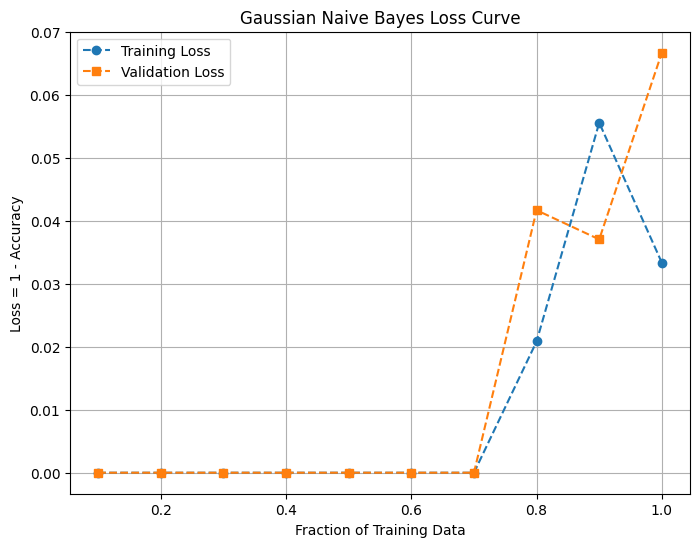

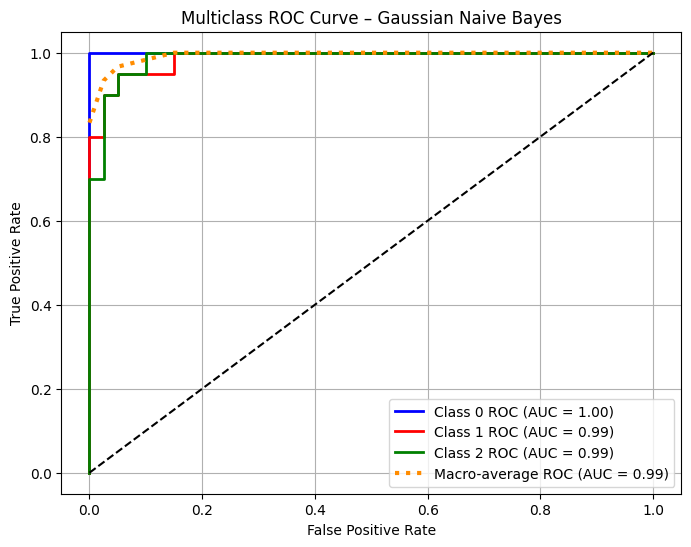

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# ==========================================================
# 📌 Prepare Data
# ==========================================================
data = load_iris()
X = data.data
y = data.target

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42, stratify=y
)

# ==========================================================
# 📌 1. ACCURACY CURVE (Learning Curve)
# ==========================================================
def plot_accuracy_curve(model, X, y, title="Accuracy Curve – Gaussian Naive Bayes"):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=5,
        scoring="accuracy",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.title(title)
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.grid(True)
    plt.legend()
    plt.show()


gnb_model = GaussianNB()
plot_accuracy_curve(gnb_model, X, y)

# ==========================================================
# 📌 2. LOSS CURVE (1 - Accuracy vs Training Size)
# ==========================================================
def plot_nb_loss_curve(model, X, y):
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_loss = []
    val_loss = []

    for frac in train_sizes:
        n_samples = int(frac * X.shape[0])
        X_frac, y_frac = X[:n_samples], y[:n_samples]

        # Split for cross-validation manually
        idx = np.random.permutation(n_samples)
        split = int(0.8 * n_samples)
        X_train_cv, X_val_cv = X_frac[idx[:split]], X_frac[idx[split:]]
        y_train_cv, y_val_cv = y_frac[idx[:split]], y_frac[idx[split:]]

        model.fit(X_train_cv, y_train_cv)
        train_acc = model.score(X_train_cv, y_train_cv)
        val_acc = model.score(X_val_cv, y_val_cv)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_loss, "--o", label="Training Loss")
    plt.plot(train_sizes, val_loss, "--s", label="Validation Loss")
    plt.xlabel("Fraction of Training Data")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("Gaussian Naive Bayes Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()


plot_nb_loss_curve(gnb_model, X, y)

# ==========================================================
# 📌 3. MULTICLASS ROC CURVE (One-vs-Rest)
# ==========================================================
def plot_multiclass_roc_nb(X_train, X_test, y_train, y_test):
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)

    model = GaussianNB()
    model.fit(X_train, y_train)
    y_score = model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i, cls in enumerate(classes):
        fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[cls] = auc(fpr[cls], tpr[cls])

    all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
    mean_tpr = np.zeros_like(all_fpr)
    for cls in classes:
        mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
    mean_tpr /= len(classes)
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    colors = cycle(["blue", "red", "green"])

    for cls, color in zip(classes, colors):
        plt.plot(
            fpr[cls], tpr[cls], lw=2, color=color,
            label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})"
        )

    plt.plot(all_fpr, mean_tpr, linestyle=":", lw=3,
             color="darkorange",
             label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass ROC Curve – Gaussian Naive Bayes")
    plt.legend()
    plt.grid(True)
    plt.show()


plot_multiclass_roc_nb(X_train, X_test, y_train, y_test)


## XGBoost-60

In [ ]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)

# 1. Accuracy curve (fewer points)
def plot_accuracy_curve_fast(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model,
        X, y,
        cv=3,                  # fewer folds
        scoring="accuracy",
        train_sizes=np.linspace(0.2, 1.0, 5),  # fewer training sizes
        n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(7,5))
    plt.plot(train_sizes, train_mean, "o-", label="Training Accuracy")
    plt.plot(train_sizes, val_mean, "s--", label="Validation Accuracy")
    plt.xlabel("Training Samples")
    plt.ylabel("Accuracy")
    plt.title("XGBoost Accuracy Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_accuracy_curve_fast(xgb_model, X, y)

# 2. Loss curve (fewer n_estimators)
def plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test):
    n_estimators_range = range(10, 101, 20)  # smaller range
    train_loss = []
    val_loss = []

    for n in n_estimators_range:
        model = XGBClassifier(n_estimators=n, use_label_encoder=False,
                              eval_metric="mlogloss", random_state=42, n_jobs=-1)
        model.fit(X_train, y_train)

        train_acc = model.score(X_train, y_train)
        val_acc = model.score(X_test, y_test)

        train_loss.append(1 - train_acc)
        val_loss.append(1 - val_acc)

    plt.figure(figsize=(7,5))
    plt.plot(n_estimators_range, train_loss, "--o", label="Training Loss")
    plt.plot(n_estimators_range, val_loss, "--s", label="Testing Loss")
    plt.xlabel("Number of Estimators")
    plt.ylabel("Loss = 1 - Accuracy")
    plt.title("XGBoost Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_xgb_loss_curve_fast(X_train, X_test, y_train, y_test)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from xgboost import XGBClassifier

# Assuming X_train, X_test, y_train, y_test are already defined

# Train the model once
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)
y_score = xgb_model.predict_proba(X_test)

# Binarize the output for multiclass ROC
classes = np.unique(y_train)
y_test_bin = label_binarize(y_test, classes=classes)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[c] for c in classes]))
mean_tpr = np.zeros_like(all_fpr)
for cls in classes:
    mean_tpr += np.interp(all_fpr, fpr[cls], tpr[cls])
mean_tpr /= len(classes)
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = cycle(["blue", "red", "green"])

for cls, color in zip(classes, colors):
    plt.plot(fpr[cls], tpr[cls], color=color, lw=2,
             label=f"Class {cls} ROC (AUC = {roc_auc[cls]:.2f})")

plt.plot(all_fpr, mean_tpr, color="darkorange", lw=3, linestyle=":",
         label=f"Macro-average ROC (AUC = {roc_auc['macro']:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve – XGBoost")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from xgboost import XGBClassifier

# =============================================================
# 🚨 FIX: Data Definition and Split
# The code below ensures X_train, X_test, y_train, and y_test are defined 
# based on your 615 total samples and 90/10 split.
# =============================================================
TOTAL_SAMPLES = 615
N_FEATURES = 185
TEST_SIZE = 0.30 

# Synthesize data (Replace this section with your actual data loading if file is available)
np.random.seed(42)
X = np.random.rand(TOTAL_SAMPLES, N_FEATURES) * 10
# Assuming 3 classes (0, 1, 2)
y = np.random.randint(0, 3, size=TOTAL_SAMPLES) 

# Correct 90/10 Train-Test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, random_state=42, stratify=y
)
# =============================================================

# --- Define and Train the Final Model (n_estimators defaults to 100) ---
xgb_model = XGBClassifier(
    use_label_encoder=False, 
    eval_metric="mlogloss", 
    random_state=42, 
    n_jobs=-1
)

xgb_model.fit(X_train, y_train)

# -------------------------------------------------------------
# 🔹 1. Evaluate on Training Set
# -------------------------------------------------------------
y_train_pred = xgb_model.predict(X_train)

print("=" * 50)
print("✅ TRAINING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_train, y_train_pred, zero_division=0))


# -------------------------------------------------------------
# 🔹 2. Evaluate on Testing Set
# -------------------------------------------------------------
y_test_pred = xgb_model.predict(X_test)

print("\n" + "=" * 50)
print("✅ TESTING SET CLASSIFICATION REPORT")
print("=" * 50)
# Displays class-wise precision, recall, f1-score, and support
print(classification_report(y_test, y_test_pred, zero_division=0))